# **Project 4 - Q Learning**

For this project, you will be tasked with both implementing and explaining key components of the Q-learning algorithm.

All the code deliverables has to be provided within this notebook.

# 1 - Packages
Let's first import all the packages that you will need during this assignment.

* 
[numpy](https://numpy.org/) - is the main package for scientific computing with Python
*
[matplotlib](https://matplotlib.org/) - is a plotting library
*
[gym](https://gym.openai.com/docs/) - Gym is a toolkit for developing and comparing reinforcement learning algorithms.
*
[gym.spaces](http://gym.openai.com/docs/) - Every environment comes with an action_space and an observation_space. These attributes are of type Space, and they describe the format of valid actions and observations.
*
[time](https://docs.python.org/3/library/time.html?highlight=time#module-time) - will be used to track how much time each computation takes
*
[copy](https://docs.python.org/3/library/copy.html) - A copy is sometimes needed so one can change one copy without changing the other.
*
[Threading](https://docs.python.org/3/library/threading.html) - This module constructs higher-level threading interfaces on top of the lower level thread module.
*
[Collections](https://docs.python.org/2/library/collections.html) - This module implements specialized container datatypes providing alternatives to Python’s general purpose built-in containers, dict, list, set, and tuple.


In [0]:
#######################################################################
# Authors:
# Nathan Margaglio (nathanmargaglio@gmail.com)                                                          
# Mihir Hemant Chauhan (mihirhem@buffalo.edu)                       
# Qian Cheng (qcheng2@buffalo.edu)                            
#######################################################################
import numpy as np
import matplotlib.pyplot as plt
import gym
import gym.spaces
import time
import copy
import threading
import time
import collections

`## Basic Environment
Here we define our grid-world environment. No need to make any changes.

In [0]:
class GridEnvironment(gym.Env):
    metadata = { 'render.modes': ['human'] }
    
    def __init__(self, normalize=False, size=4):
        self.observation_space = gym.spaces.Box(0, size, (size,))
        self.action_space = gym.spaces.Discrete(4)
        self.max_timesteps = size*2 + 1
        self.normalize = normalize
        self.size = size

        # Generate State Transition Table
        self.transition_matrix = []
        for x in range(size + 1):
            state_x = []
            for y in range(size + 1):
                state_y = []
                for a in range(4):
                    one_hot = np.zeros(4)
                    one_hot[a] = 1
                    state_y.append(one_hot)
                state_x.append(state_y)
            self.transition_matrix.append(state_x)
        
    def transition_func(self, x, y, action, return_probs=False):
        probs = self.transition_matrix[x][y][action]
        if return_probs:
            return probs
        else:
            return np.random.choice(len(probs), p=probs)

    def _get_distance(self, x, y):
        return abs(x[0] - y[0]) + abs(x[1] - y[1])
        
    def reset(self):
        self.timestep = 0
        self.agent_pos = [0, 0]
        self.goal_pos = [self.size, self.size]
        self.state = np.zeros((self.size + 1, self.size + 1))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.5
        self.prev_distance = self._get_distance(self.agent_pos, self.goal_pos)
        return np.array(self.agent_pos)/1.
    
    def step(self, action):
        action_taken = self.transition_func(self.agent_pos[0], self.agent_pos[1], action)
        self.state = np.random.choice(self.observation_space.shape[0])
        if action_taken == 0:
            self.agent_pos[0] += 1
        if action_taken == 1:
            self.agent_pos[0] -= 1
        if action_taken == 2:
            self.agent_pos[1] += 1
        if action_taken == 3:
            self.agent_pos[1] -= 1
          
        self.agent_pos = np.clip(self.agent_pos, 0, self.size)
        self.state = np.zeros((self.size + 1, self.size + 1))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.5
        
        current_distance = self._get_distance(self.agent_pos, self.goal_pos)
        if current_distance < self.prev_distance:
            reward = 1
        elif current_distance > self.prev_distance:
            reward = -1
        else:
            reward = -1
        self.prev_distance = current_distance
        
        self.timestep += 1
        if self.timestep >= self.max_timesteps or current_distance == 0:
            done = True
        else:
            done = False
        info = {}
        
        obs = self.agent_pos
        if self.normalize:
            obs = obs/self.size
        return obs, reward, done, info
        
    def render(self, mode='human'):
        plt.imshow(self.state)

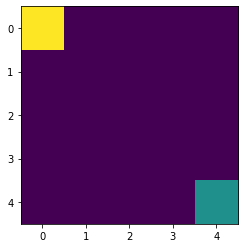

In [3]:
env = GridEnvironment()
obs = env.reset()
env.render()

## Random Agent
This runs the environment with a random agent that just takes random actions. Neither does he learn, nor remember anything. Try to run it!

In [0]:
class RandomAgent:
    def __init__(self, env):
        self.env = env
        self.observation_space = env.observation_space
        self.action_space = env.action_space

    def policy(self, observation):
        return np.random.choice(self.action_space.n)
        
    def step(self, observation, verbose=False):
        return self.policy(observation)

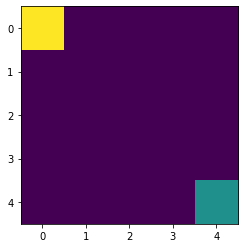

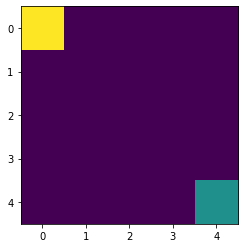

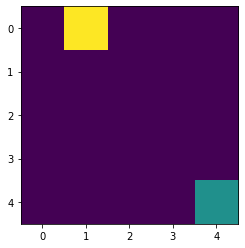

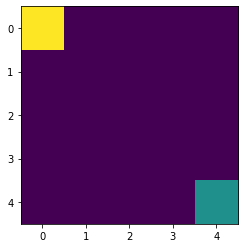

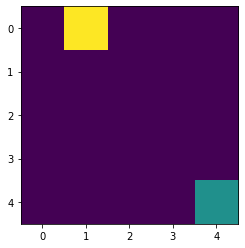

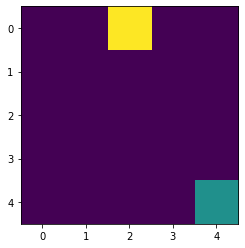

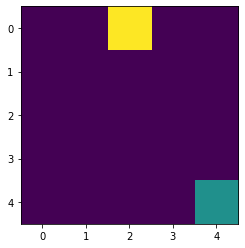

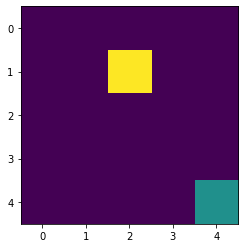

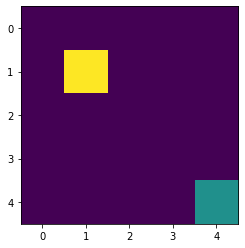

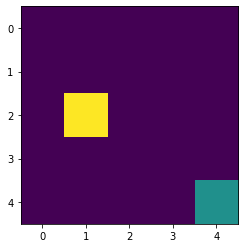

In [5]:
env = GridEnvironment(normalize=True)
agent = RandomAgent(env)

obs = env.reset()
done = False
agent.epsilon = 0
env.render()
plt.show()

while not done:
    action = agent.step(obs, verbose=True)
    obs, reward, done, info = env.step(action)
    env.render()
    plt.show()

## Heuristic Agent
This runs the environment with a heuristic agent. No need to make any changes. Try to run it!

In [0]:
class HeuristicAgent:
    def __init__(self, env):
        self.env = env
        self.observation_space = env.observation_space
        self.action_space = env.action_space

    def policy(self, observation):
        # 0 - down
        # 1 - up
        # 2 - right
        # 3 - left
        if (observation[0] < 1.):
            return 0
        if (observation[1] < 1.):
            return 2
        return 0
        
    def step(self, observation, verbose=False):
        if verbose:
            print(observation)
        return self.policy(observation)

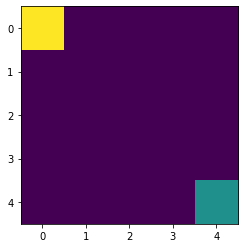

[0. 0.]


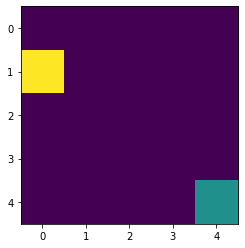

[0.25 0.  ]


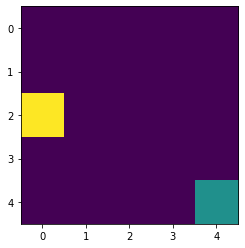

[0.5 0. ]


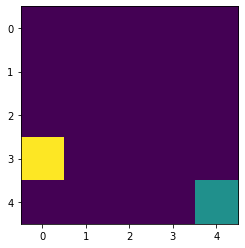

[0.75 0.  ]


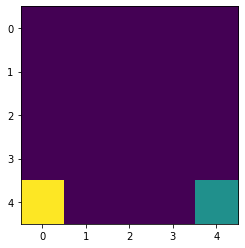

[1. 0.]


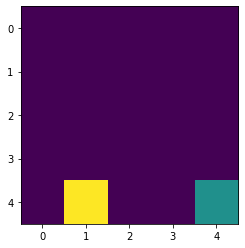

[1.   0.25]


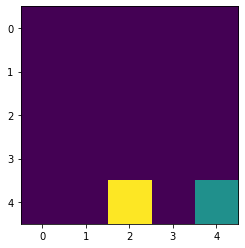

[1.  0.5]


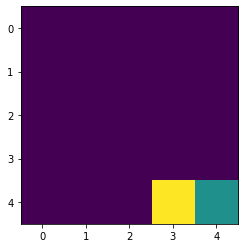

[1.   0.75]


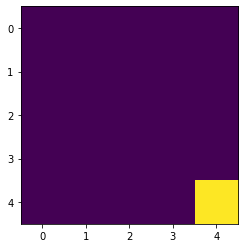

In [7]:
env = GridEnvironment(normalize=True)
agent = HeuristicAgent(env)

obs = env.reset()
done = False
agent.epsilon = 0
env.render()
plt.show()

while not done:
    action = agent.step(obs, verbose=True)
    obs, reward, done, info = env.step(action)
    env.render()
    plt.show()

## Tabular Q-Learning
This is where you need to define policy and update Q tables.
For policy.

*  
[np.argmax](https://docs.scipy.org/doc/numpy/reference/generated/numpy.argmax.html) - Returns the indices of the maximum values along an axis.

### Epsilon

Our agent will randomly select its action at first by a certain percentage, called ‘exploration rate’ or ‘epsilon’. This is because at first, it is better for the agent to try all kinds of things before it starts to see the patterns. When it is not deciding the action randomly, the agent will predict the reward value based on the current state and pick the action that will give the highest reward. We want our agent to decrease the number of random action, as it goes, so we indroduce an exponential-decay epsilon, that eventually will allow our agent to explore the evironment. \\



###  <font color='red'>Task 1: Implement policy function.</font>  <br>
**Instructions:**
- Our agent will randomly select its action at first by a certain percentage, called ‘exploration rate’ or ‘epsilon’. This is because at first, it is better for the agent to try all kinds of things before it starts to see the patterns. Select a random uniform number. If it's less than epsilon, return the random choice action space.
- When it is not deciding the action randomly, the agent will predict the reward value based on the current state and pick the action that will give the highest reward. 
\begin{align} \notag
\pi\left(s_{t}\right)=\underset{a \in A}{\operatorname{argmax}} Q_{\theta}\left(s_{t}, a\right)
\end{align} 
- Return the policy
- Please note, that the name for all the variables should start with <mark>self</mark>, thus </br> 

epsilon $\rightarrow$ self.epsilon </br> 
action_space $\rightarrow$ self.action_space

###  <font color='red'>Task 2: Update Q-table</font>  <br>
**Instructions:**
            \begin{align} \notag
            Q^{n e w}\left(s_{t}, a_{t}\right) \leftarrow(1-\alpha) \cdot \underbrace{Q\left(s_{t}, a_{t}\right)}_{\text {old value }}+\underbrace{\alpha}_{\text {learning rate }} \cdot \overbrace{(\underbrace{r_{t}}_{\text {reward }} + \underbrace{\gamma}_{\text {discount factor }} \underbrace{\max _{a} Q\left(s_{t+1}, a\right)}_{a})}^{\text {learned value }}
            \end{align} 

In [0]:
class QLearningAgent:
    def __init__(self, env, epsilon=1.0, lr=0.1, gamma=0.9):
        self.env = env
        self.observation_space = env.observation_space
        self.action_space = env.action_space
        q_table_dim = env.observation_space.shape[0] + 1
        self.q_table = np.zeros((q_table_dim, q_table_dim, env.action_space.n))
        self.epsilon = epsilon
        self.lr = lr
        self.gamma = gamma

    def policy(self, observation):
      # Code for policy (Task 1) (30 points)
        mx_nxt_reward = 0
        action = ""
        print("Action:", self.action_space)
        print("Q_table:",self.q_table)
        if np.random.uniform(0, 1) <= self.epsilon:
            action = np.random.choice(self.action_space.n)
        else:
            for a in range(self.action_space.n):
                print("Observation:", int(observation[0]), int(observation[1]))
                current_position = self.env.state
                print("State:",current_position)
                print("Q_table:",self.q_table)
                nxt_reward = self.q_table[int(observation[0])][int(observation[1])][a]
                if nxt_reward >= mx_nxt_reward:
                    action = a
                    mx_nxt_reward = nxt_reward
        return action

    def step(self, observation):
        return self.policy(observation)

    def update(self, state, action, reward, next_state):
        state = state.astype(int)
        next_state = next_state.astype(int)
        # Code for updating Q Table (Task 2) (20 points)
        old_qvalue = self.q_table[state[0]][state[1]][action]
        max_qvalue = np.amax(self.q_table[next_state[0]][next_state[1]])
        new_qvalue = (1 - self.lr) * old_qvalue + self.lr * (reward + self.gamma * max_qvalue)
        self.q_table[state[0]][state[1]][action] = new_qvalue

    def set_epsilon(self, epsilon):
        self.epsilon = epsilon

### Training
### Environment
First, we initialize our environment.  The environment, loosely structured like [OpenAI's Gym Environments](https://gym.openai.com/), has three main methods: `reset`, `step` and `render`. You'll only need `reset` and `step` here.

- When we call **reset**, we initialize the environment with a fresh episode. This allows us to effectively run through episodes (only needing to call reset at the beginning of an episode), but, more importantly, `reset()` returns the environment's initial state.

- The **step** method accepts an action as a parameter (which, for this example, is an integer in [0, 3]), processes the action, and returns the new state, the reward for performing the action, and a boolean indicating if the run is over.

### Agent
When we initialize the agent, we must pass both a `environment` into QLearningAgent function.
###  <font color='red'>Task 3: Implement the training algorithm</font>  <br>
**Instructions:**
- After initialization, pass the initial state to obs. Then check if it's already done. If done = False, you'll keep going. While it's not done, you'll need to update `state`, `action`,`reward` and `next_state`. You can get action by `step` the current state on agent. Use `copy` to record the current state. `step` the current action on environment to return the new state, the reward for performing the action, a boolean indicating if the run is over and some other information. Add the new reward on the total rewards. Use `copy` to save the new state returned by `step`. Update the `state`, `action`, `reward`, `next_state` of agent.

Round 0
Action: Discrete(4)
Q_table: [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
State [1 0]


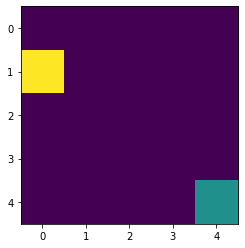

Action: Discrete(4)
Q_table: [[[0.1 0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]]

 [[0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]]

 [[0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]]

 [[0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]]

 [[0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]
  [0.  0.  0.  0. ]]]
State [0 0]


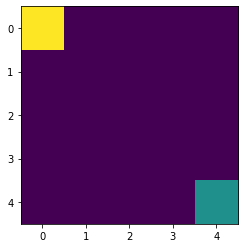

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 1]


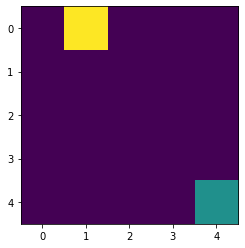

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 1]


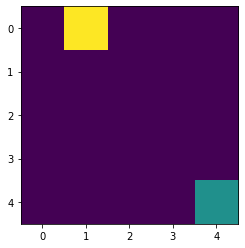

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.    -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [1 1]


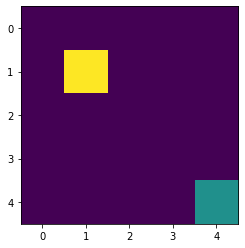

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.1   -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [1 2]


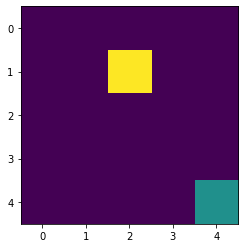

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.1   -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.1    0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 2]


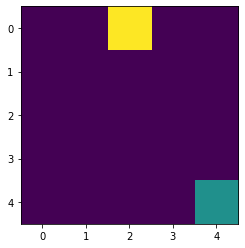

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.1   -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.1    0.   ]
  [ 0.    -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 1]


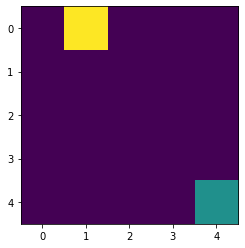

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.1   -0.1    0.     0.   ]
  [ 0.     0.     0.    -0.091]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.1    0.   ]
  [ 0.    -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 2]


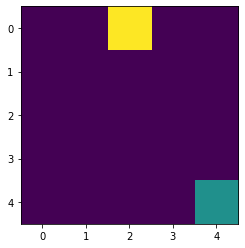

Episode: 0
Epsilon: 0.9
Total Rewards: 1
Round 1
Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.1    0.   ]
  [ 0.1   -0.1    0.1    0.   ]
  [ 0.     0.     0.    -0.091]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.1    0.   ]
  [ 0.    -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 1]


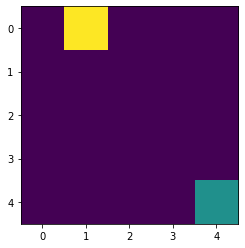

Action: Discrete(4)
Q_table: [[[ 0.1    0.     0.199  0.   ]
  [ 0.1   -0.1    0.1    0.   ]
  [ 0.     0.     0.    -0.091]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.    -0.091  0.     0.   ]
  [ 0.     0.     0.1    0.   ]
  [ 0.    -0.1    0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]

 [[ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]
  [ 0.     0.     0.     0.   ]]]
State [0 0]


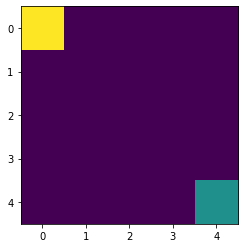

Action: Discrete(4)
Q_table: [[[ 0.1      0.       0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.091    0.       0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

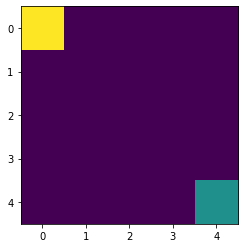

Action: Discrete(4)
Q_table: [[[ 0.1     -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.091    0.       0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

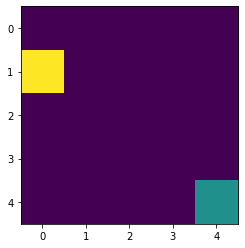

Action: Discrete(4)
Q_table: [[[ 0.19    -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.091    0.       0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

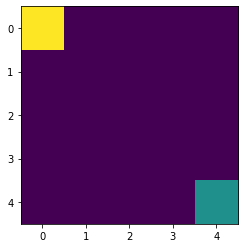

Action: Discrete(4)
Q_table: [[[ 0.19    -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.       0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

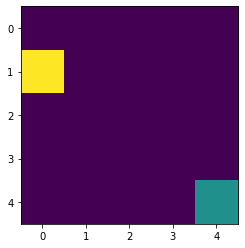

Action: Discrete(4)
Q_table: [[[ 0.271   -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.       0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

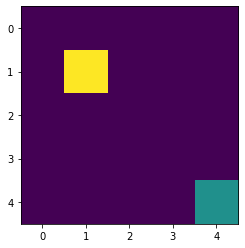

Action: Discrete(4)
Q_table: [[[ 0.271   -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.109    0.     ]
  [ 0.       0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

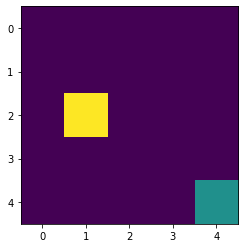

Action: Discrete(4)
Q_table: [[[ 0.271   -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.109    0.     ]
  [ 0.1      0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

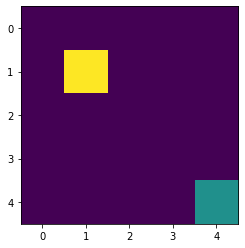

Episode: 1
Epsilon: 0.81
Total Rewards: 1
Round 2
Action: Discrete(4)
Q_table: [[[ 0.271   -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.109    0.     ]
  [ 0.1      0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.      -0.091    0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.

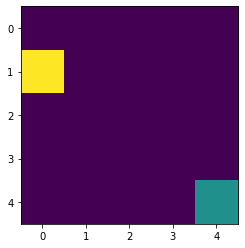

Action: Discrete(4)
Q_table: [[[ 0.35371 -0.08209  0.199    0.     ]
  [ 0.1     -0.1      0.1     -0.08209]
  [ 0.       0.       0.      -0.091  ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.      -0.16399  0.109    0.     ]
  [ 0.1      0.       0.1      0.     ]
  [ 0.      -0.1      0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.      -0.091    0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]]

 [[ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [ 0.       0.       0.       0.     ]
  [

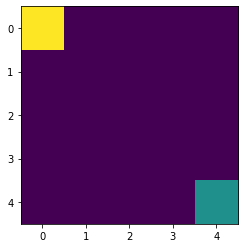

Action: Discrete(4)
Q_table: [[[ 0.35371   -0.08209    0.199      0.       ]
  [ 0.1       -0.1        0.1       -0.08209  ]
  [ 0.         0.         0.        -0.091    ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.        -0.2157571  0.109      0.       ]
  [ 0.1        0.         0.1        0.       ]
  [ 0.        -0.1        0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.        -0.091      0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[

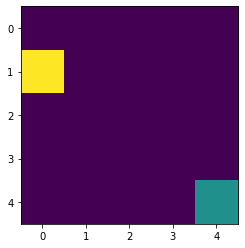

Action: Discrete(4)
Q_table: [[[ 0.428149  -0.08209    0.199      0.       ]
  [ 0.1       -0.1        0.1       -0.08209  ]
  [ 0.         0.         0.        -0.091    ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.        -0.2157571  0.109      0.       ]
  [ 0.1        0.         0.1        0.       ]
  [ 0.        -0.1        0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.        -0.091      0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[

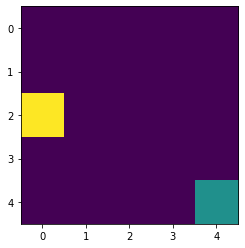

Action: Discrete(4)
Q_table: [[[ 0.428149  -0.08209    0.199      0.       ]
  [ 0.1       -0.1        0.1       -0.08209  ]
  [ 0.         0.         0.        -0.091    ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.1       -0.2157571  0.109      0.       ]
  [ 0.1        0.         0.1        0.       ]
  [ 0.        -0.1        0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.        -0.091      0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[

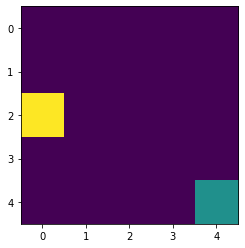

Action: Discrete(4)
Q_table: [[[ 0.428149  -0.08209    0.199      0.       ]
  [ 0.1       -0.1        0.1       -0.08209  ]
  [ 0.         0.         0.        -0.091    ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.1       -0.2157571  0.109      0.       ]
  [ 0.1        0.         0.1        0.       ]
  [ 0.        -0.1        0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.        -0.1      ]
  [ 0.        -0.091      0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[

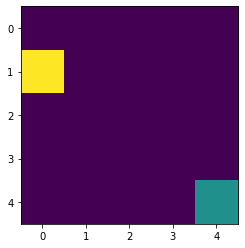

Action: Discrete(4)
Q_table: [[[ 0.428149  -0.08209    0.199      0.       ]
  [ 0.1       -0.1        0.1       -0.08209  ]
  [ 0.         0.         0.        -0.091    ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.1       -0.2157571  0.109      0.       ]
  [ 0.1        0.         0.1        0.       ]
  [ 0.        -0.1        0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.        -0.09019    0.        -0.1      ]
  [ 0.        -0.091      0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]
  [ 0.         0.         0.         0.       ]]

 [[

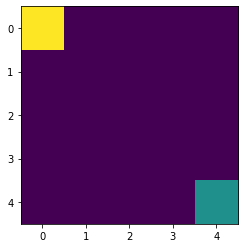

Action: Discrete(4)
Q_table: [[[ 0.428149   -0.08209     0.199       0.        ]
  [ 0.1        -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

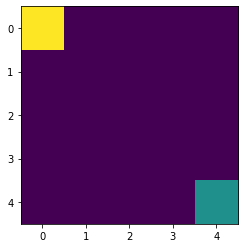

Action: Discrete(4)
Q_table: [[[ 0.428149   -0.08209     0.199      -0.06146659]
  [ 0.1        -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

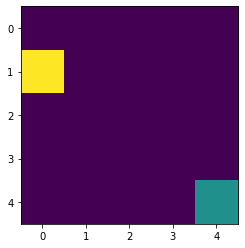

Episode: 2
Epsilon: 0.7290000000000001
Total Rewards: -1
Round 3
Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.199      -0.06146659]
  [ 0.1        -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          

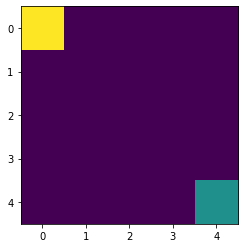

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.199      -0.11075696]
  [ 0.1        -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

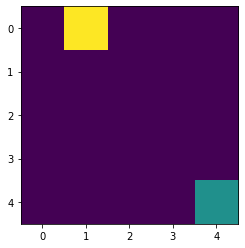

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.1        -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

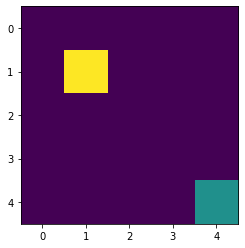

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1         0.        ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

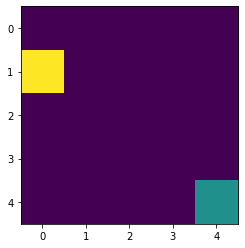

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1        -0.09019   ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

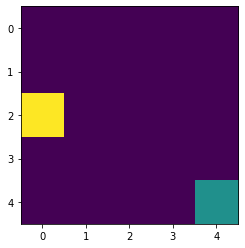

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1        -0.09019   ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.         -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

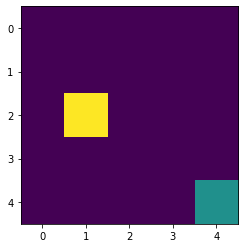

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1        -0.09019   ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.091       0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

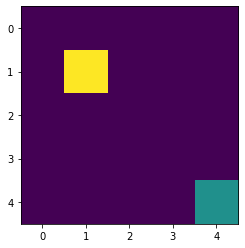

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.1        -0.09019   ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

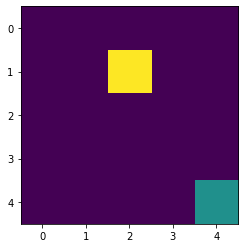

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

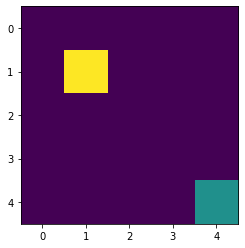

Episode: 3
Epsilon: 0.6561000000000001
Total Rewards: 1
Round 4
Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.11075696]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0

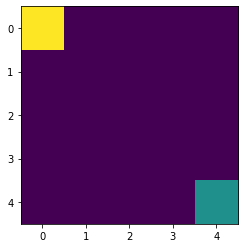

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.1551183 ]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

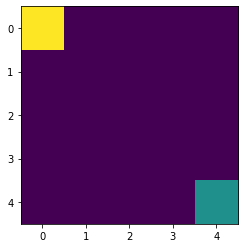

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.1950435 ]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

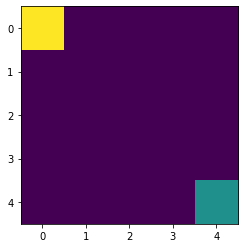

Action: Discrete(4)
Q_table: [[[ 0.4951441  -0.08209     0.2881     -0.23097618]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

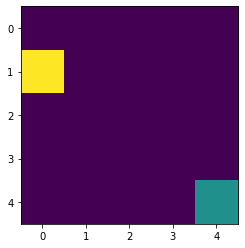

Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.2881     -0.23097618]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.25564798  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

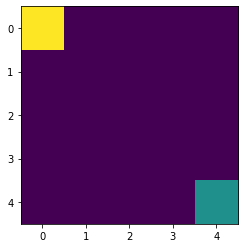

Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.2881     -0.23097618]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

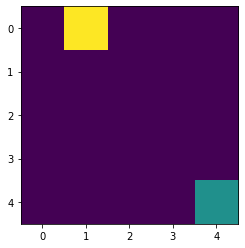

Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.1        -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

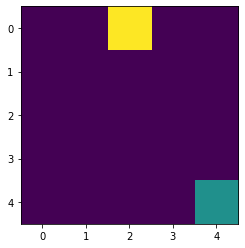

Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

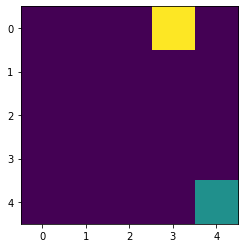

Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

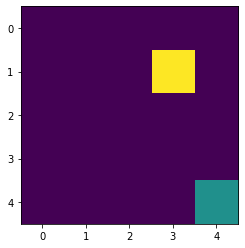

Episode: 4
Epsilon: 0.5904900000000002
Total Rewards: 1
Round 5
Action: Discrete(4)
Q_table: [[[ 0.56272969 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0

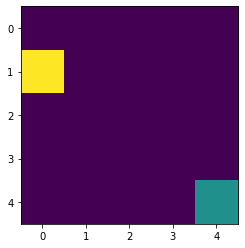

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.19       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

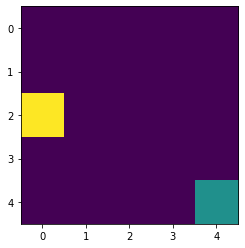

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.28       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.09019     0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

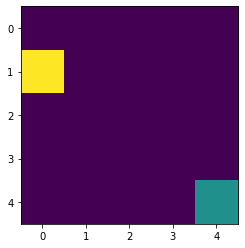

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.28       -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

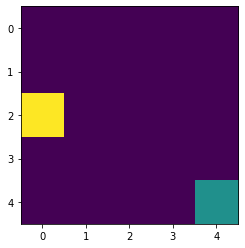

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.1        -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

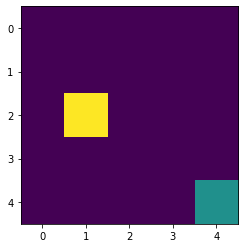

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.         -0.1729      0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

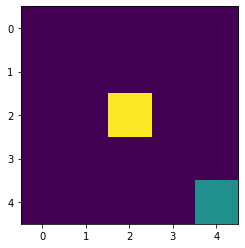

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.         -0.1729      0.1         0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

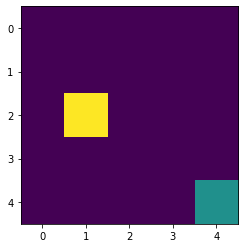

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.         -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

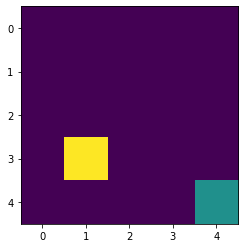

Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

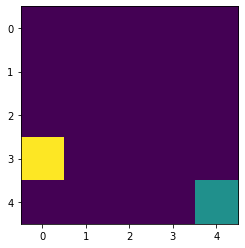

Episode: 5
Epsilon: 0.5314410000000002
Total Rewards: 3
Round 6
Action: Discrete(4)
Q_table: [[[ 0.62355672 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0

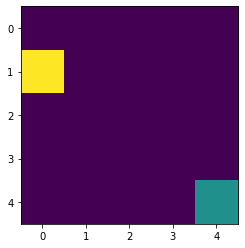

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.361      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

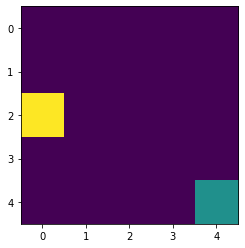

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.         -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

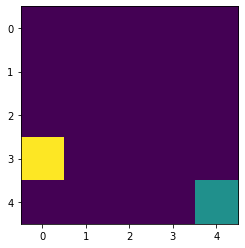

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.          0.        ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

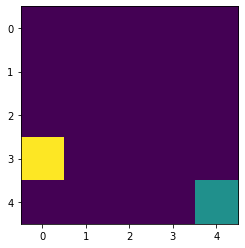

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

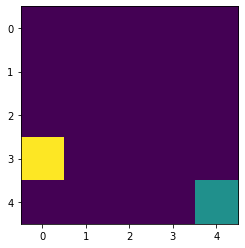

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.         -0.19      ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

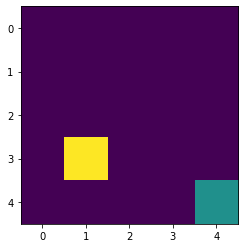

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.          0.          0.         -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

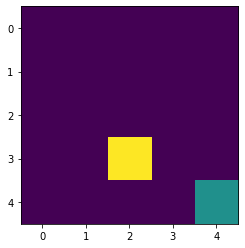

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.          0.          0.1        -0.1       ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0

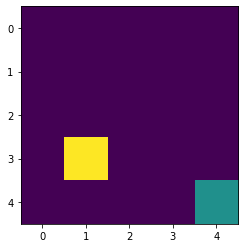

Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.          0.          0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

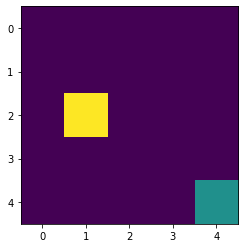

Episode: 6
Epsilon: 0.47829690000000014
Total Rewards: 1
Round 7
Action: Discrete(4)
Q_table: [[[ 0.69369105 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          

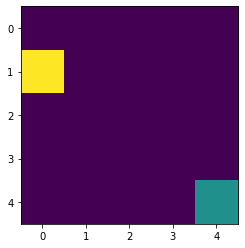

Action: Discrete(4)
Q_table: [[[ 0.76410194 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.27943751  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

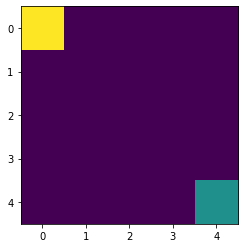

Action: Discrete(4)
Q_table: [[[ 0.76410194 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.28272458  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

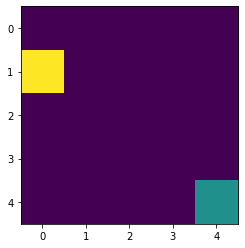

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.28272458  0.109       0.        ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

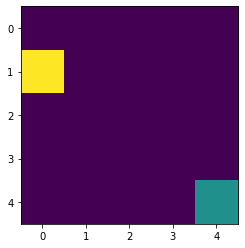

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.442      -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

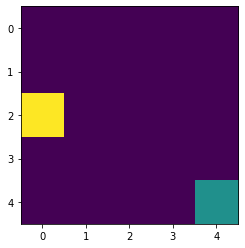

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.19       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

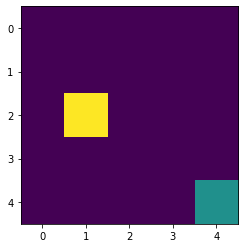

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.1         0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

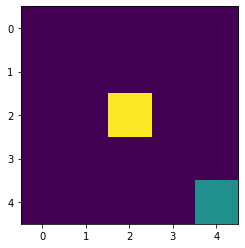

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

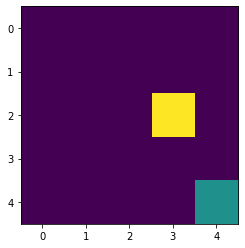

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

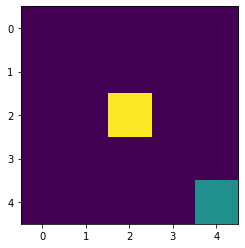

Episode: 7
Epsilon: 0.43046721000000016
Total Rewards: 3
Round 8
Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.08209     0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          

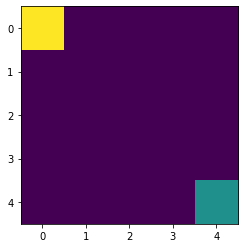

Action: Discrete(4)
Q_table: [[[ 0.82747175 -0.09940854  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

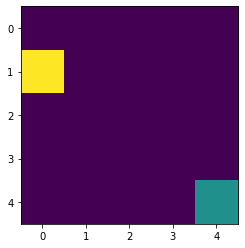

Action: Discrete(4)
Q_table: [[[ 0.89106557 -0.09940854  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.28272458  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

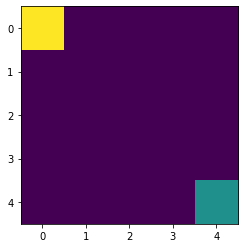

Action: Discrete(4)
Q_table: [[[ 0.89106557 -0.09940854  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

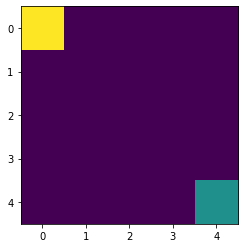

Action: Discrete(4)
Q_table: [[[ 0.89106557 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

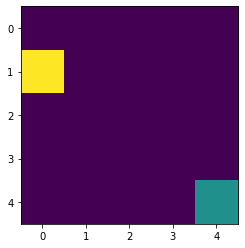

Action: Discrete(4)
Q_table: [[[ 0.94830002 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.5149     -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

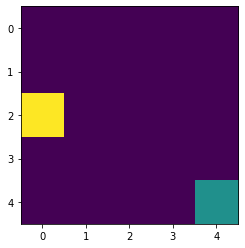

Action: Discrete(4)
Q_table: [[[ 0.94830002 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.28       -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

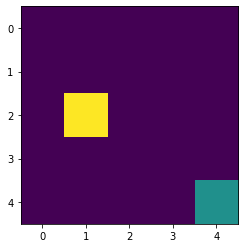

Action: Discrete(4)
Q_table: [[[ 0.94830002 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.1729      0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

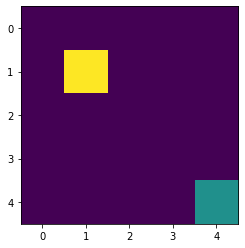

Action: Discrete(4)
Q_table: [[[ 0.94830002 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.19       -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

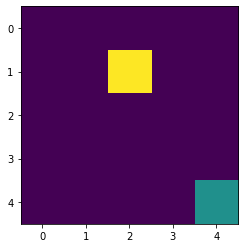

Episode: 8
Epsilon: 0.38742048900000015
Total Rewards: 1
Round 9
Action: Discrete(4)
Q_table: [[[ 0.94830002 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.271      -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          

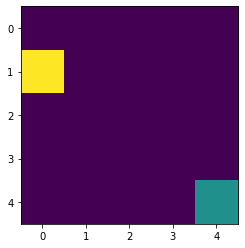

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.109      -0.06022   ]
  [ 0.1         0.          0.271      -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

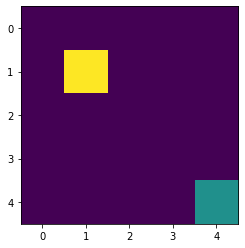

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.271      -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

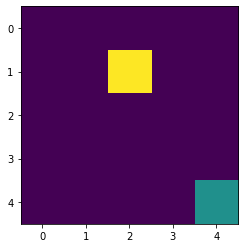

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.3439     -0.09019   ]
  [ 0.         -0.1         0.         -0.0829    ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

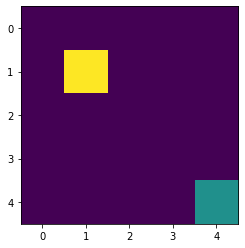

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.3439     -0.09019   ]
  [ 0.         -0.1         0.         -0.143659  ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

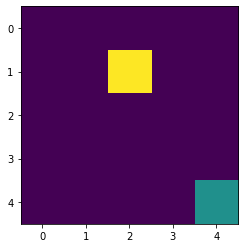

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.1         0.         -0.143659  ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

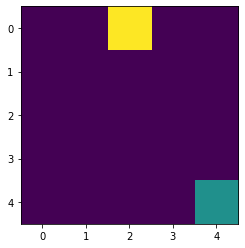

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.         -0.143659  ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

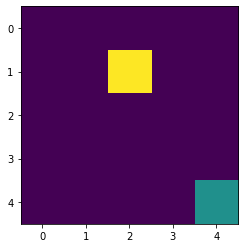

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.         -0.143659  ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

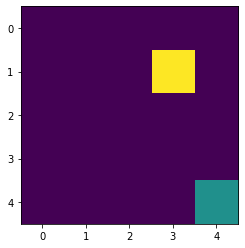

Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

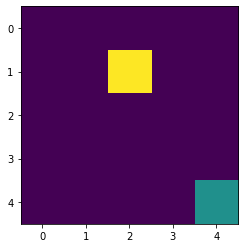

Episode: 9
Epsilon: 0.34867844010000015
Total Rewards: 3
Round 10
Action: Discrete(4)
Q_table: [[[ 1.00644492 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

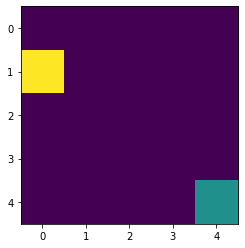

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.58861    -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

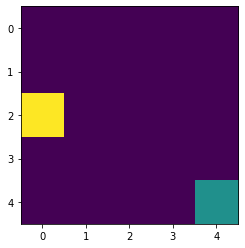

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.3691     -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

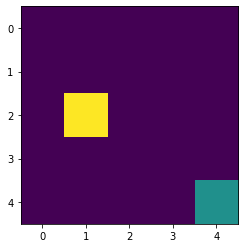

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.44929    -0.1       ]
  [ 0.1        -0.23851     0.19        0.        ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

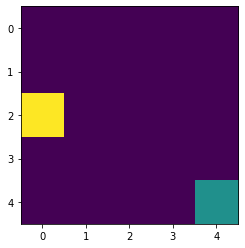

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.44929    -0.1       ]
  [ 0.1        -0.23851     0.19       -0.0595639 ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

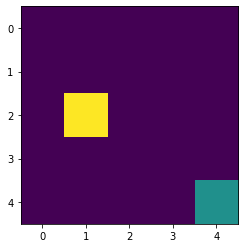

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.19       -0.0595639 ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

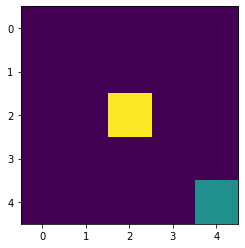

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

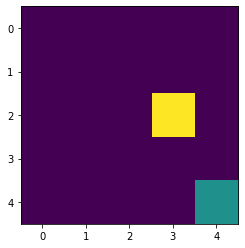

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

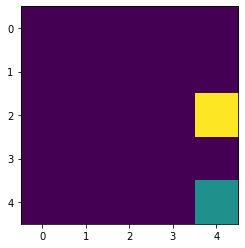

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

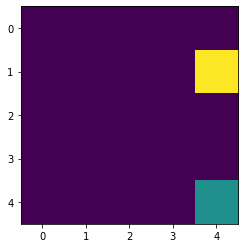

Episode: 10
Epsilon: 0.31381059609000017
Total Rewards: 5
Round 11
Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.3772     -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

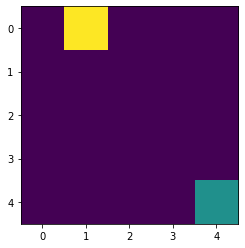

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.199      -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

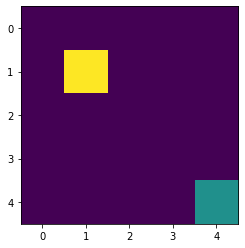

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.3159559  -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1         0.          0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

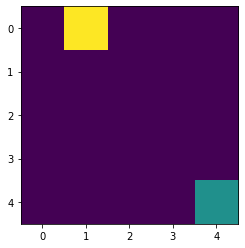

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.3159559  -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

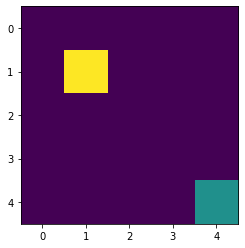

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.40951    -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

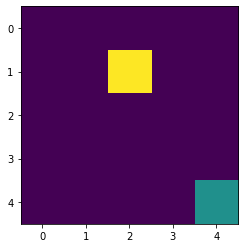

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.1        -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

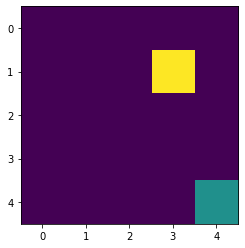

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

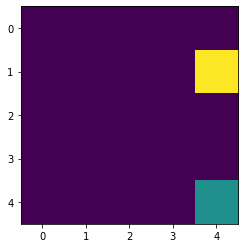

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

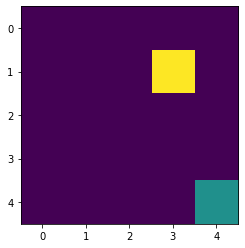

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

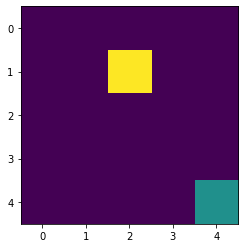

Episode: 11
Epsilon: 0.28242953648100017
Total Rewards: 3
Round 12
Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10927179  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

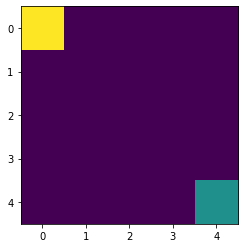

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.45739    -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

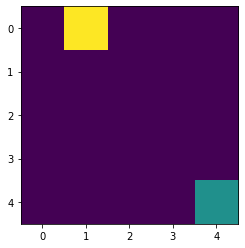

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.42121621 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

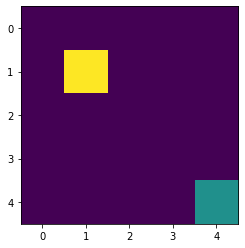

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.5220749  -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.07156397  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

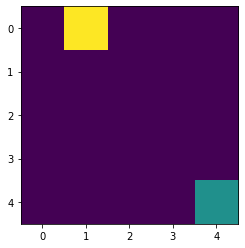

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.5220749  -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

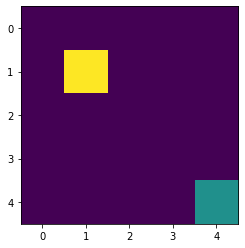

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.477559   -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

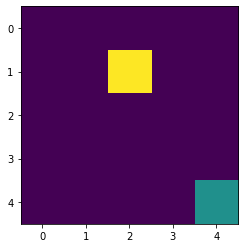

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.19       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

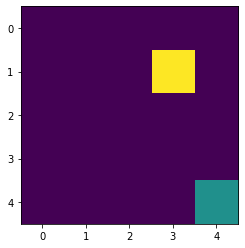

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.28       -0.143659  ]
  [ 0.          0.          0.1        -0.1648    ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

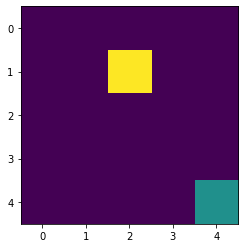

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.28       -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

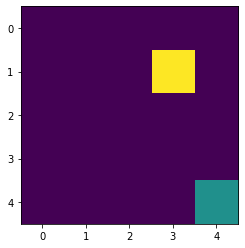

Episode: 12
Epsilon: 0.25418658283290013
Total Rewards: 3
Round 13
Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.10305483  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

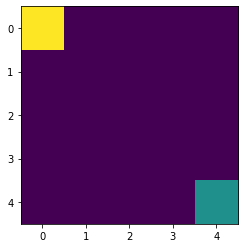

Action: Discrete(4)
Q_table: [[[ 1.05877532 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

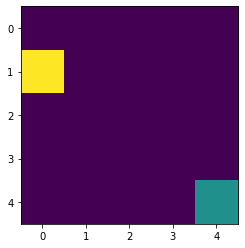

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.662968   -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

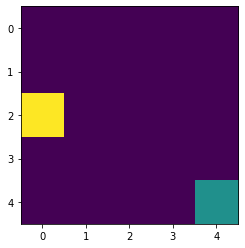

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.521461   -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

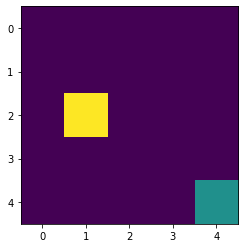

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.28       -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

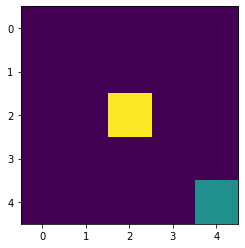

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.19       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

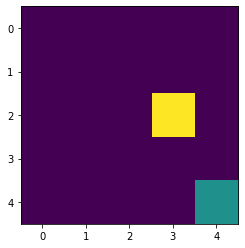

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.28       -0.091     ]
  [ 0.          0.          0.1        -0.091     ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

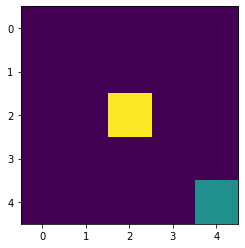

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.28       -0.091     ]
  [ 0.          0.          0.1        -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

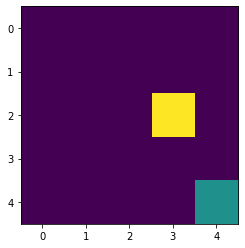

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.1        -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

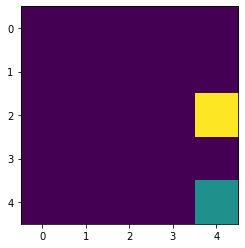

Episode: 13
Epsilon: 0.22876792454961012
Total Rewards: 5
Round 14
Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.09745957  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

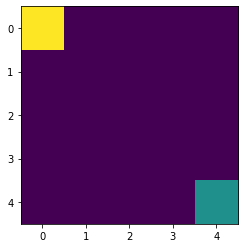

Action: Discrete(4)
Q_table: [[[ 1.11256491 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

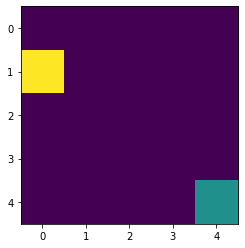

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.74360269 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

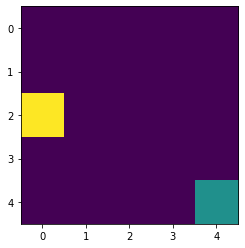

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.5945149  -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

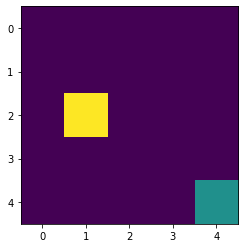

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.3691     -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

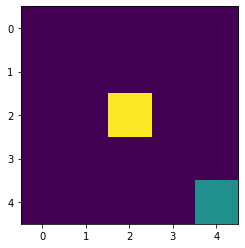

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.361      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

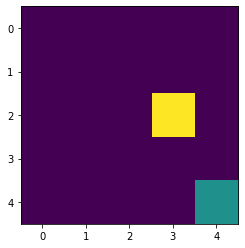

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.          0.          0.19       -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

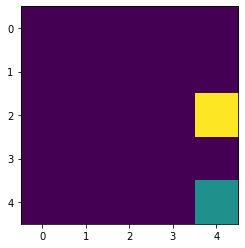

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.          0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.          0.        ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

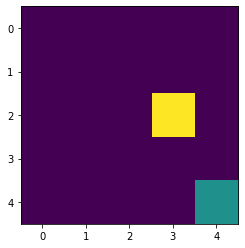

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.          0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

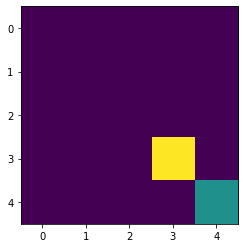

Episode: 14
Epsilon: 0.2058911320946491
Total Rewards: 5
Round 15
Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.08758277  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

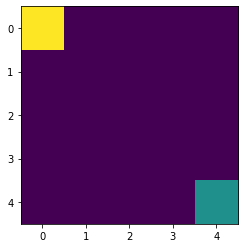

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.54956046 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

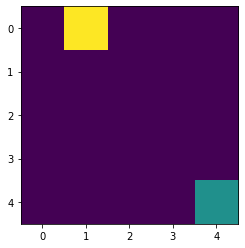

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.61284772 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

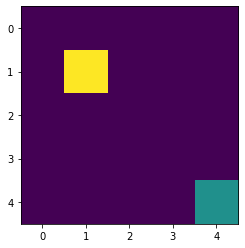

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.5469031  -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

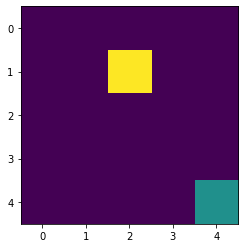

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.361      -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

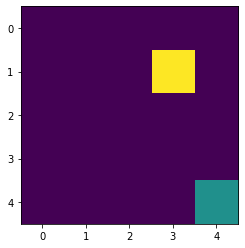

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.1        -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

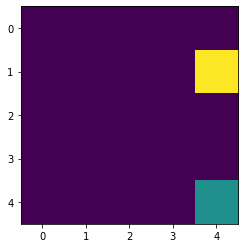

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.          0.          0.         -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

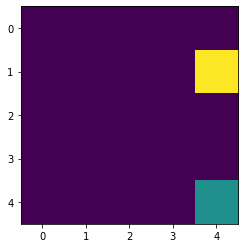

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.          0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

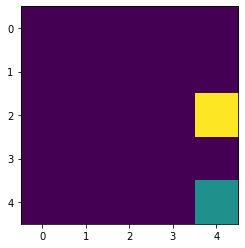

Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1         0.         -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

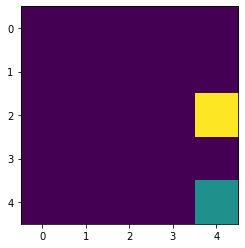

Episode: 15
Epsilon: 0.1853020188851842
Total Rewards: 3
Round 16
Action: Discrete(4)
Q_table: [[[ 1.16823266 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

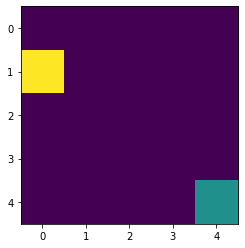

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.82274876 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

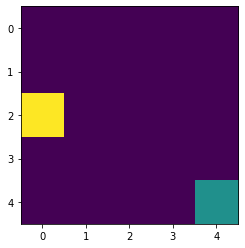

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.66828241 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

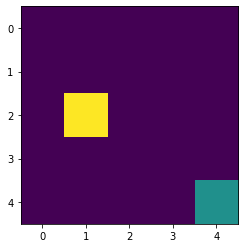

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.46468    -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

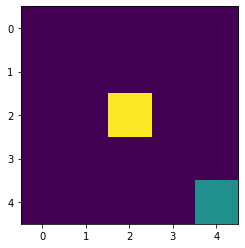

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.442      -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

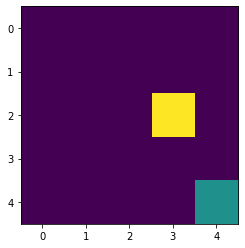

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.271      -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

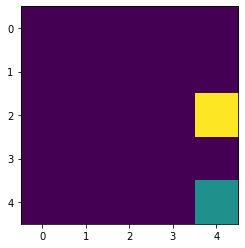

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.3439     -0.1567    ]
  [ 0.         -0.1        -0.1        -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

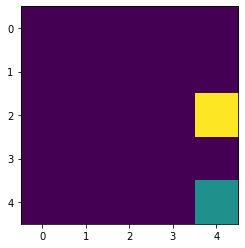

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.3439     -0.1567    ]
  [ 0.         -0.1        -0.19       -0.07561   ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

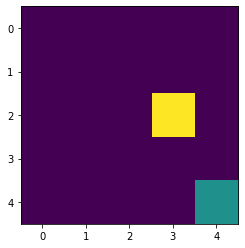

Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.3439     -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

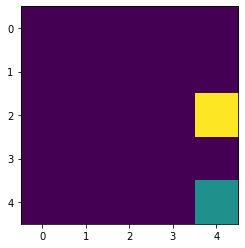

Episode: 16
Epsilon: 0.16677181699666577
Total Rewards: 5
Round 17
Action: Discrete(4)
Q_table: [[[ 1.22545678 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

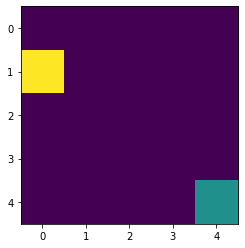

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.9006193  -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

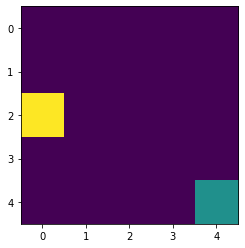

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.74327537 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

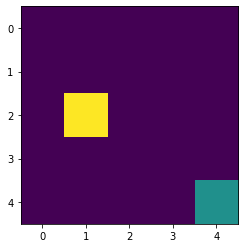

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.557992   -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

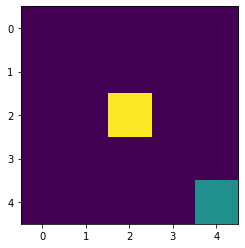

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.52219    -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

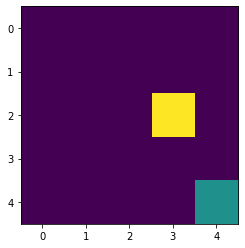

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.40951    -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

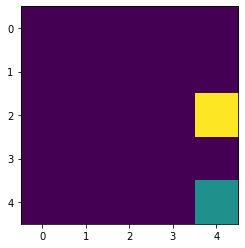

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.         -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

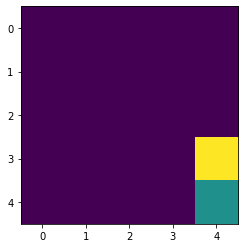

Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

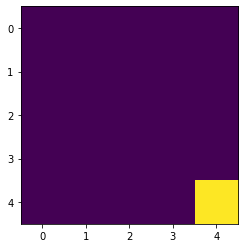

Episode: 17
Epsilon: 0.1500946352969992
Total Rewards: 8
Round 18
Action: Discrete(4)
Q_table: [[[ 1.28396684 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

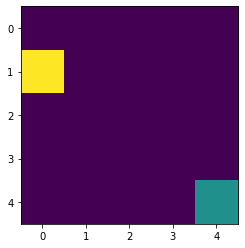

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06022   ]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

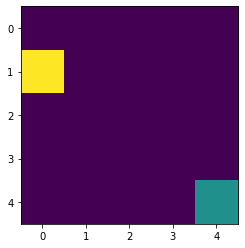

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 0.97745216 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

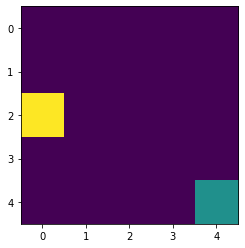

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.81916711 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

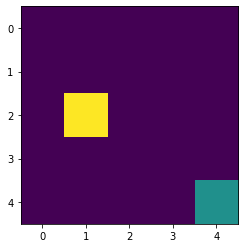

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.6491899  -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

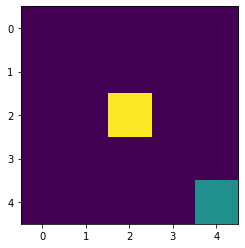

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.6068269  -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

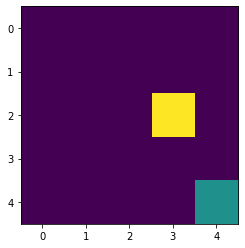

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.468559   -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

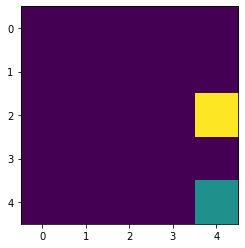

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.1        -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

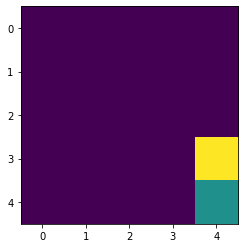

Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

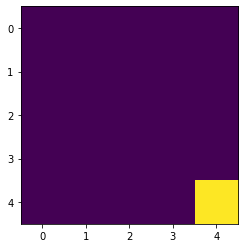

Episode: 18
Epsilon: 0.13508517176729928
Total Rewards: 7
Round 19
Action: Discrete(4)
Q_table: [[[ 1.34354085 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

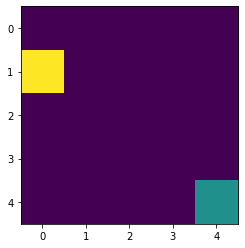

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.05343198 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

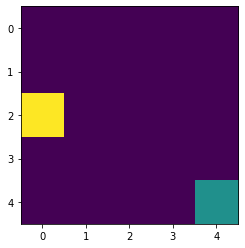

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.89567749 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

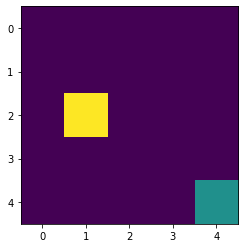

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.73888533 -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

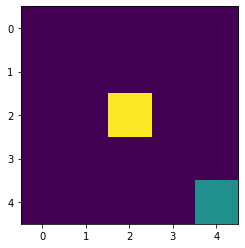

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.68831452 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

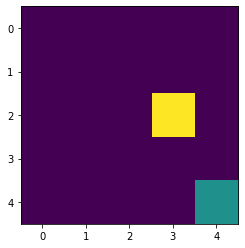

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.5307031  -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

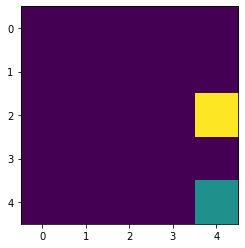

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.199      -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

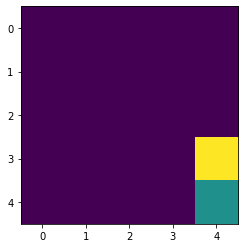

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

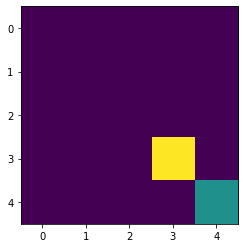

Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

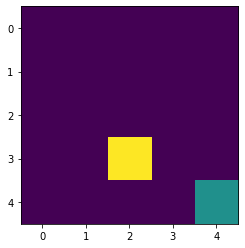

Episode: 19
Epsilon: 0.12157665459056936
Total Rewards: 5
Round 20
Action: Discrete(4)
Q_table: [[[ 1.40399565 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

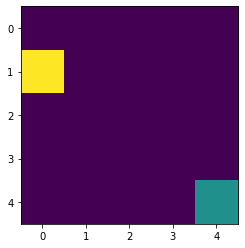

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.12869976 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

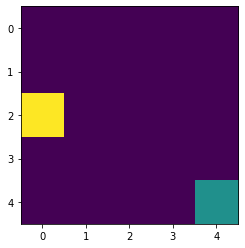

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    0.97260942 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

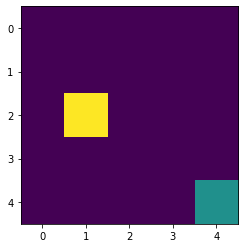

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.8269451  -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

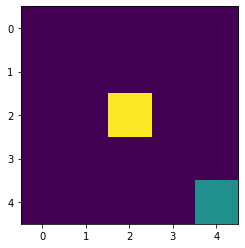

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.76724635 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

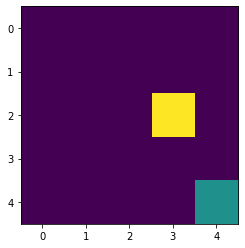

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.59554279 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

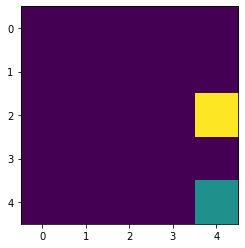

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.2962     -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

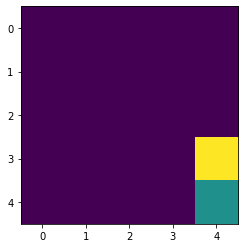

Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

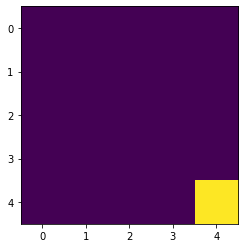

Episode: 20
Epsilon: 0.10941898913151243
Total Rewards: 8
Round 21
Action: Discrete(4)
Q_table: [[[ 1.46517906 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

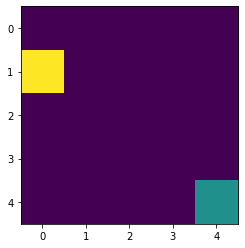

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.20336463 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

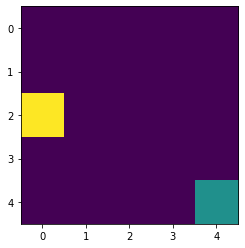

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.04977354 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

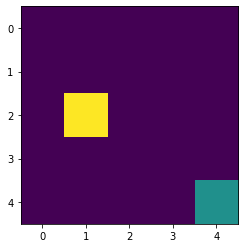

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.91330277 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

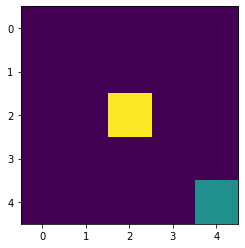

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.84412056 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

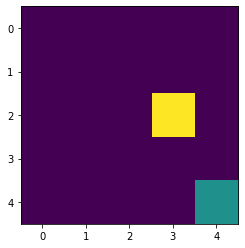

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.66264651 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

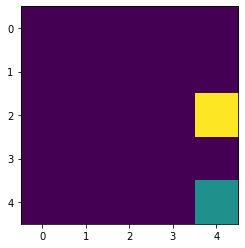

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.38368    -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

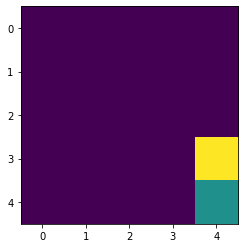

Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

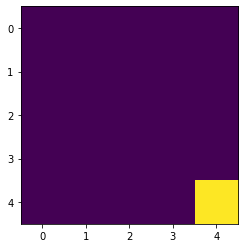

Episode: 21
Epsilon: 0.0984770902183612
Total Rewards: 8
Round 22
Action: Discrete(4)
Q_table: [[[ 1.52696397 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

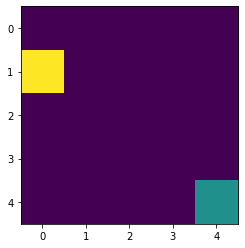

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.27750778 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

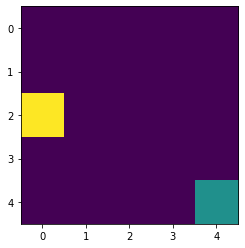

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.12699343 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

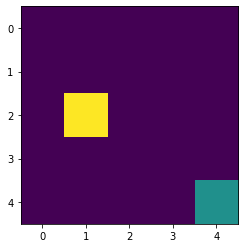

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     0.99794334 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

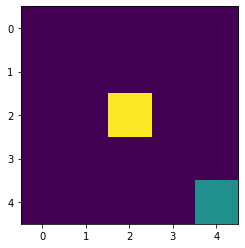

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.91934669 -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

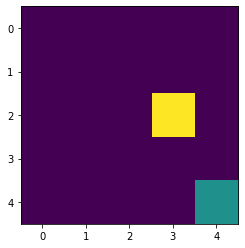

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.73091306 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

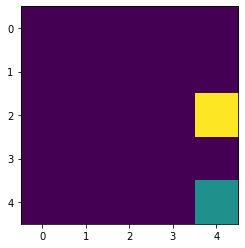

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.469702   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

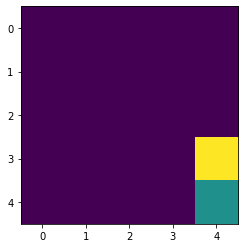

Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

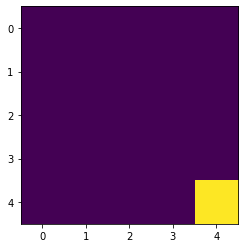

Episode: 22
Epsilon: 0.08862938119652508
Total Rewards: 8
Round 23
Action: Discrete(4)
Q_table: [[[ 1.58924327 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

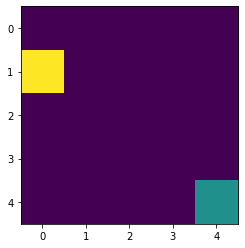

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.35118642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

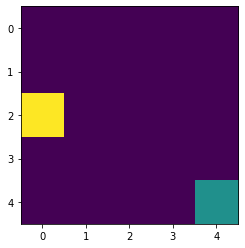

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.20410899 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

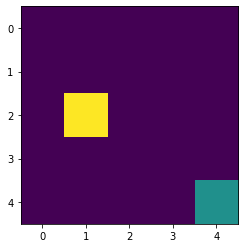

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.08089021 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

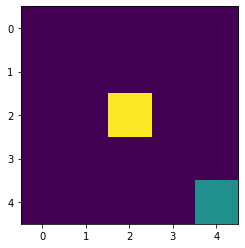

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          0.9931942  -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

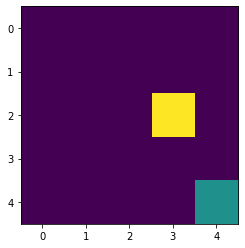

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.80009493 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

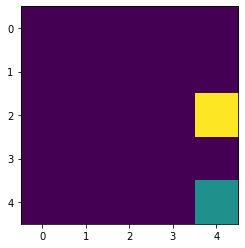

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.5536828  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

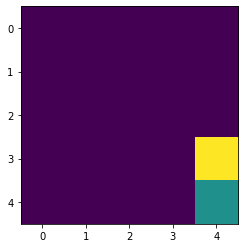

Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

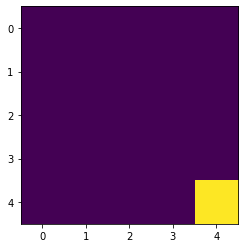

Episode: 23
Epsilon: 0.07976644307687257
Total Rewards: 8
Round 24
Action: Discrete(4)
Q_table: [[[ 1.65192572 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

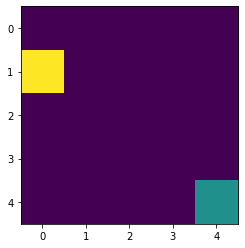

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.42443758 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

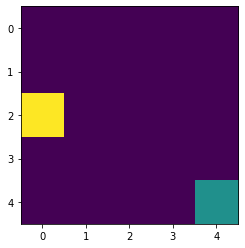

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.28097821 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

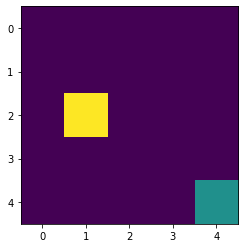

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.16218867 -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

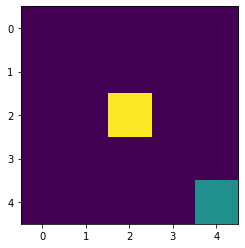

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.06588332 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

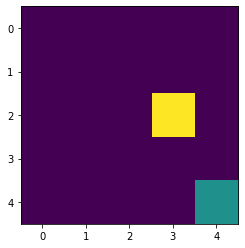

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.86991689 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

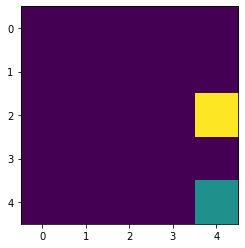

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.63517042 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

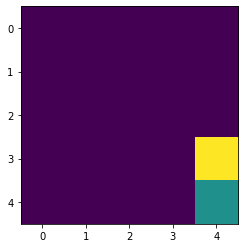

Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

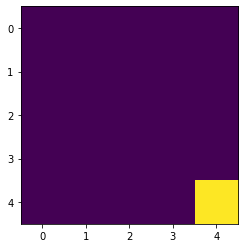

Episode: 24
Epsilon: 0.07178979876918531
Total Rewards: 8
Round 25
Action: Discrete(4)
Q_table: [[[ 1.71493253 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

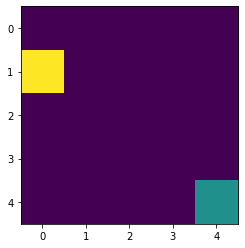

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.49728186 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

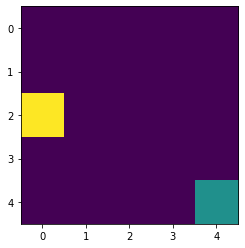

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.35747737 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

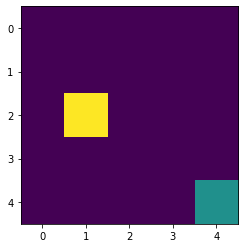

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.2418993  -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

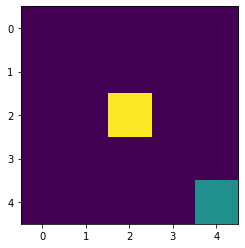

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.13758751 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

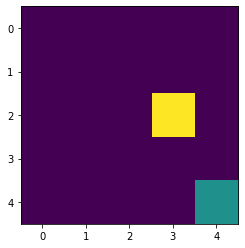

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          0.94009054 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

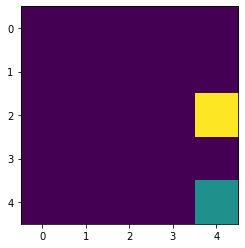

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.71382369 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

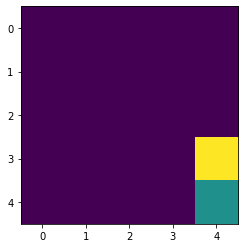

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

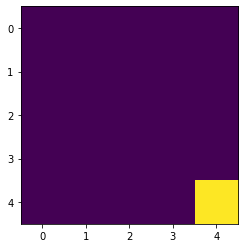

Episode: 25
Epsilon: 0.06461081889226679
Total Rewards: 8
Round 26
Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.23097618]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

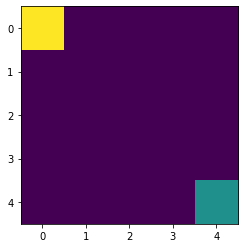

Action: Discrete(4)
Q_table: [[[ 1.77819465 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

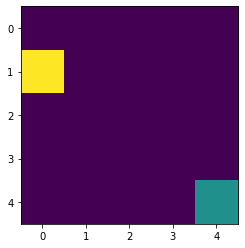

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.56972664 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

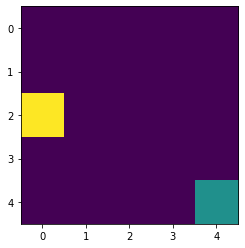

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.43350057 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

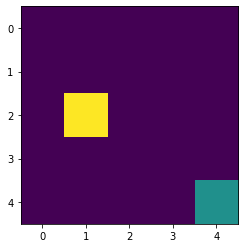

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.32009224 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

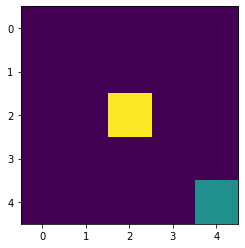

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.20843691 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

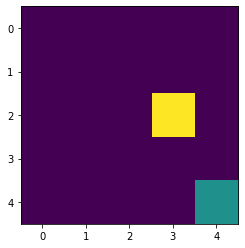

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.01032562 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

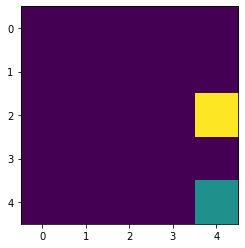

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.7893946  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

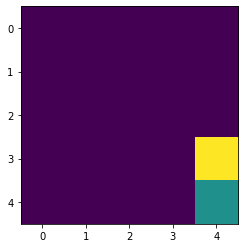

Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

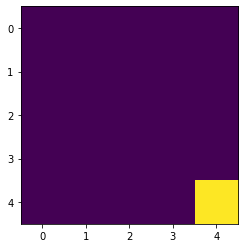

Episode: 26
Epsilon: 0.05814973700304011
Total Rewards: 7
Round 27
Action: Discrete(4)
Q_table: [[[ 1.84165058 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

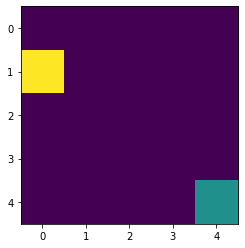

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.64176903 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

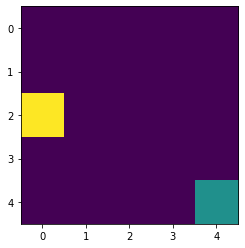

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.50895881 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

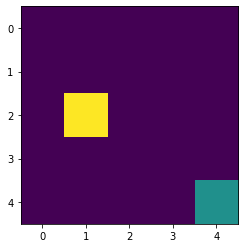

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.39684234 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

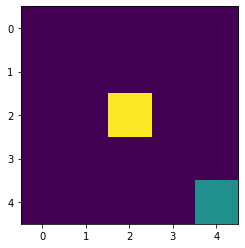

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.27852252 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

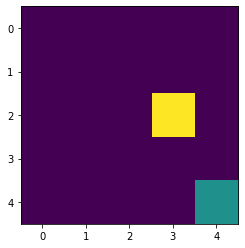

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.08033857 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

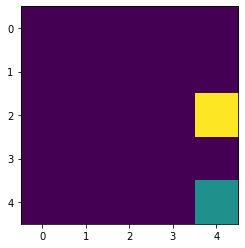

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.86171309 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

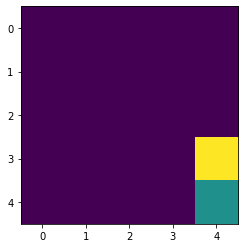

Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

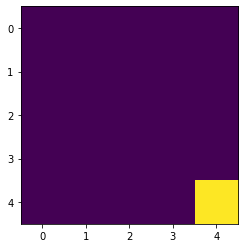

Episode: 27
Epsilon: 0.0523347633027361
Total Rewards: 8
Round 28
Action: Discrete(4)
Q_table: [[[ 1.90524474 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

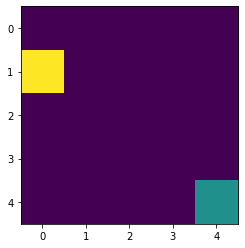

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.71339842 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

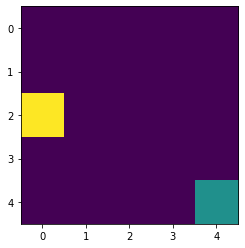

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.58377874 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

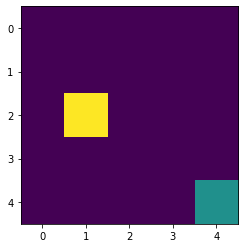

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.47222513 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

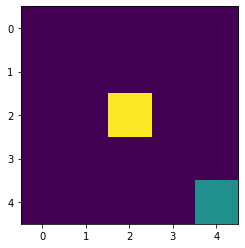

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.34790074 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

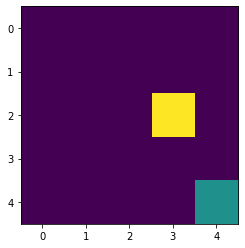

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.14985889 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

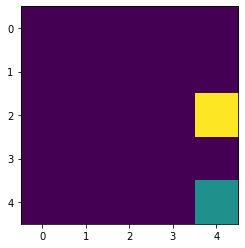

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.93067394 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

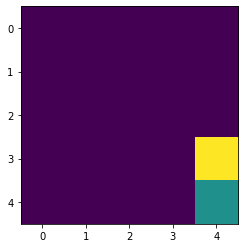

Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

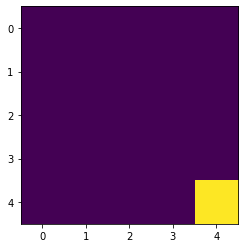

Episode: 28
Epsilon: 0.04710128697246249
Total Rewards: 8
Round 29
Action: Discrete(4)
Q_table: [[[ 1.96892612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

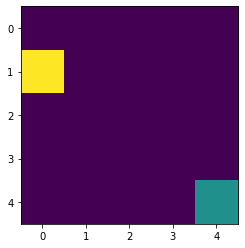

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.78459866 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

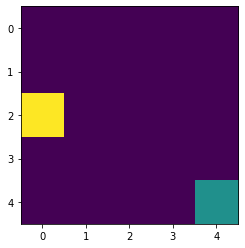

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.65790113 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

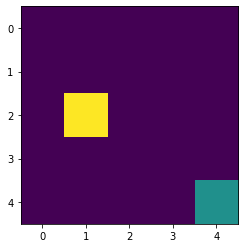

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.54631369 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

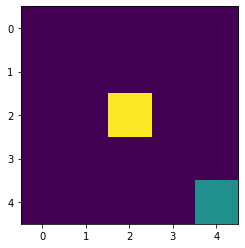

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.41659797 -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

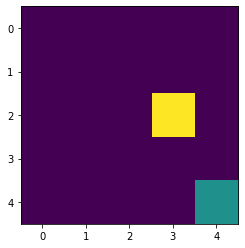

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.21863366 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

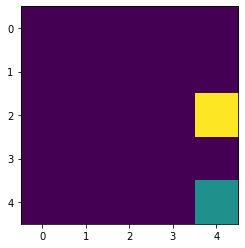

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 0.99622548 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

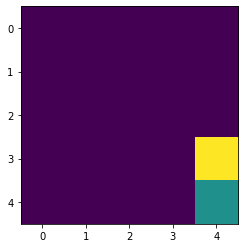

Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

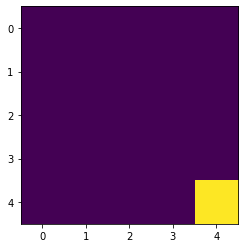

Episode: 29
Epsilon: 0.042391158275216244
Total Rewards: 8
Round 30
Action: Discrete(4)
Q_table: [[[ 2.03264739 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

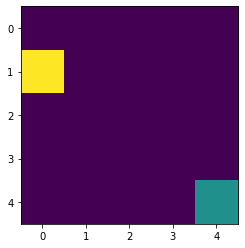

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.8553499  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

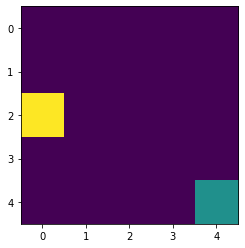

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.73127925 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

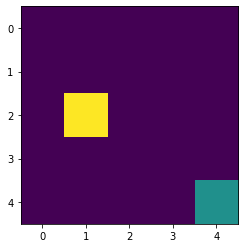

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.80387718 -0.1       ]
  [ 0.1        -0.23851     1.61917614 -0.0595639 ]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

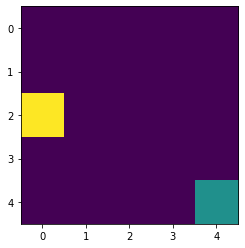

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.80387718 -0.1       ]
  [ 0.1        -0.23851     1.61917614  0.00874144]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

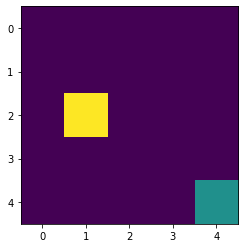

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.61917614  0.00874144]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

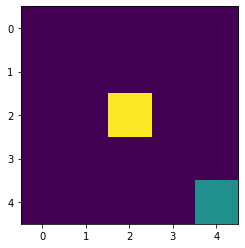

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.4846152  -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

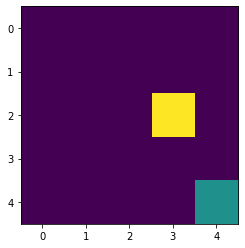

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.28643058 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

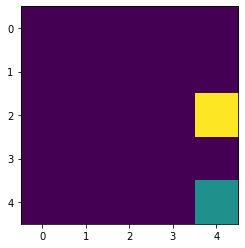

Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.05835998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

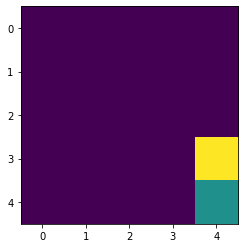

Episode: 30
Epsilon: 0.03815204244769462
Total Rewards: 7
Round 31
Action: Discrete(4)
Q_table: [[[ 2.09636414 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

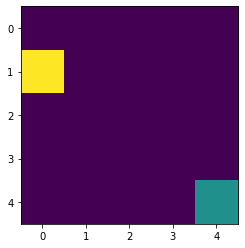

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 1.92563004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

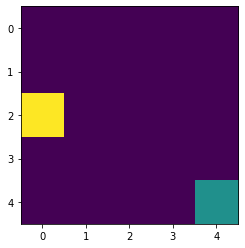

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.86921531 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

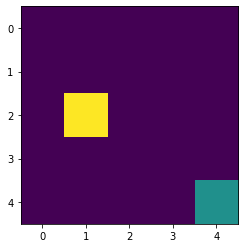

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.69087389  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

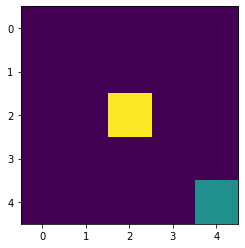

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.55193243 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

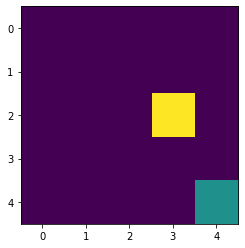

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.35303992 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

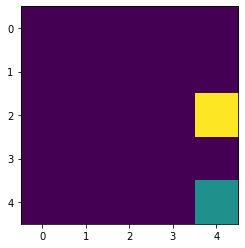

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.11710532 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

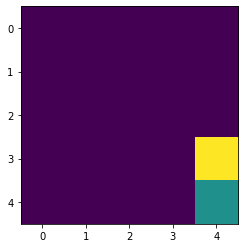

Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

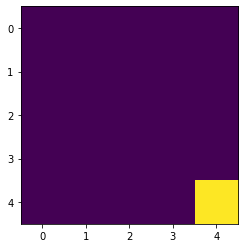

Episode: 31
Epsilon: 0.03433683820292516
Total Rewards: 8
Round 32
Action: Discrete(4)
Q_table: [[[ 2.16003443 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

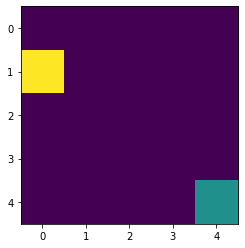

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.00129642 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

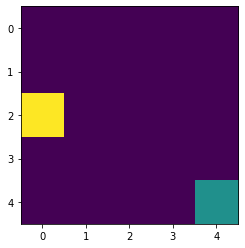

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.93447243 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

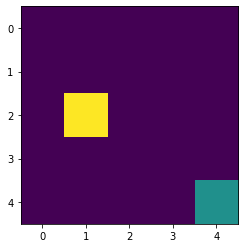

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.76146042  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

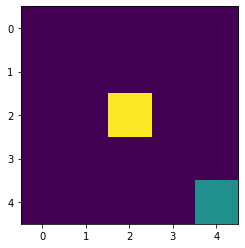

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.61851278 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

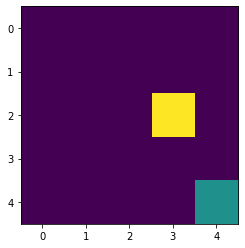

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.41827541 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

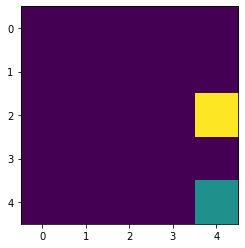

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.16997613 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

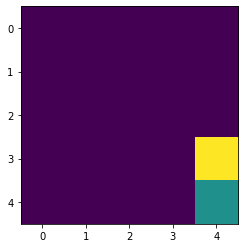

Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

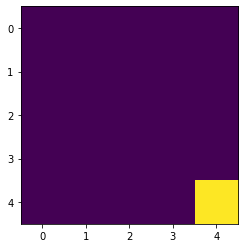

Episode: 32
Epsilon: 0.030903154382632643
Total Rewards: 8
Round 33
Action: Discrete(4)
Q_table: [[[ 2.22414766 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

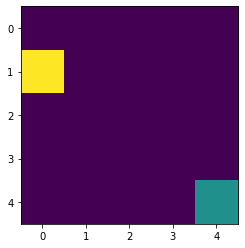

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.07526929 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

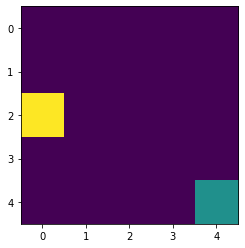

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    1.99955663 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

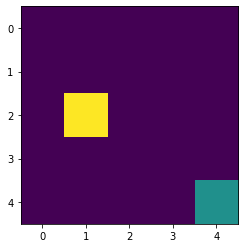

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.83098053  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

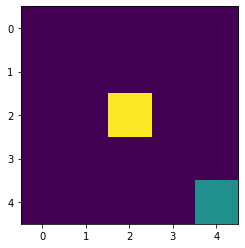

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.68430629 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

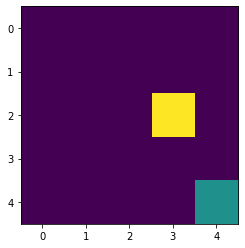

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.48174572 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

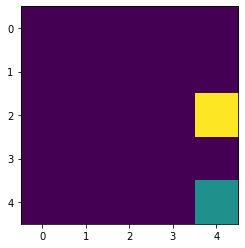

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.22010173 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

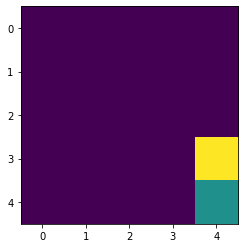

Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

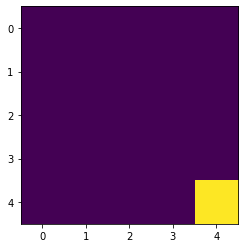

Episode: 33
Epsilon: 0.02781283894436938
Total Rewards: 8
Round 34
Action: Discrete(4)
Q_table: [[[ 2.28850713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

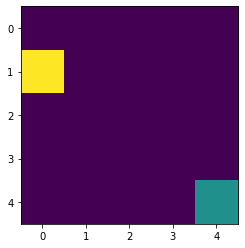

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.14770246 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

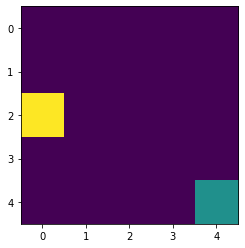

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.06438921 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

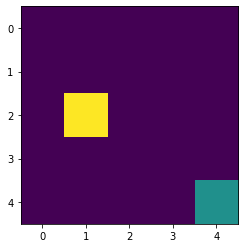

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.89947004  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

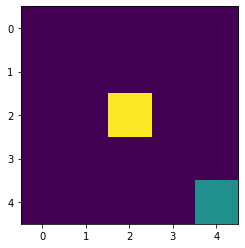

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.74923278 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

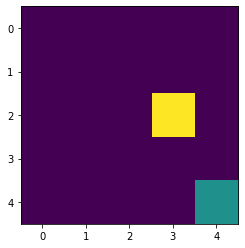

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.54338031 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

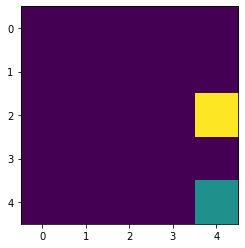

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.26750244 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

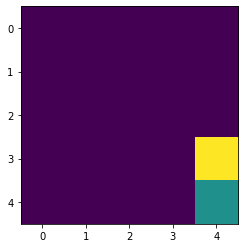

Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

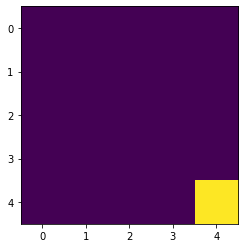

Episode: 34
Epsilon: 0.025031555049932444
Total Rewards: 8
Round 35
Action: Discrete(4)
Q_table: [[[ 2.35294964 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

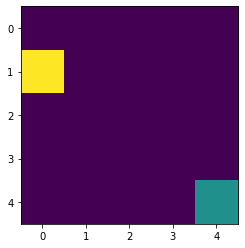

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.21872724 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

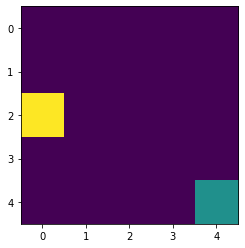

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.12890259 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

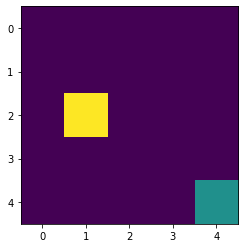

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     1.96695399  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

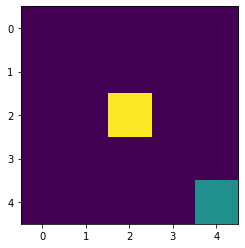

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.81321373 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

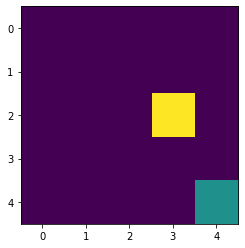

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.60311749 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

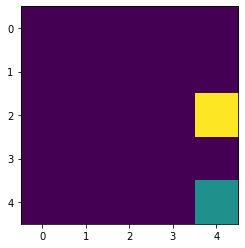

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.312222   -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

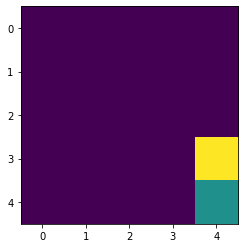

Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

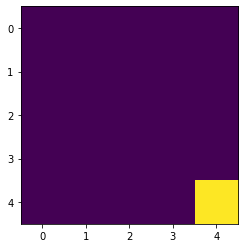

Episode: 35
Epsilon: 0.0225283995449392
Total Rewards: 8
Round 36
Action: Discrete(4)
Q_table: [[[ 2.41734013 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.         

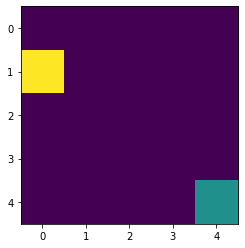

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.28845575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

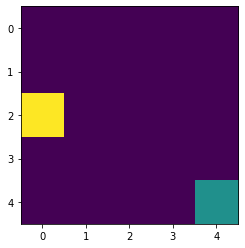

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.19303819 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

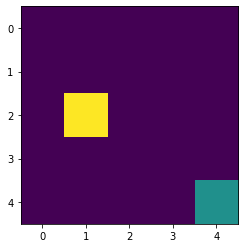

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.03344782  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

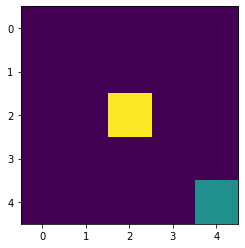

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.87617293 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

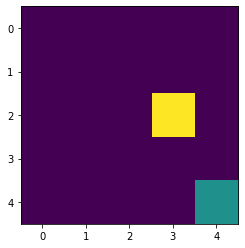

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.66090572 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

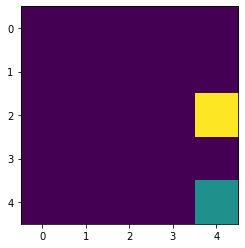

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.35432261 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

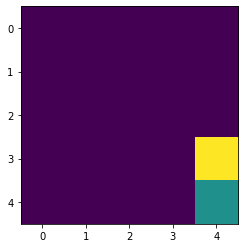

Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

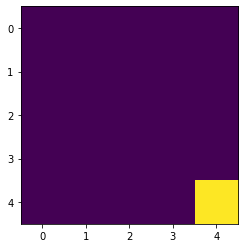

Episode: 36
Epsilon: 0.020275559590445278
Total Rewards: 8
Round 37
Action: Discrete(4)
Q_table: [[[ 2.48156713 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

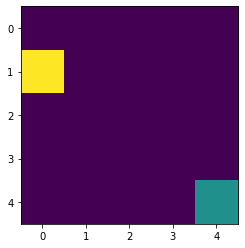

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.35698361 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

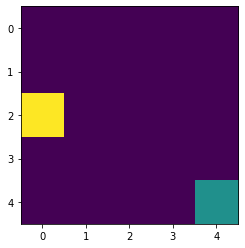

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.25674468 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

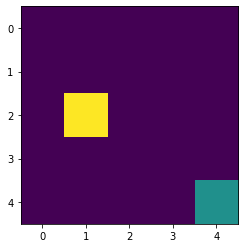

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.09895861  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

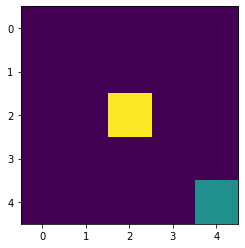

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.93803715 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

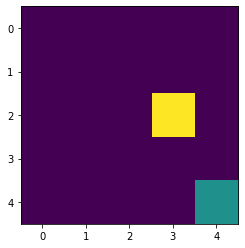

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.71670419 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

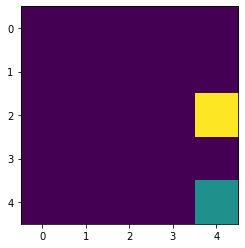

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.39388089 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

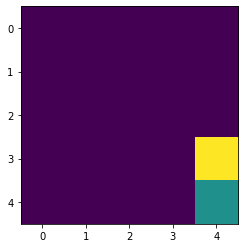

Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

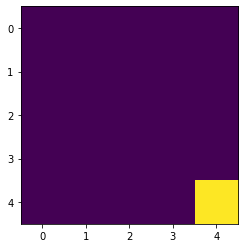

Episode: 37
Epsilon: 0.01824800363140075
Total Rewards: 8
Round 38
Action: Discrete(4)
Q_table: [[[ 2.54553895 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

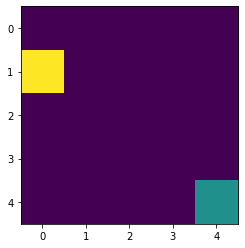

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.42439227 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

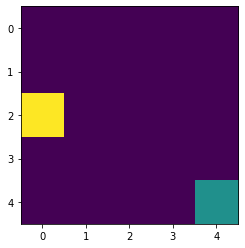

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.31997648 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

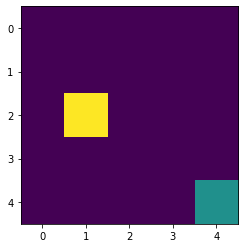

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.16348609  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

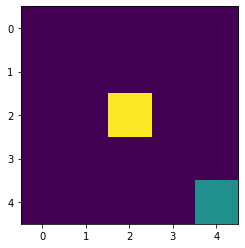

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          1.99873681 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

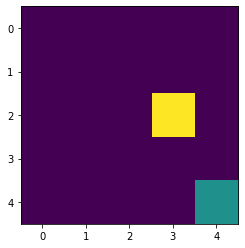

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.77048305 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

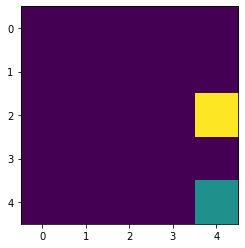

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.43098428 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

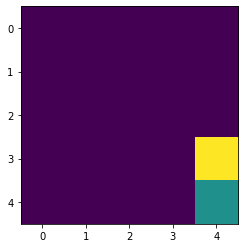

Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

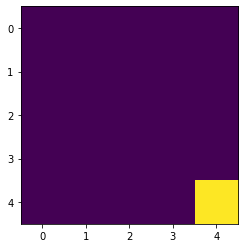

Episode: 38
Epsilon: 0.016423203268260675
Total Rewards: 8
Round 39
Action: Discrete(4)
Q_table: [[[ 2.60918036 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

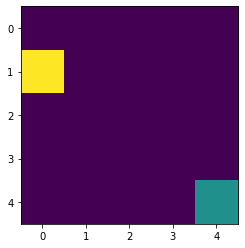

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.49075093 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

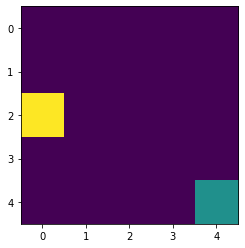

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.38269258 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

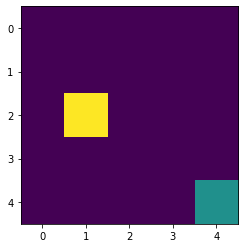

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.22702379  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

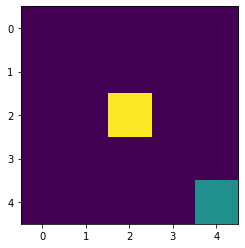

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.05820661 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

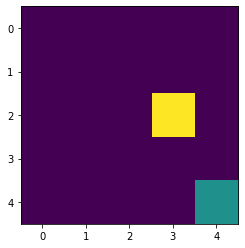

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.82222333 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

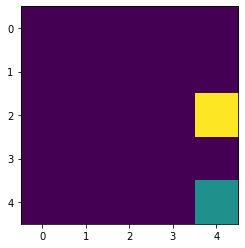

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.46572819 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

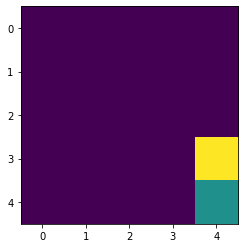

Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

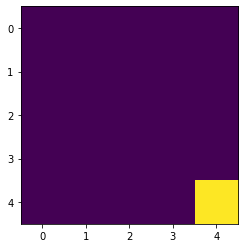

Episode: 39
Epsilon: 0.014780882941434608
Total Rewards: 8
Round 40
Action: Discrete(4)
Q_table: [[[ 2.6724299  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

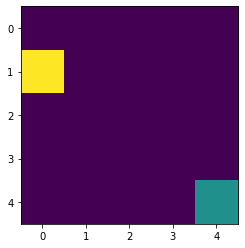

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.55611817 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

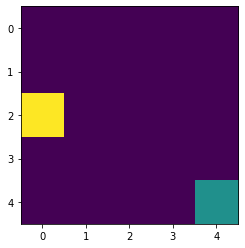

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.44485547 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

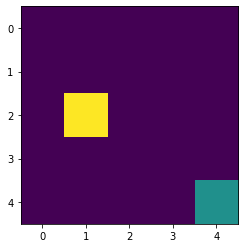

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.28956001  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

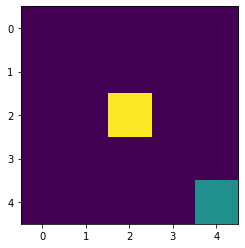

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.11638605 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

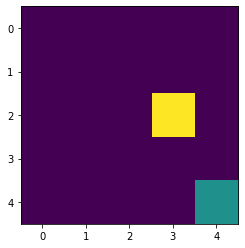

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.87191653 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

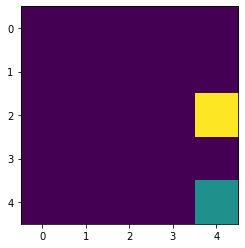

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.49821347 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

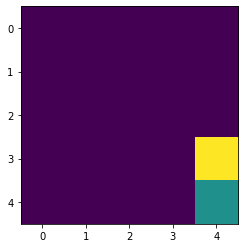

Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

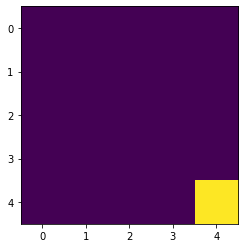

Episode: 40
Epsilon: 0.013302794647291147
Total Rewards: 8
Round 41
Action: Discrete(4)
Q_table: [[[ 2.73523755 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

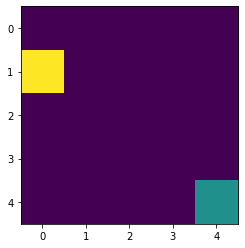

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.62054334 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

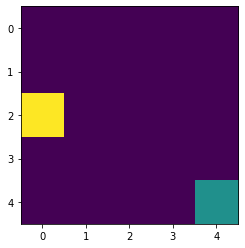

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.50643032 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

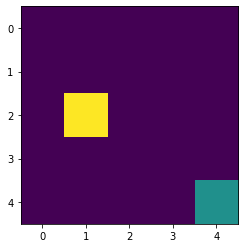

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.35107875  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

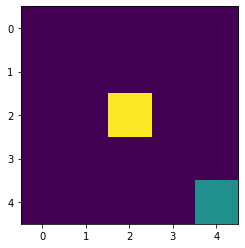

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.17321993 -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

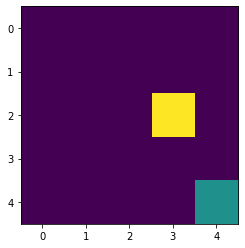

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2286587  -0.091     ]
  [ 0.1         0.          1.91956409 -0.1567    ]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

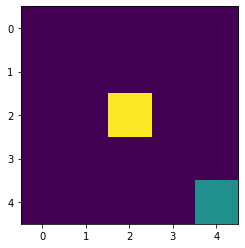

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2286587  -0.091     ]
  [ 0.1         0.          1.91956409 -0.04045072]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

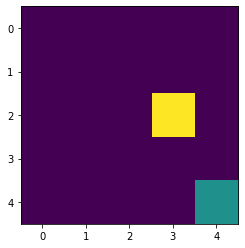

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.91956409 -0.04045072]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

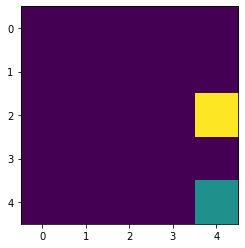

Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.52854442 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

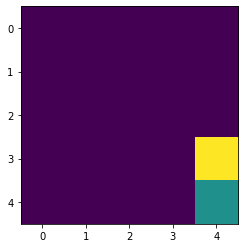

Episode: 41
Epsilon: 0.011972515182562033
Total Rewards: 7
Round 42
Action: Discrete(4)
Q_table: [[[ 2.7975627  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

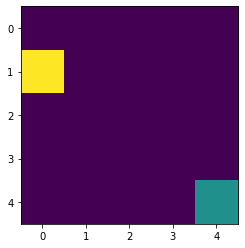

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.68406774 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

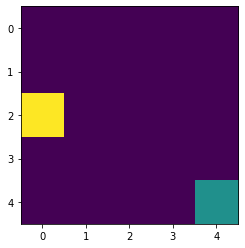

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.56738438 -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

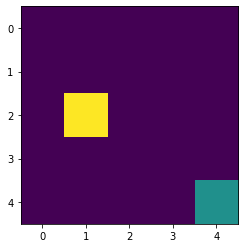

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.41156067  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

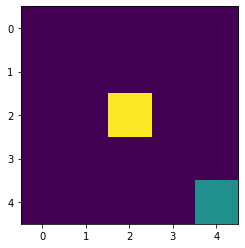

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.2785536  -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

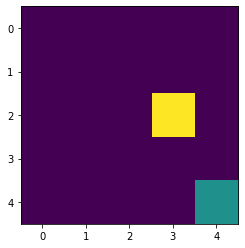

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          1.96517668 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

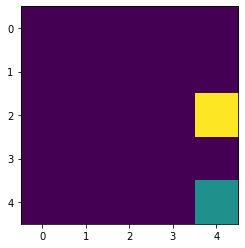

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.55682704 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

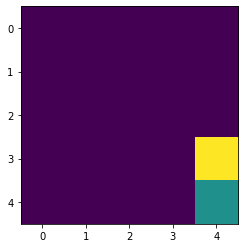

Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

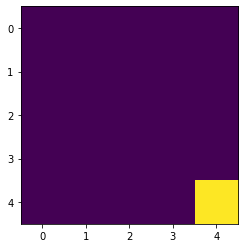

Episode: 42
Epsilon: 0.01077526366430583
Total Rewards: 8
Round 43
Action: Discrete(4)
Q_table: [[[ 2.85937252 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

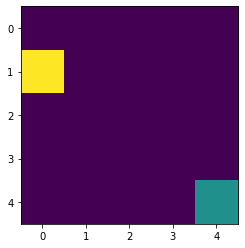

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.74672556 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

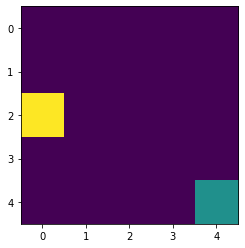

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.6276864  -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

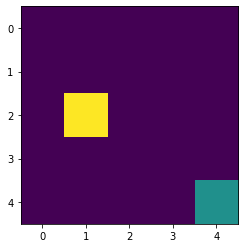

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.47547443  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

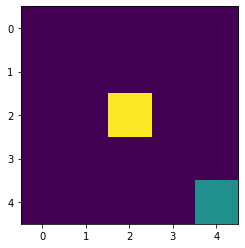

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.32756414 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

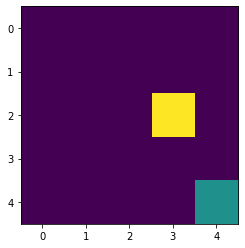

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.00877345 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

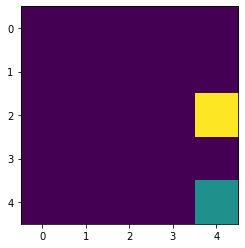

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.58228139 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

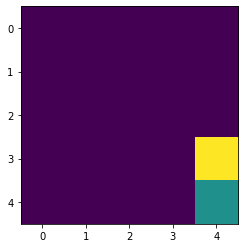

Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

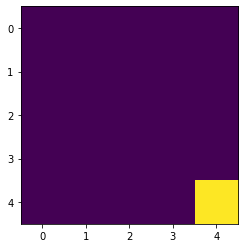

Episode: 43
Epsilon: 0.009697737297875247
Total Rewards: 8
Round 44
Action: Discrete(4)
Q_table: [[[ 2.92064057 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

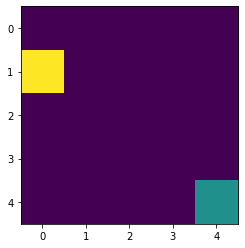

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.80854478 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

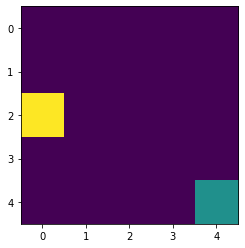

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.68771046 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

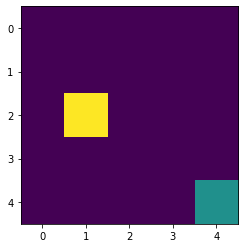

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.53740776  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

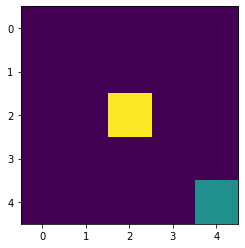

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.37559734 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

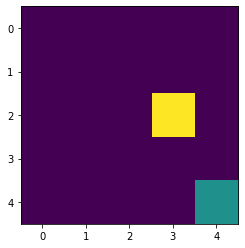

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.05030143 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

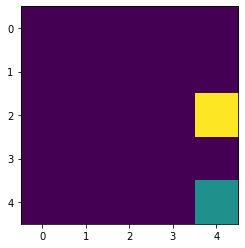

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.60607661 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

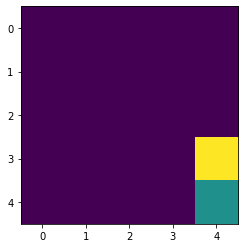

Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

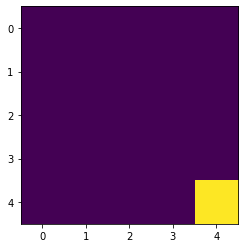

Episode: 44
Epsilon: 0.008727963568087723
Total Rewards: 8
Round 45
Action: Discrete(4)
Q_table: [[[ 2.98134554 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

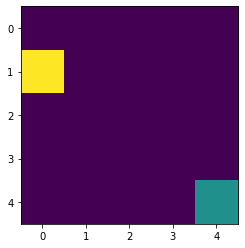

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.86958424 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

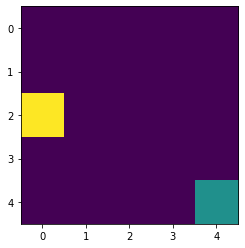

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.74730611 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

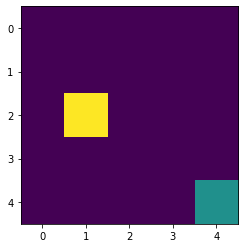

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.59747074  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

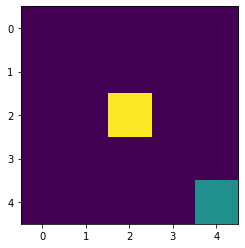

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.42256473 -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

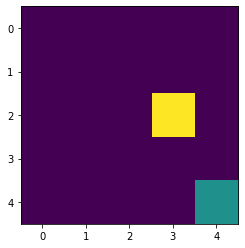

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.08981818 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

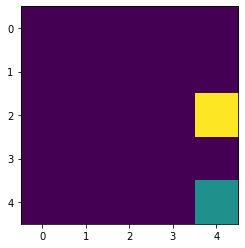

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.62828997 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

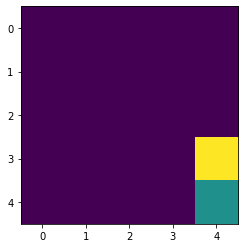

Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

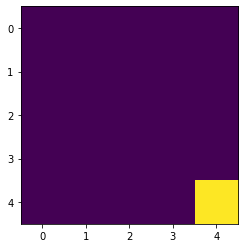

Episode: 45
Epsilon: 0.00785516721127895
Total Rewards: 8
Round 46
Action: Discrete(4)
Q_table: [[[ 3.04147357 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

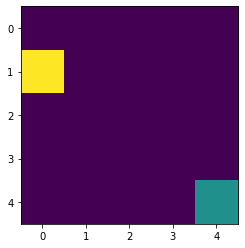

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.92988337 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

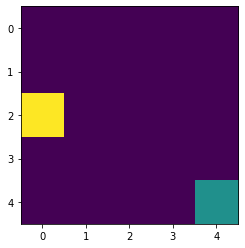

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.80634787 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

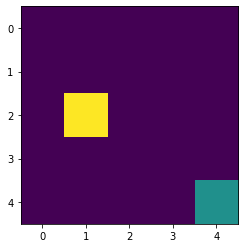

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.65575449  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

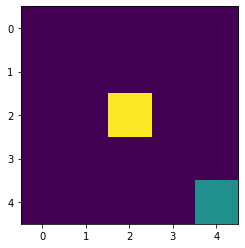

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.4683919  -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

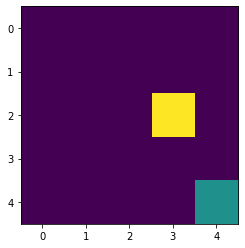

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.12738246 -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

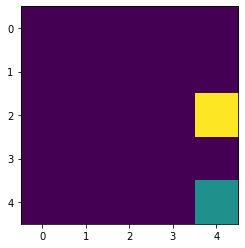

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.64899989 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

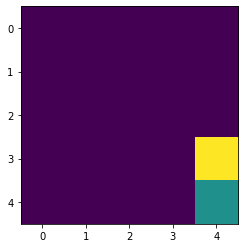

Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

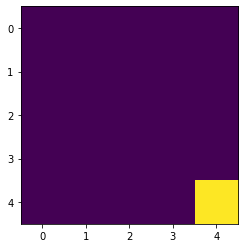

Episode: 46
Epsilon: 0.007069650490151055
Total Rewards: 8
Round 47
Action: Discrete(4)
Q_table: [[[ 3.10101572 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

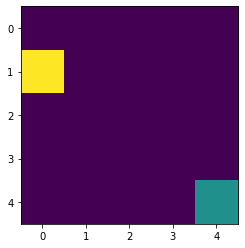

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 2.98946634 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

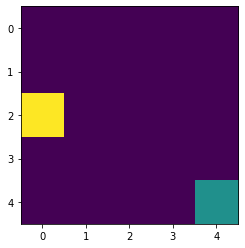

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.86473098 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

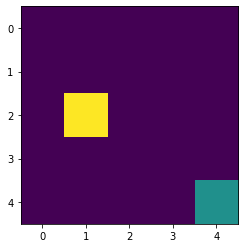

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.71233432  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

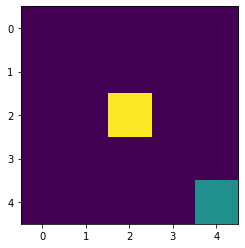

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.51301713 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

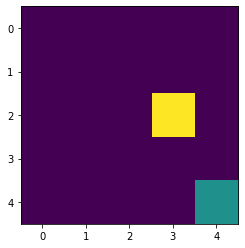

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.1630542  -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

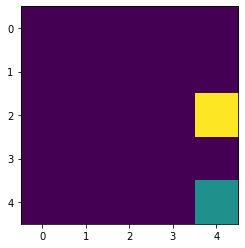

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.66828493 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

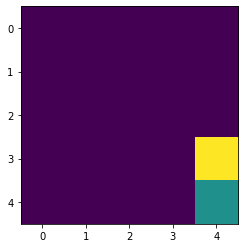

Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

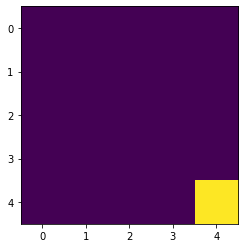

Episode: 47
Epsilon: 0.00636268544113595
Total Rewards: 8
Round 48
Action: Discrete(4)
Q_table: [[[ 3.15996612 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

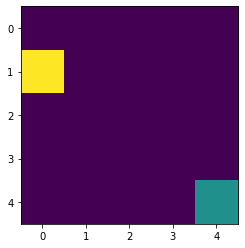

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.04834549 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

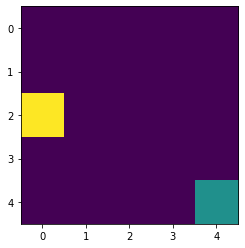

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.92236797 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

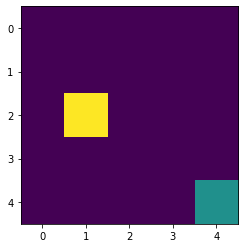

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.76727243  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

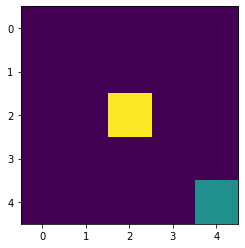

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.55639029 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

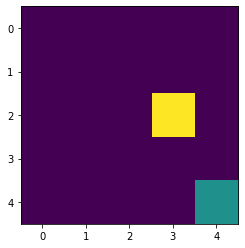

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.19689443 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

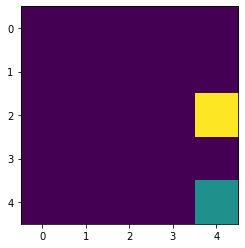

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.68622296 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

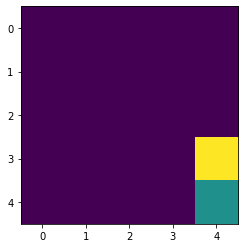

Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

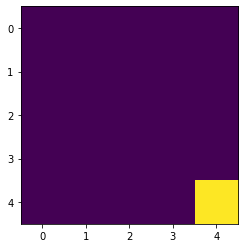

Episode: 48
Epsilon: 0.005726416897022355
Total Rewards: 8
Round 49
Action: Discrete(4)
Q_table: [[[ 3.2183206  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

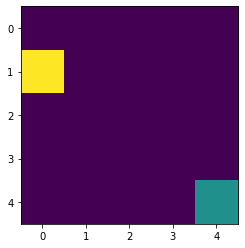

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.10652406 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

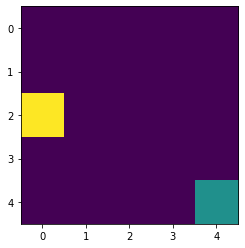

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    2.97918569 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

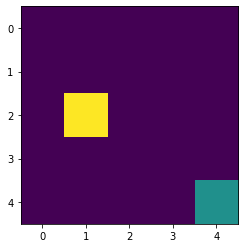

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.82062031  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

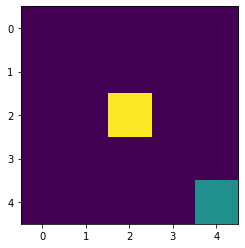

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.59847176 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

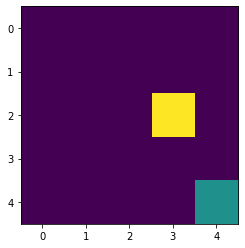

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.22896505 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

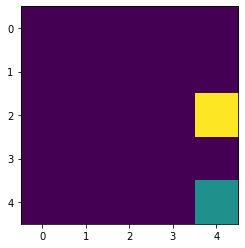

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.70289053 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

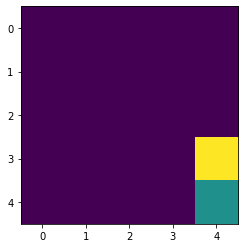

Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

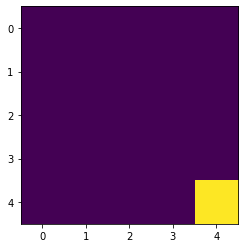

Episode: 49
Epsilon: 0.00515377520732012
Total Rewards: 8
Round 50
Action: Discrete(4)
Q_table: [[[ 3.2760757  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

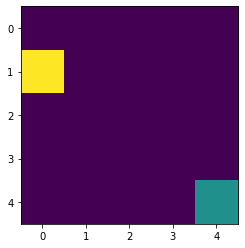

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.16399837 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

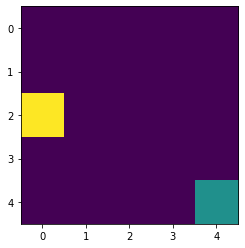

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.03512295 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

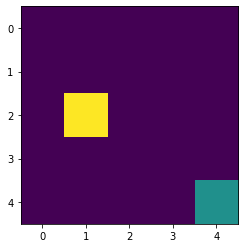

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.87242074  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

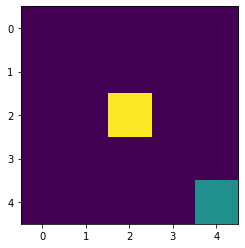

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.63923144 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

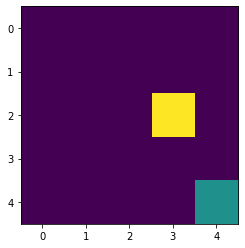

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.25932869 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

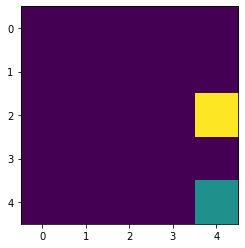

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.71836237 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

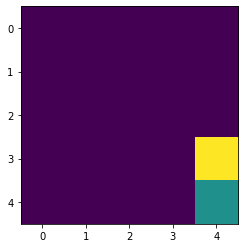

Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

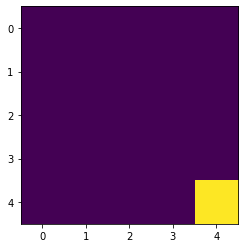

Episode: 50
Epsilon: 0.004638397686588107
Total Rewards: 8
Round 51
Action: Discrete(4)
Q_table: [[[ 3.33322799 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

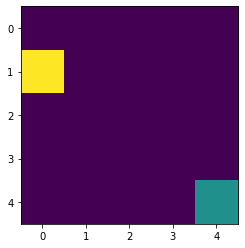

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2207596  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

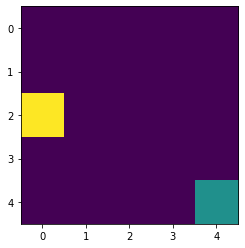

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.09012852 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

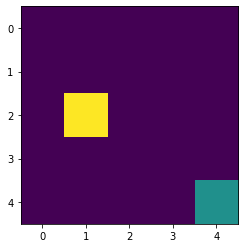

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.92270949  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

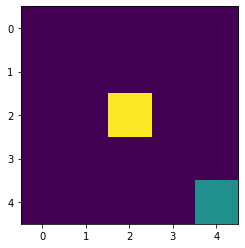

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.67864788 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

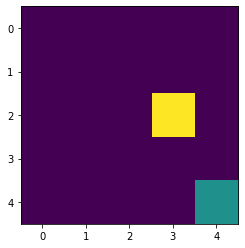

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.28804844 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

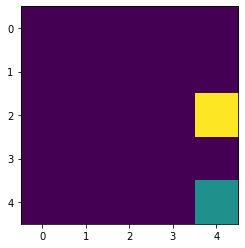

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.73271092 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

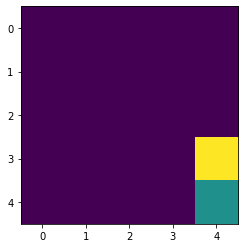

Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

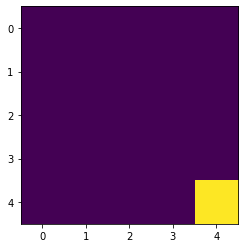

Episode: 51
Epsilon: 0.0041745579179292966
Total Rewards: 8
Round 52
Action: Discrete(4)
Q_table: [[[ 3.38977355 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

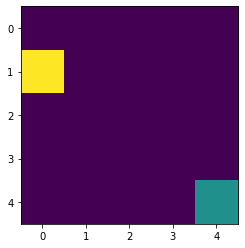

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.2767952  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

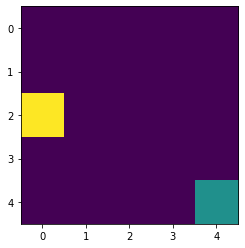

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.14415953 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

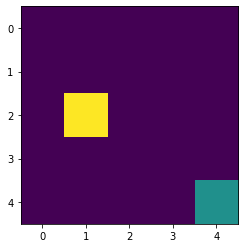

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     2.97151685  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

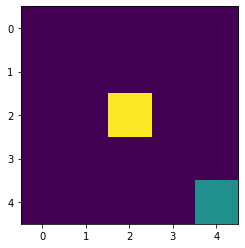

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.71670745 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

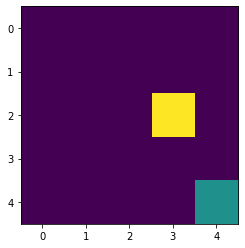

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.31518758 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

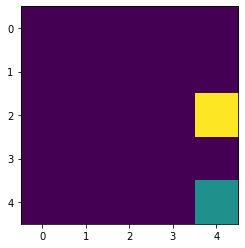

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.74600615 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

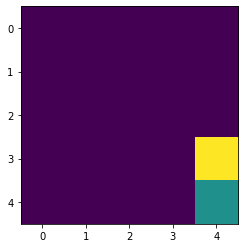

Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

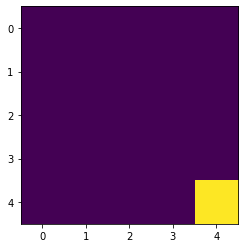

Episode: 52
Epsilon: 0.003757102126136367
Total Rewards: 8
Round 53
Action: Discrete(4)
Q_table: [[[ 3.44570777 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

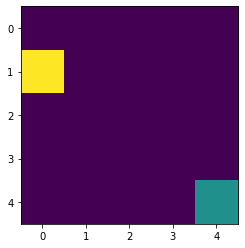

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.33209004 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

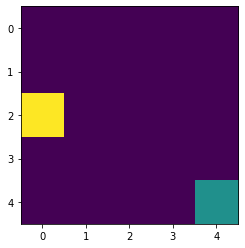

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.19718009 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

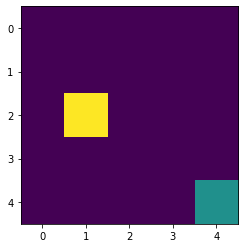

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.01886884  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

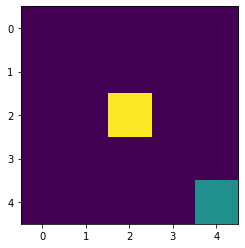

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.75340359 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

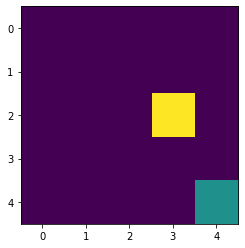

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.34080937 -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

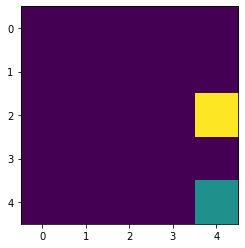

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.75831522 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

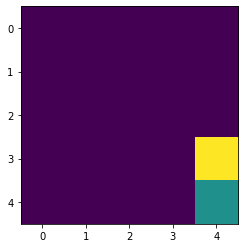

Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

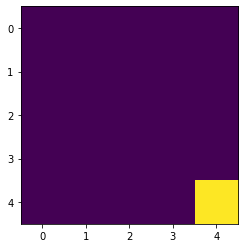

Episode: 53
Epsilon: 0.00338139191352273
Total Rewards: 8
Round 54
Action: Discrete(4)
Q_table: [[[ 3.50102509 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.        

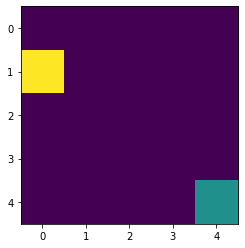

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.38662725 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

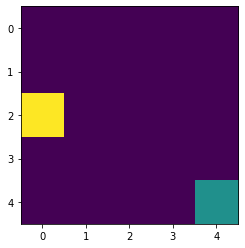

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.24916028 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

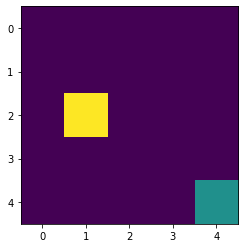

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.06478828  0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

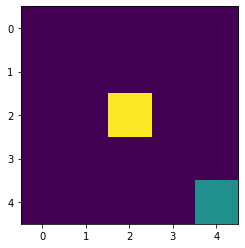

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.78873607 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

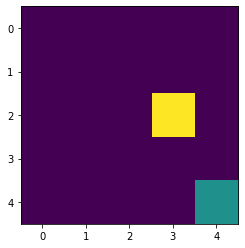

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.3649768  -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

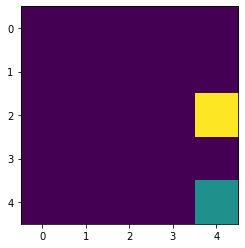

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.76970241 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

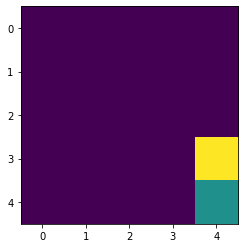

Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

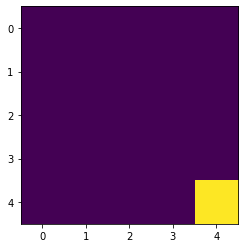

Episode: 54
Epsilon: 0.0030432527221704573
Total Rewards: 8
Round 55
Action: Discrete(4)
Q_table: [[[ 3.55571904 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

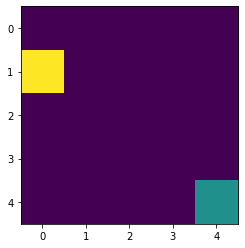

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.44038895 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

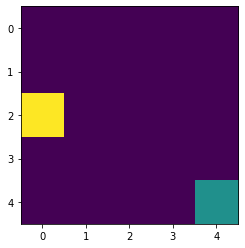

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.30007519 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

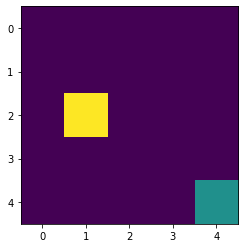

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.1092957   0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

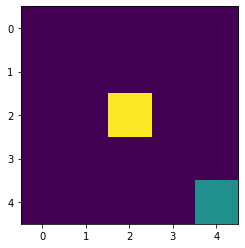

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.82271038 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

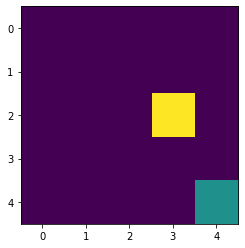

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.38775234 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

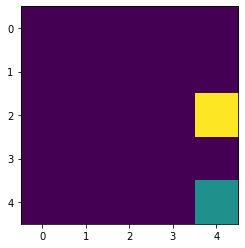

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78022902 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

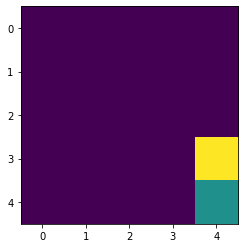

Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

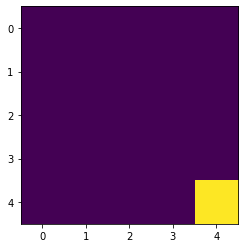

Episode: 55
Epsilon: 0.0027389274499534117
Total Rewards: 8
Round 56
Action: Discrete(4)
Q_table: [[[ 3.60978214 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

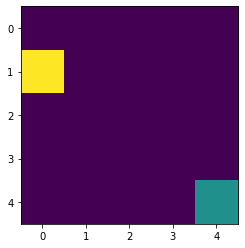

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.49335682 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

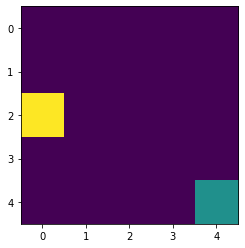

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.34990429 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

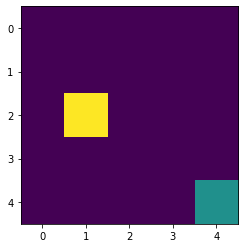

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.15241006  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

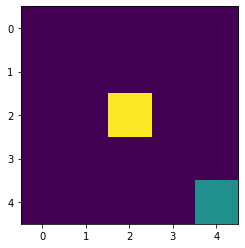

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.85533705 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

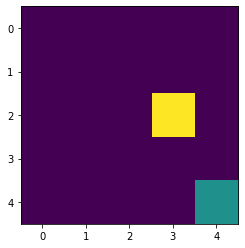

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.40919772 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

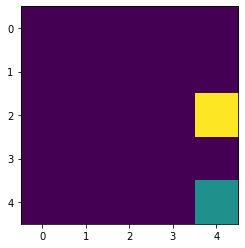

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.78995327 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

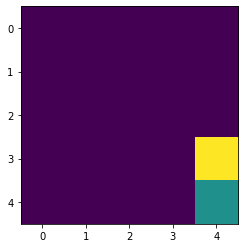

Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

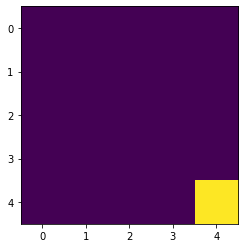

Episode: 56
Epsilon: 0.0024650347049580707
Total Rewards: 8
Round 57
Action: Discrete(4)
Q_table: [[[ 3.66320604 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

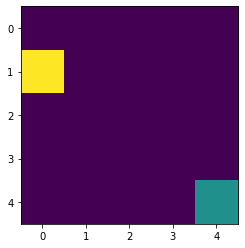

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.54551252 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

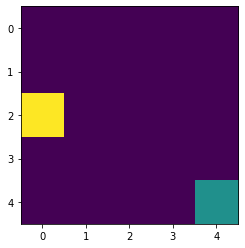

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.39863076 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

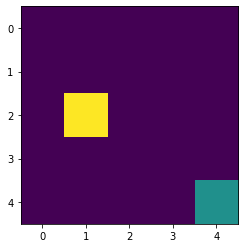

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.19414939  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

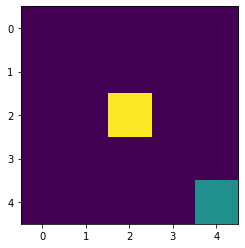

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.88663114 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

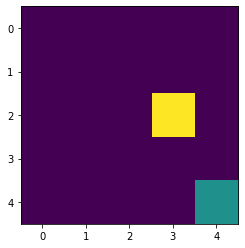

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.42937374 -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

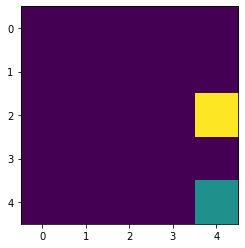

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.79893039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

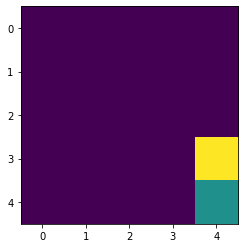

Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

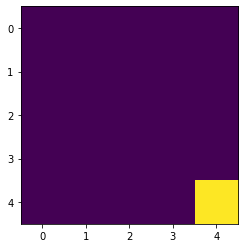

Episode: 57
Epsilon: 0.0022185312344622636
Total Rewards: 8
Round 58
Action: Discrete(4)
Q_table: [[[ 3.71598156 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

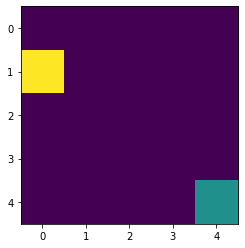

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.59683804 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

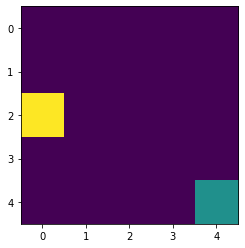

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.44624113 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

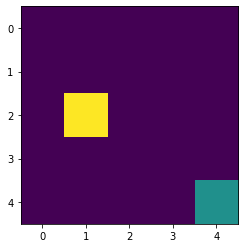

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.23453125  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

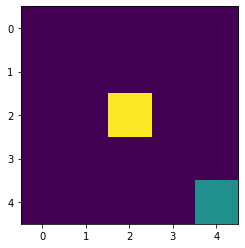

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.91661166 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

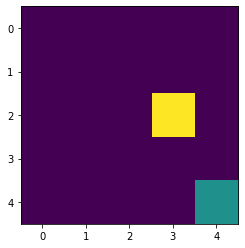

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.4483401  -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

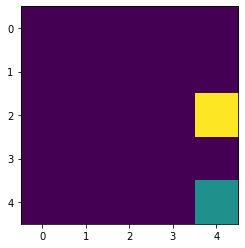

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.80721255 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

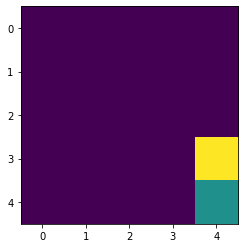

Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

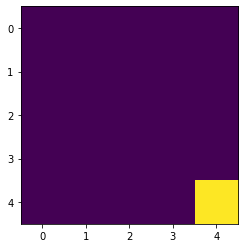

Episode: 58
Epsilon: 0.001996678111016037
Total Rewards: 8
Round 59
Action: Discrete(4)
Q_table: [[[ 3.76809883 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

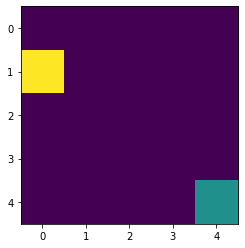

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.64731594 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

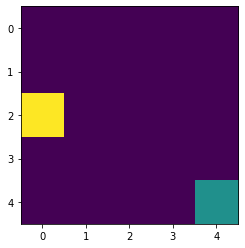

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.49272483 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

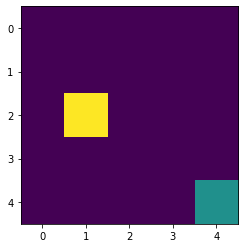

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.27357318  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

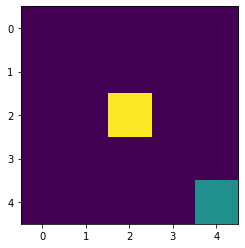

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.94530111 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

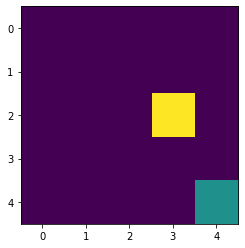

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.46615522 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

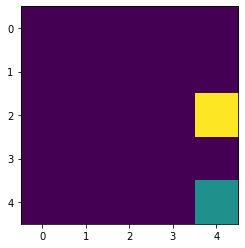

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.81484898 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

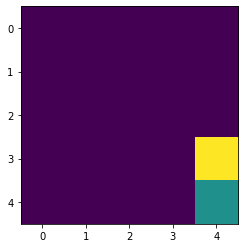

Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

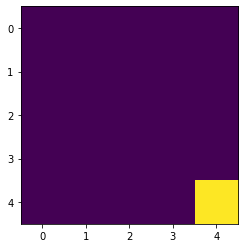

Episode: 59
Epsilon: 0.0017970102999144335
Total Rewards: 8
Round 60
Action: Discrete(4)
Q_table: [[[ 3.81954738 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

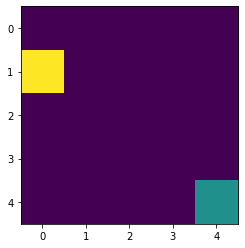

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.69692958 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

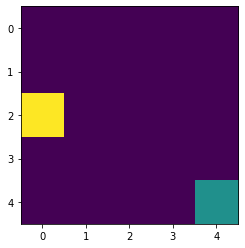

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.53807393 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

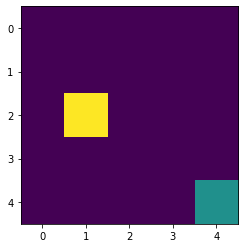

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.31129296  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

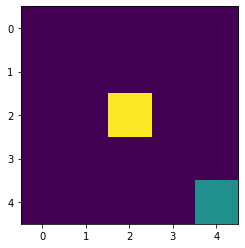

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.97272496 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

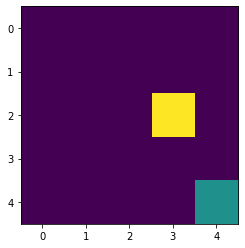

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.48287611 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

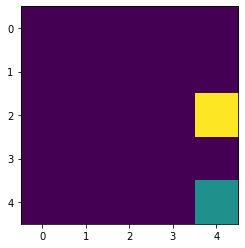

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82188599 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

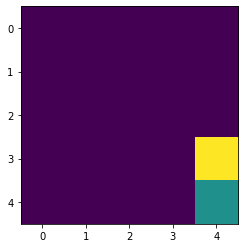

Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

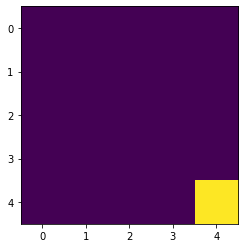

Episode: 60
Epsilon: 0.0016173092699229901
Total Rewards: 8
Round 61
Action: Discrete(4)
Q_table: [[[ 3.8703163  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

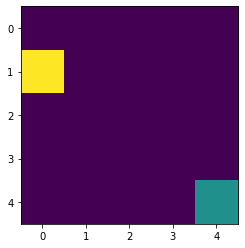

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.74566327 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

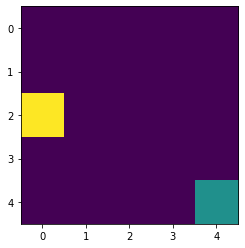

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.58228291 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

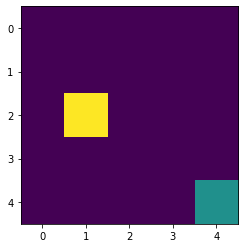

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.34770891  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

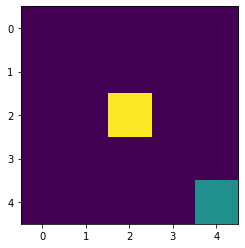

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          2.99891132 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

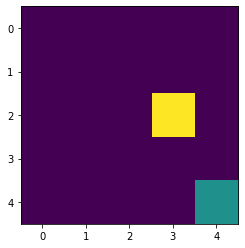

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.49855824 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

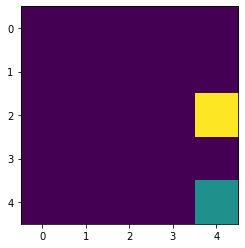

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.82836711 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

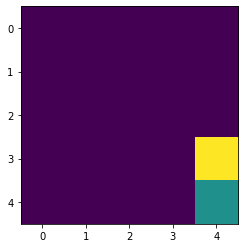

Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

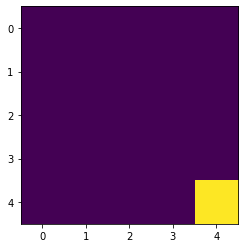

Episode: 61
Epsilon: 0.0014555783429306911
Total Rewards: 8
Round 62
Action: Discrete(4)
Q_table: [[[ 3.92039437 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

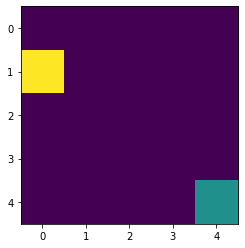

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.79350241 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

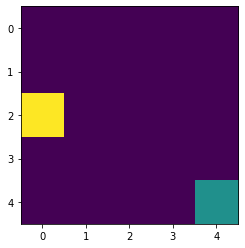

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.62534842 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

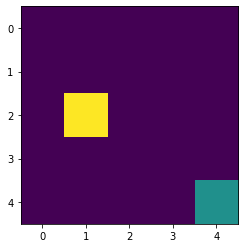

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.38284004  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

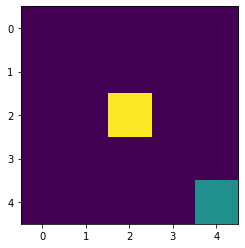

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.02389043 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

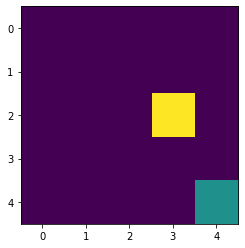

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.51325545 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

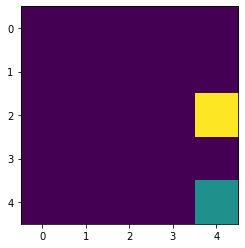

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83433315 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

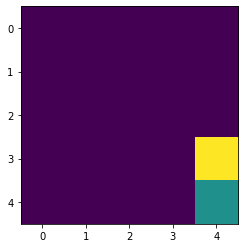

Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

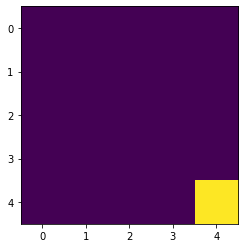

Episode: 62
Epsilon: 0.001310020508637622
Total Rewards: 8
Round 63
Action: Discrete(4)
Q_table: [[[ 3.96977015 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

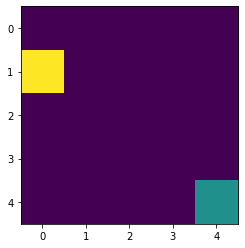

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.84043353 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

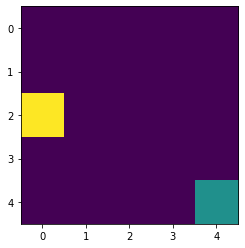

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.66726918 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

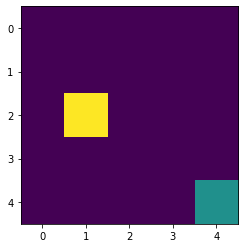

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.41670617  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

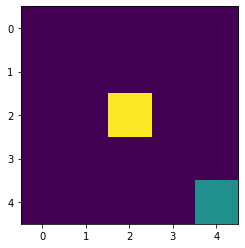

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.04769438 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

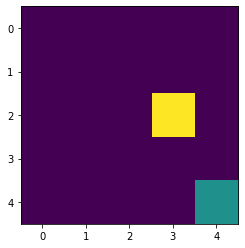

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.52701989 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

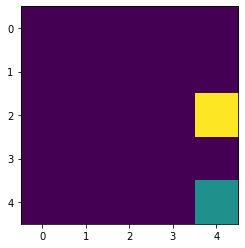

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.83982231 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

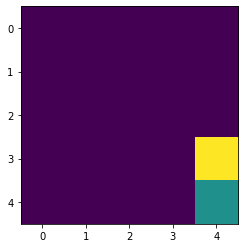

Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

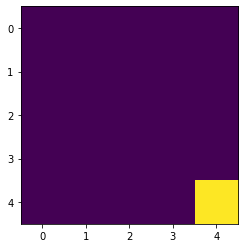

Episode: 63
Epsilon: 0.0011790184577738598
Total Rewards: 8
Round 64
Action: Discrete(4)
Q_table: [[[ 4.01843215 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

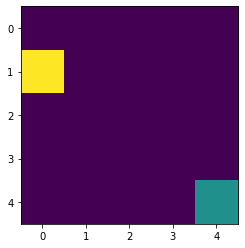

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.8864444  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

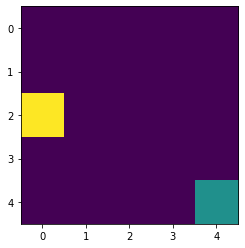

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.70804582 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

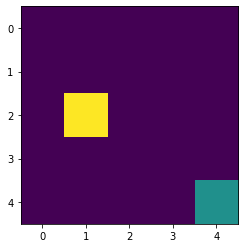

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.44932805  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

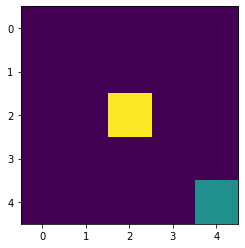

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.07035673 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

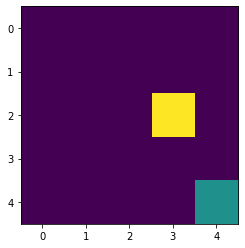

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.53990191 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

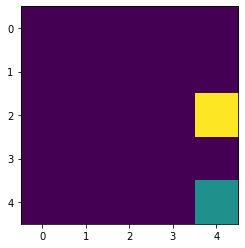

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.8448703  -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

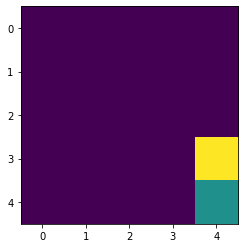

Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

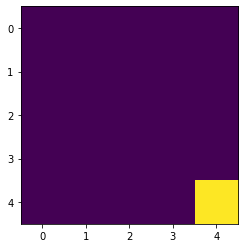

Episode: 64
Epsilon: 0.0010611166119964739
Total Rewards: 8
Round 65
Action: Discrete(4)
Q_table: [[[ 4.06636893 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

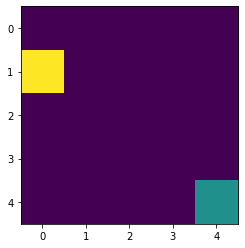

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.93152408 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

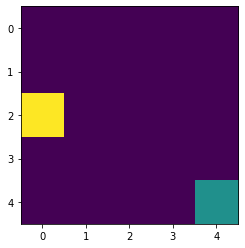

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.74768076 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

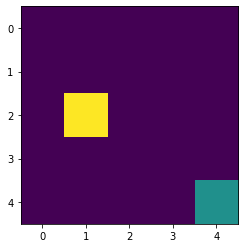

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.48072735  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

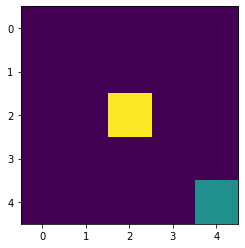

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.09191223 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

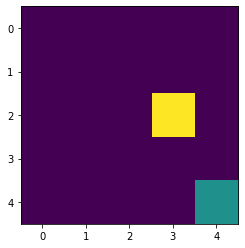

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.55195005 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

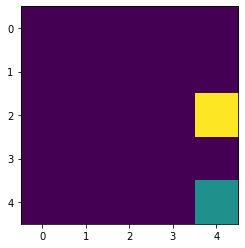

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.84951048 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

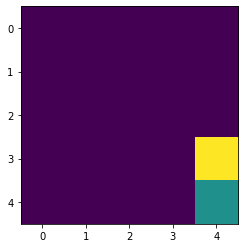

Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

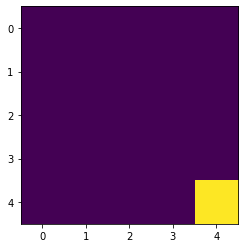

Episode: 65
Epsilon: 0.0009550049507968265
Total Rewards: 8
Round 66
Action: Discrete(4)
Q_table: [[[ 4.11356921 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

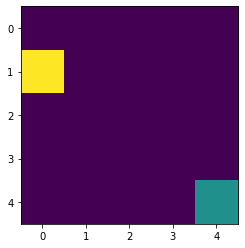

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 3.97566294 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

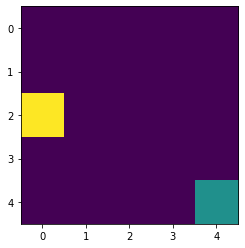

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.78617815 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

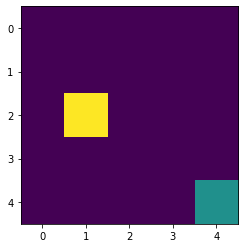

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.51092671  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

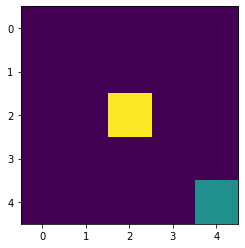

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.11239651 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

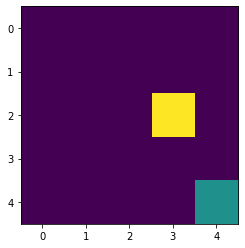

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.56321098 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

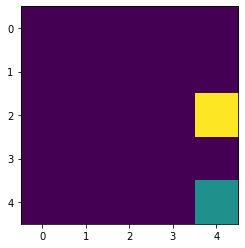

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85377391 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

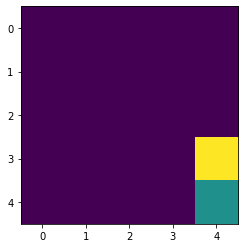

Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

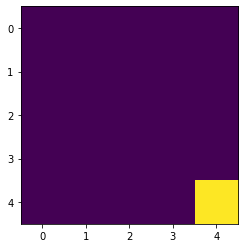

Episode: 66
Epsilon: 0.0008595044557171439
Total Rewards: 8
Round 67
Action: Discrete(4)
Q_table: [[[ 4.16002195 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

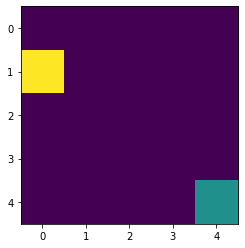

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.01885268 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

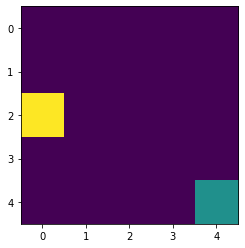

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.82354374 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

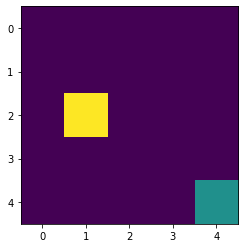

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.53994973  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

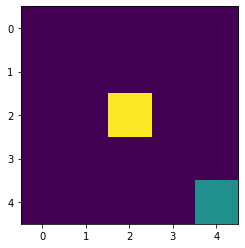

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.13184585 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

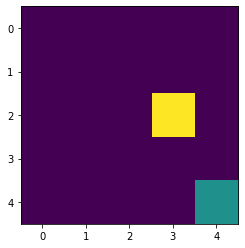

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.57372954 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

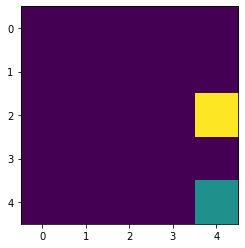

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.85768956 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

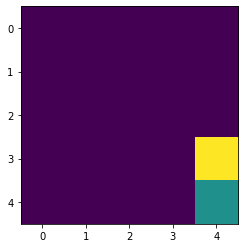

Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

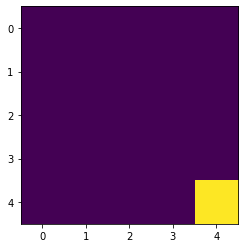

Episode: 67
Epsilon: 0.0007735540101454295
Total Rewards: 8
Round 68
Action: Discrete(4)
Q_table: [[[ 4.2057165  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

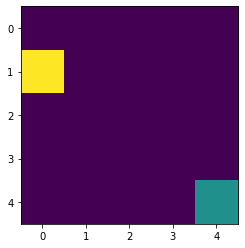

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.06108635 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

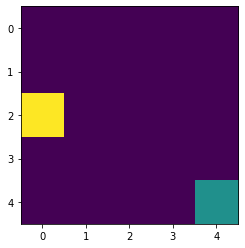

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.85978484 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

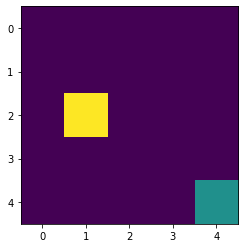

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.56782088  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

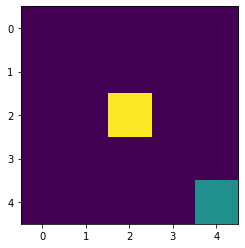

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.15029692 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

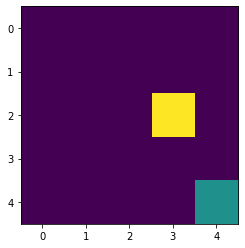

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.58354864 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

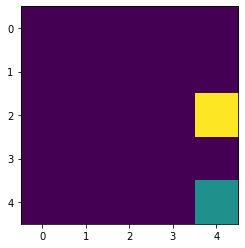

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86128433 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

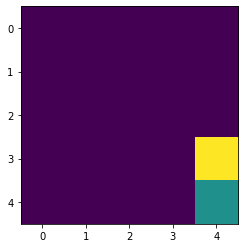

Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

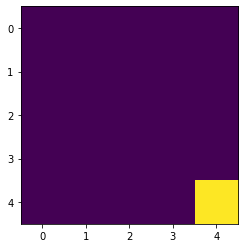

Episode: 68
Epsilon: 0.0006961986091308866
Total Rewards: 8
Round 69
Action: Discrete(4)
Q_table: [[[ 4.25064262 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

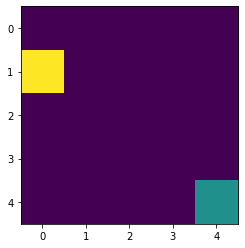

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.10235835 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

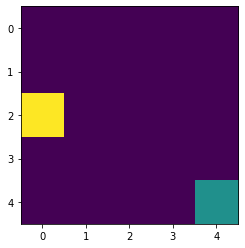

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.89491023 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

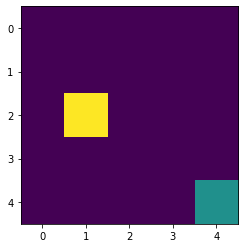

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.59456552  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

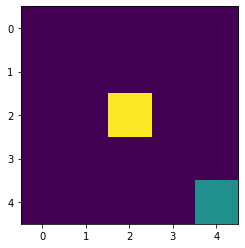

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.16778661 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

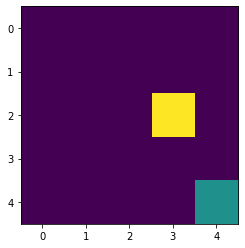

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.59270937 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

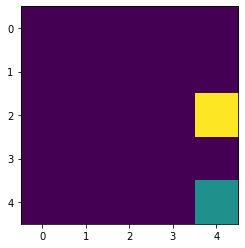

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86458326 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

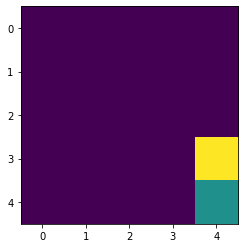

Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

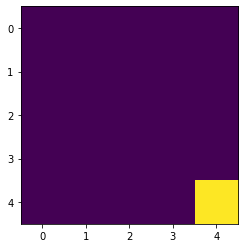

Episode: 69
Epsilon: 0.0006265787482177979
Total Rewards: 8
Round 70
Action: Discrete(4)
Q_table: [[[ 4.29479061 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

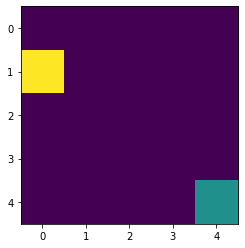

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.14266444 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

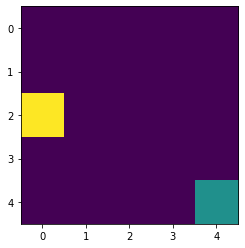

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.92893011 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

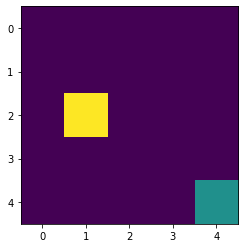

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.62020976  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

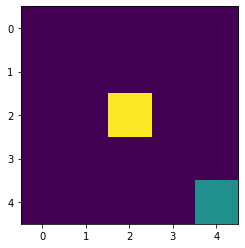

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.18435179 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

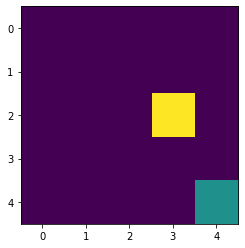

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60125093 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

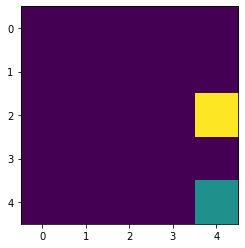

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.86760955 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

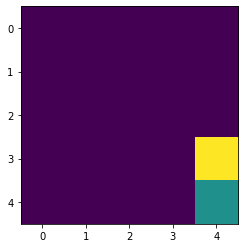

Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

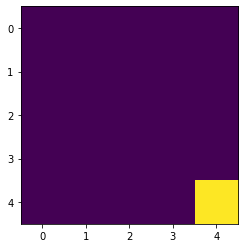

Episode: 70
Epsilon: 0.0005639208733960181
Total Rewards: 8
Round 71
Action: Discrete(4)
Q_table: [[[ 4.33815135 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

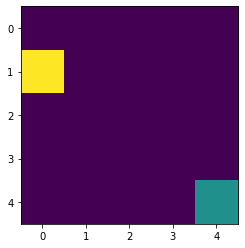

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.1820017  -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

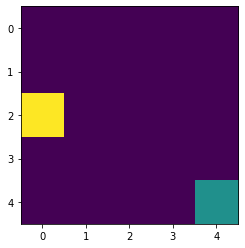

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.96185597 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

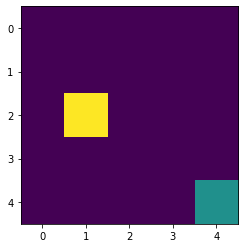

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.64478044  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

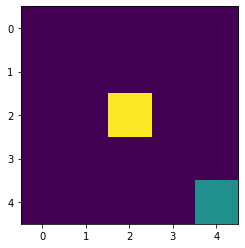

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.20002919 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

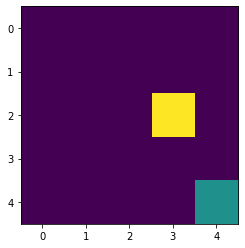

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.60921069 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

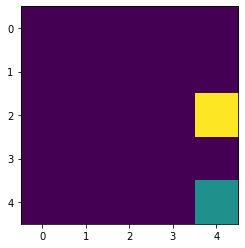

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87038476 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

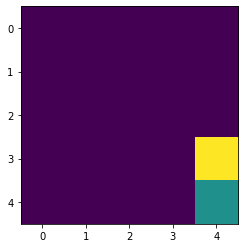

Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

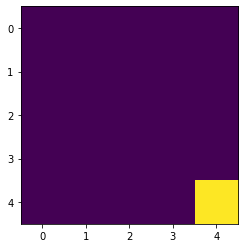

Episode: 71
Epsilon: 0.0005075287860564164
Total Rewards: 8
Round 72
Action: Discrete(4)
Q_table: [[[ 4.38071636 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

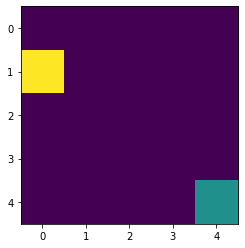

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.22036857 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

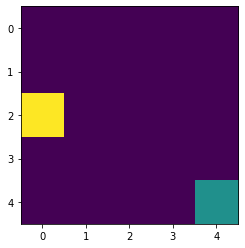

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    3.99370062 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

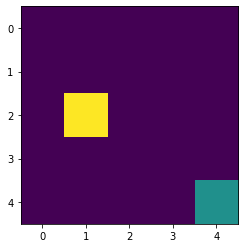

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.66830503  0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

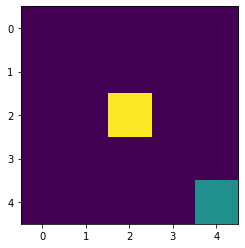

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.21485524 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

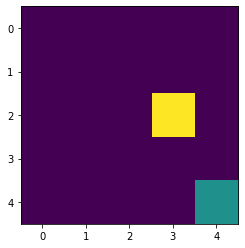

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.61662425 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

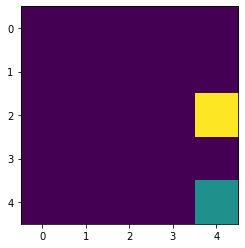

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87292883 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

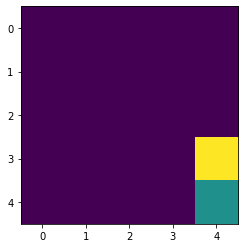

Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

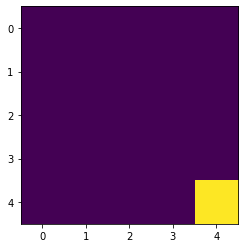

Episode: 72
Epsilon: 0.00045677590745077476
Total Rewards: 8
Round 73
Action: Discrete(4)
Q_table: [[[ 4.4224779  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

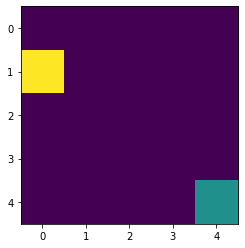

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.25776477 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

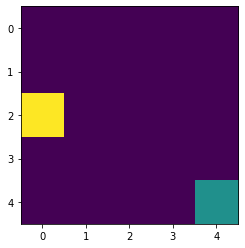

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.02447801 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

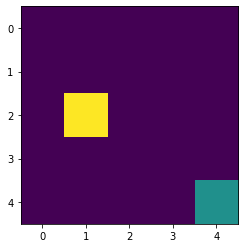

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.6908115   0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

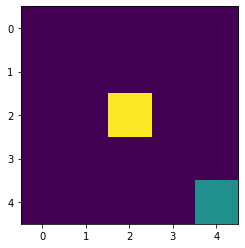

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.22886589 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

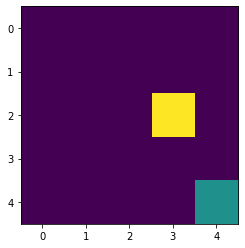

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.62352542 -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

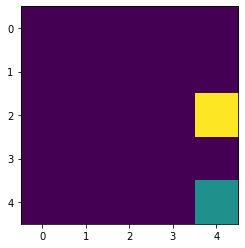

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87526023 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

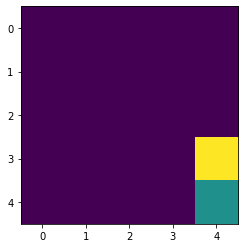

Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

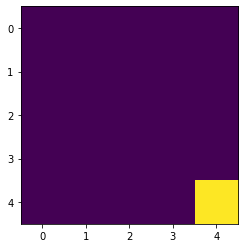

Episode: 73
Epsilon: 0.0004110983167056973
Total Rewards: 8
Round 74
Action: Discrete(4)
Q_table: [[[ 4.46342894 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

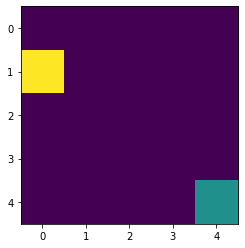

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.29419131 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

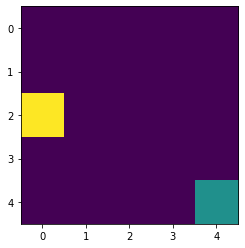

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.05420324 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

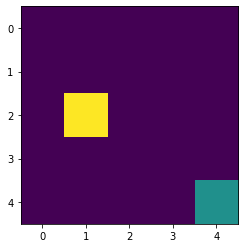

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.71232828  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

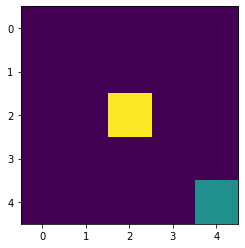

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.24209659 -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

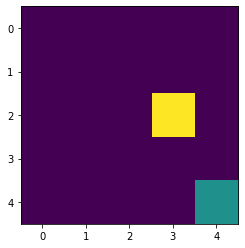

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.6299463  -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

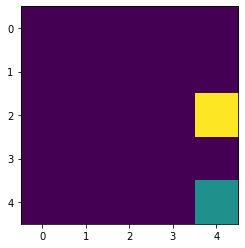

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87739607 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

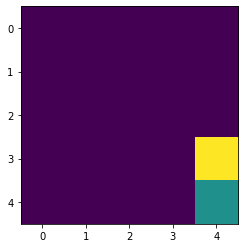

Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

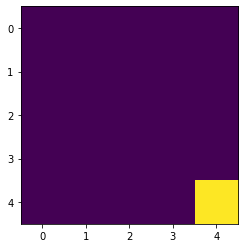

Episode: 74
Epsilon: 0.0003699884850351276
Total Rewards: 8
Round 75
Action: Discrete(4)
Q_table: [[[ 4.50356326 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

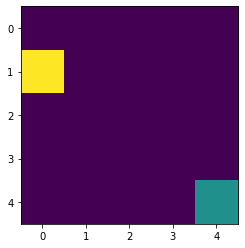

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.32965047 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

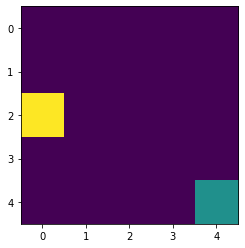

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.08289246 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

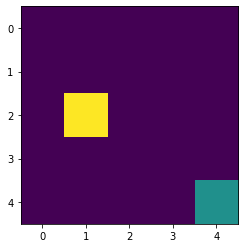

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.73288414  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

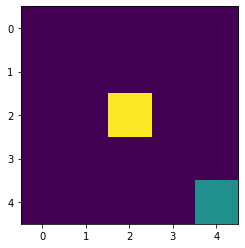

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.2545821  -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

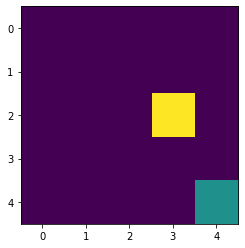

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.63591732 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

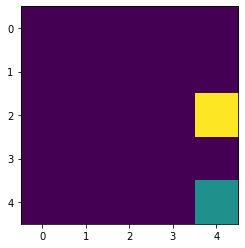

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.87935214 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

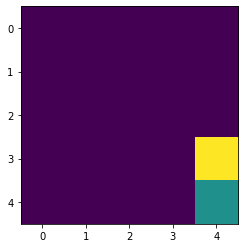

Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

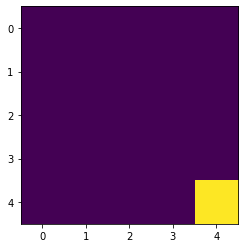

Episode: 75
Epsilon: 0.00033298963653161486
Total Rewards: 8
Round 76
Action: Discrete(4)
Q_table: [[[ 4.54287548 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

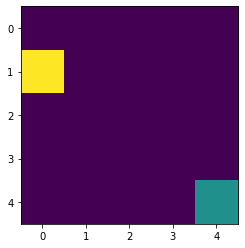

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.36414575 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

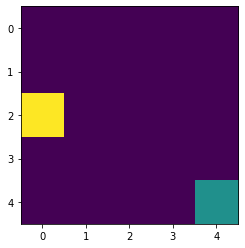

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.11056279 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

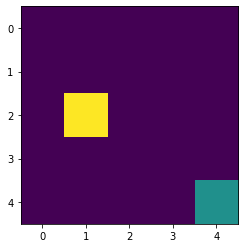

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.75250812  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

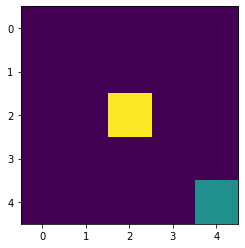

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.26635645 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

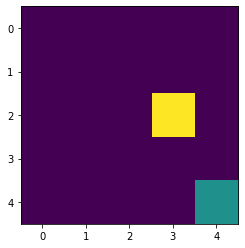

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64146728 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

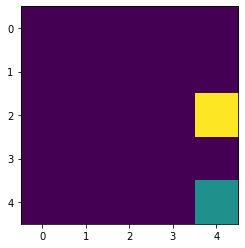

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88114303 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

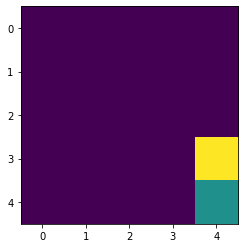

Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

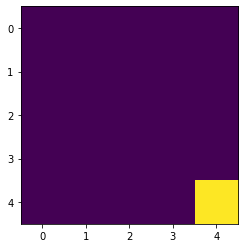

Episode: 76
Epsilon: 0.0002996906728784534
Total Rewards: 8
Round 77
Action: Discrete(4)
Q_table: [[[ 4.58136105 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

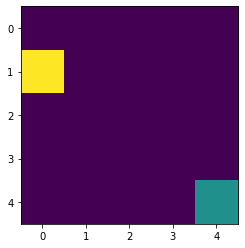

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.39768182 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

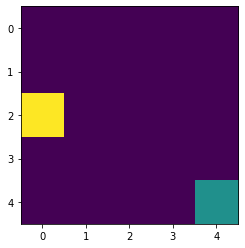

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.13723224 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

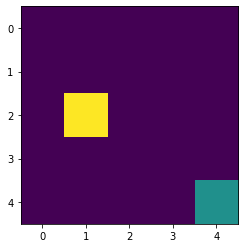

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.77122939  0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

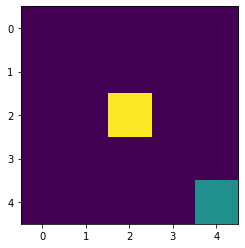

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.27745286 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

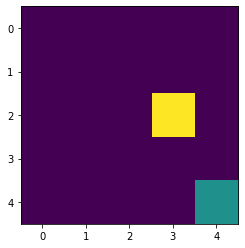

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.64662342 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

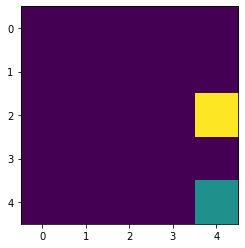

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88278223 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

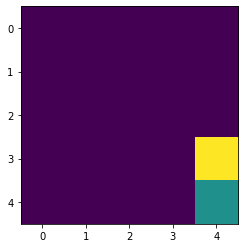

Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

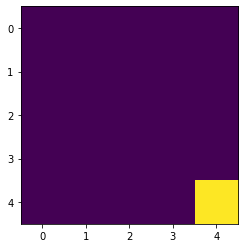

Episode: 77
Epsilon: 0.00026972160559060804
Total Rewards: 8
Round 78
Action: Discrete(4)
Q_table: [[[ 4.61901631 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

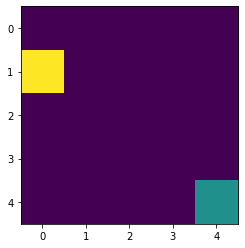

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.43026454 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

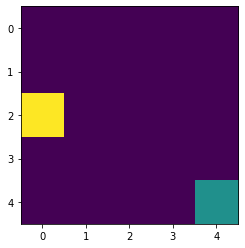

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.16291966 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

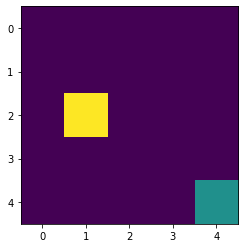

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.7890772   0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

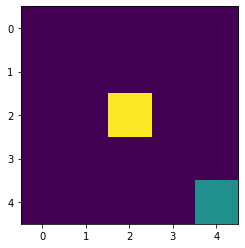

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.28790368 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

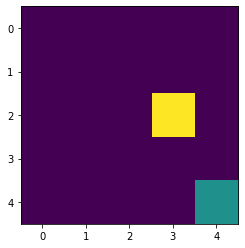

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65141148 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

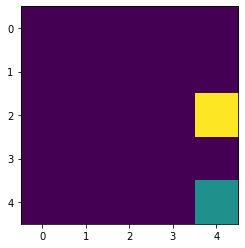

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88428215 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

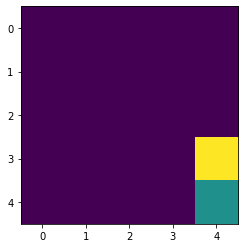

Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

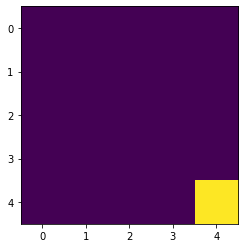

Episode: 78
Epsilon: 0.00024274944503154723
Total Rewards: 8
Round 79
Action: Discrete(4)
Q_table: [[[ 4.65583849 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

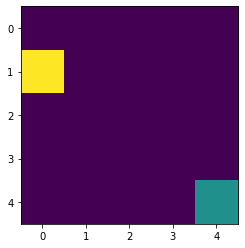

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.46190086 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

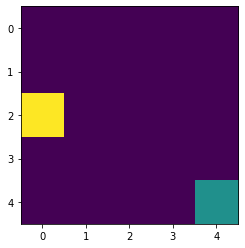

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.18764464 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

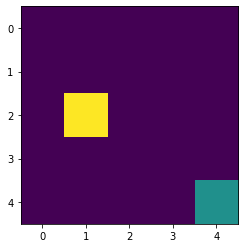

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.80608082  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

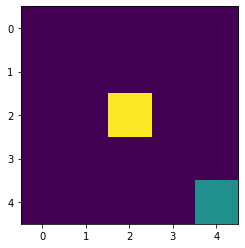

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.29774035 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

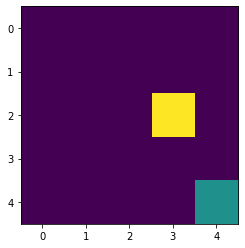

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65585573 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

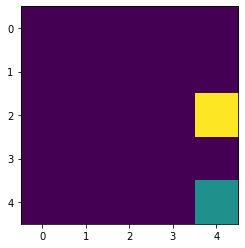

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88565427 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

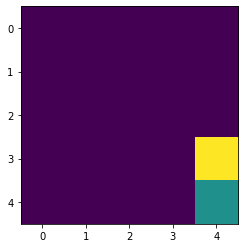

Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

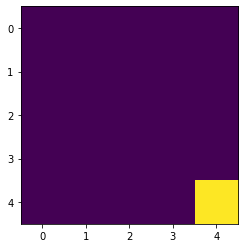

Episode: 79
Epsilon: 0.00021847450052839252
Total Rewards: 8
Round 80
Action: Discrete(4)
Q_table: [[[ 4.69182571 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

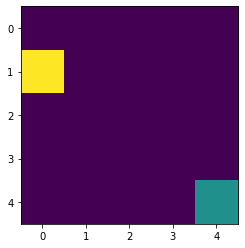

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.49259879 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

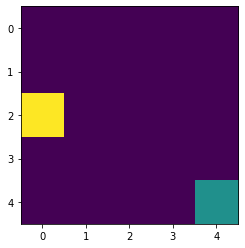

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.21142745 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

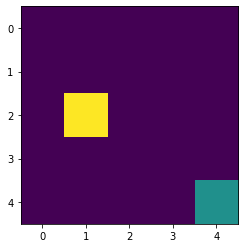

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.82226937  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

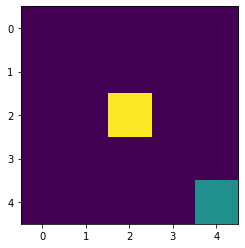

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.30699333 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

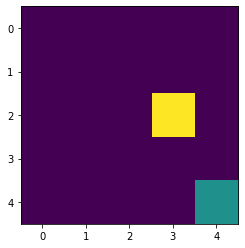

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.65997904 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

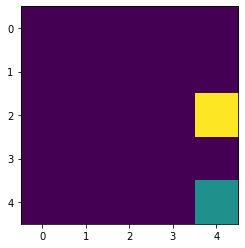

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88690914 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

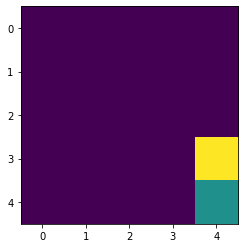

Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

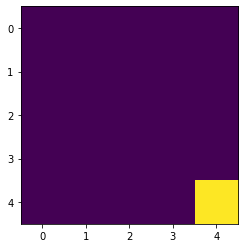

Episode: 80
Epsilon: 0.00019662705047555326
Total Rewards: 8
Round 81
Action: Discrete(4)
Q_table: [[[ 4.72697703 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

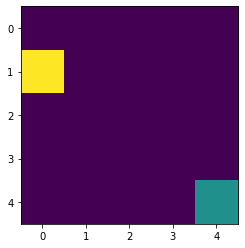

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.52236738 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

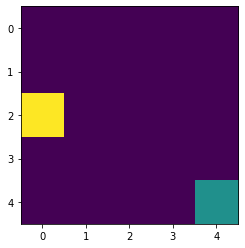

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.23428895 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

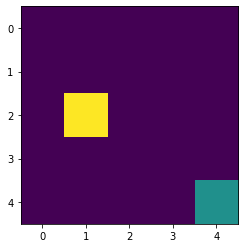

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.83767183  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

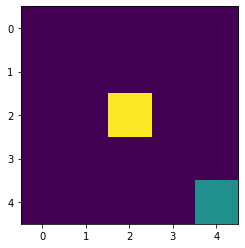

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.31569211 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

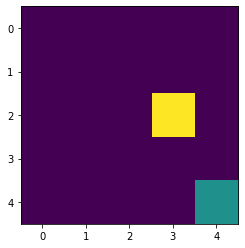

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66380296 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

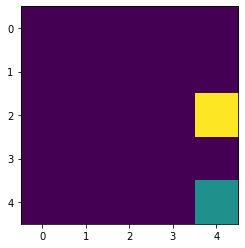

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88805649 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

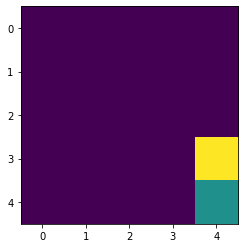

Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

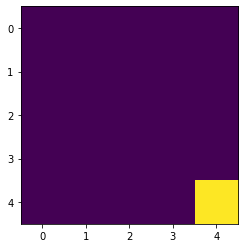

Episode: 81
Epsilon: 0.00017696434542799794
Total Rewards: 8
Round 82
Action: Discrete(4)
Q_table: [[[ 4.7612924  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

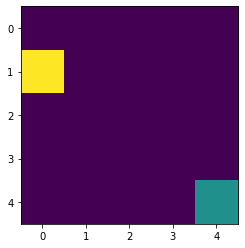

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.55121665 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

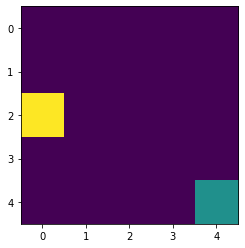

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.25625052 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

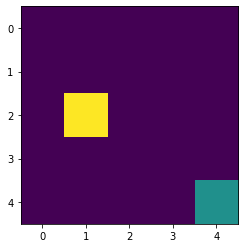

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.85231694  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

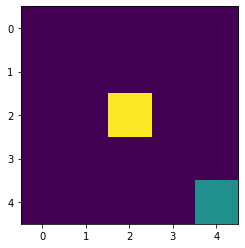

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.32386516 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

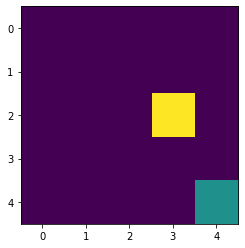

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.66734774 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

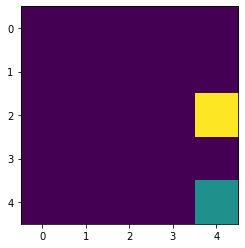

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.88910529 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

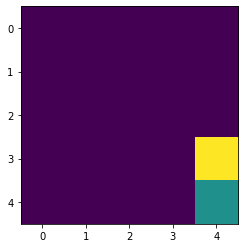

Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

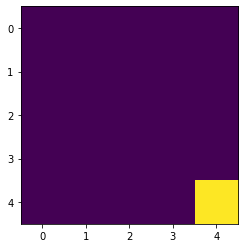

Episode: 82
Epsilon: 0.00015926791088519815
Total Rewards: 8
Round 83
Action: Discrete(4)
Q_table: [[[ 4.79477265 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

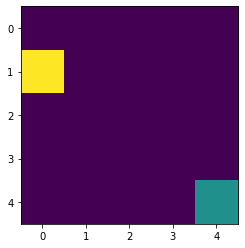

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.57915753 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

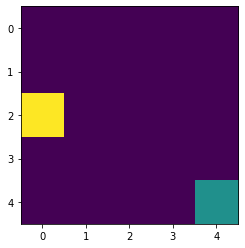

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.27733399 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

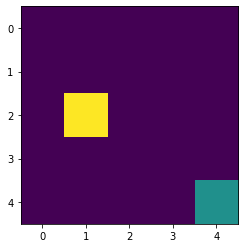

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.86623311  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

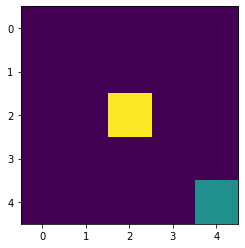

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33153994 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

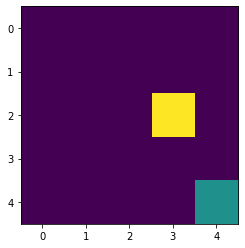

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67063245 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

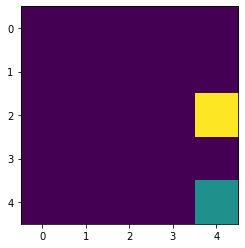

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89006376 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

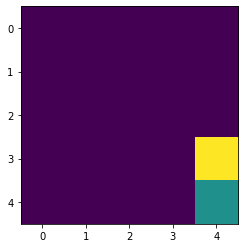

Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

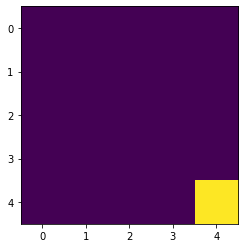

Episode: 83
Epsilon: 0.00014334111979667834
Total Rewards: 8
Round 84
Action: Discrete(4)
Q_table: [[[ 4.82741957 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

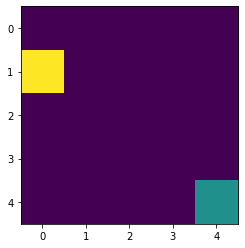

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.60620184 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

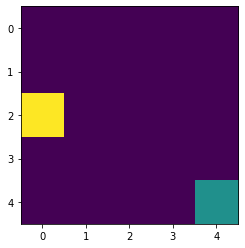

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.29756157 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

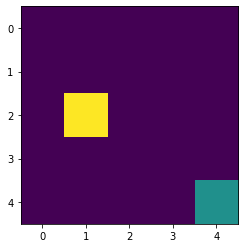

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.87944839  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

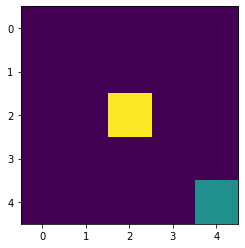

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.33874287 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

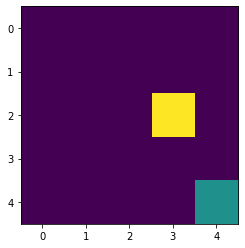

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.67367494 -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

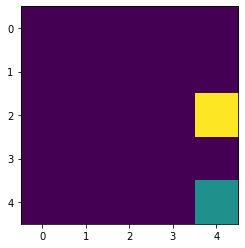

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89093948 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

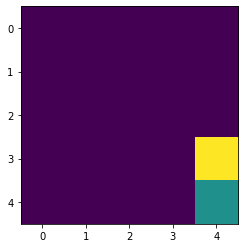

Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

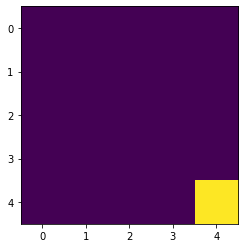

Episode: 84
Epsilon: 0.00012900700781701051
Total Rewards: 8
Round 85
Action: Discrete(4)
Q_table: [[[ 4.85923578 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

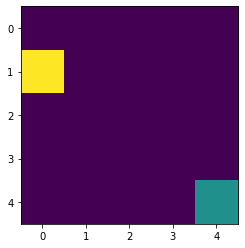

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.63236219 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

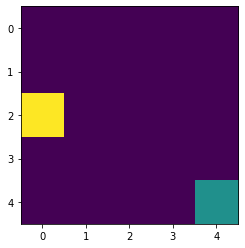

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.31695577 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

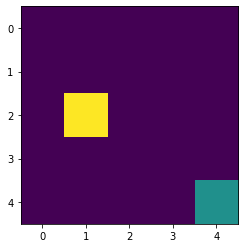

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.89199041  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

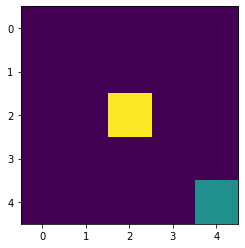

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.34549933 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

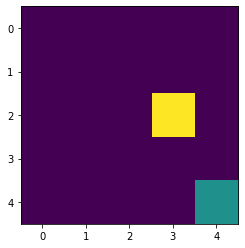

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.676492   -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

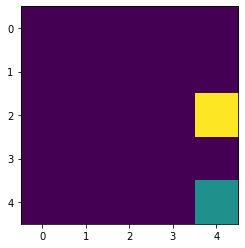

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89173942 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

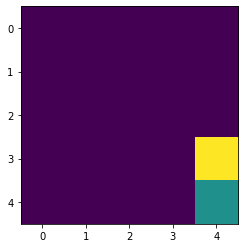

Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

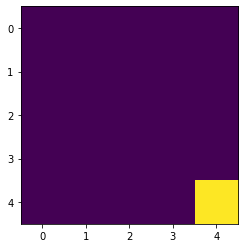

Episode: 85
Epsilon: 0.00011610630703530947
Total Rewards: 8
Round 86
Action: Discrete(4)
Q_table: [[[ 4.8902248  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

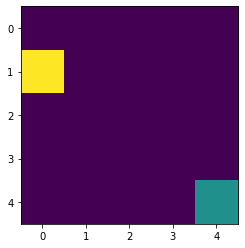

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.65765199 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

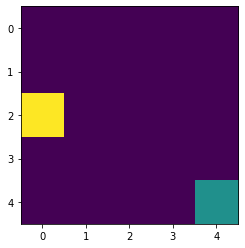

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.33553933 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

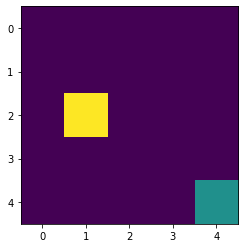

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.90388631  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

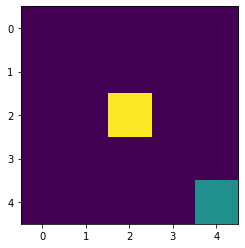

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35183367 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

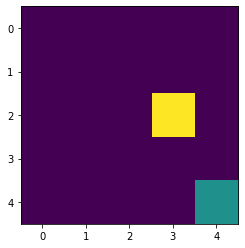

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.67909935 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

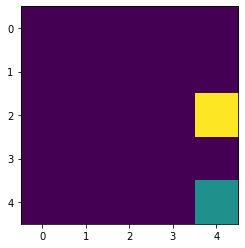

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89246998 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

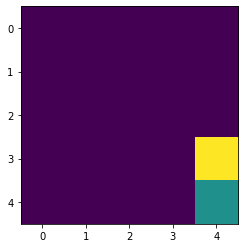

Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

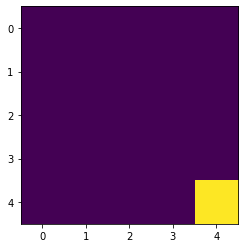

Episode: 86
Epsilon: 0.00010449567633177853
Total Rewards: 8
Round 87
Action: Discrete(4)
Q_table: [[[ 4.920391   -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

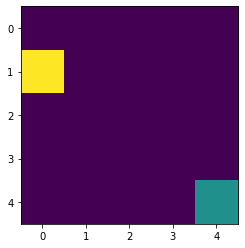

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.68208533 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

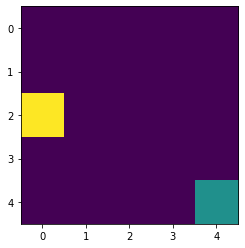

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.35333516 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

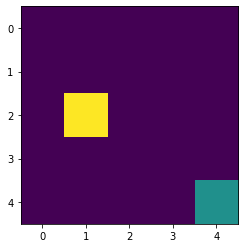

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.91516271  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

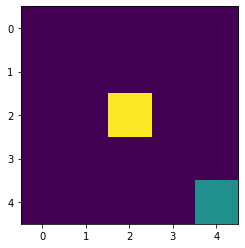

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.35776925 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

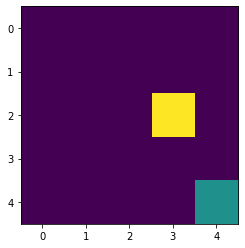

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68151171 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

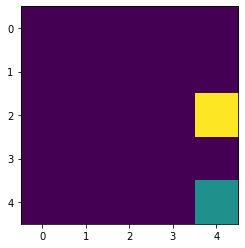

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89313703 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

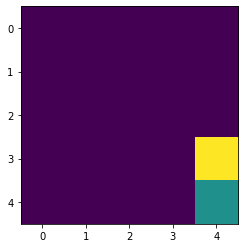

Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

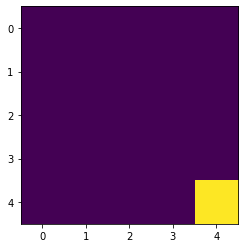

Episode: 87
Epsilon: 9.404610869860067e-05
Total Rewards: 8
Round 88
Action: Discrete(4)
Q_table: [[[ 4.94973958 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

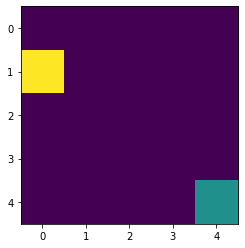

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.70567697 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

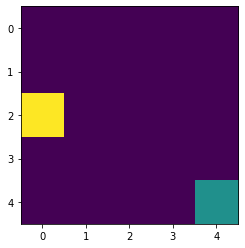

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.37036629 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

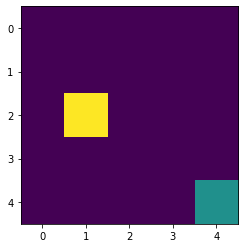

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.92584567  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

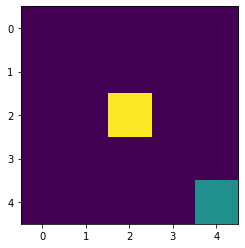

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.36332838 -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

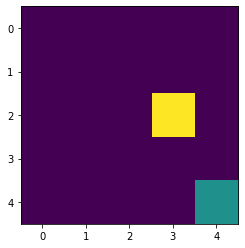

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68374287 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

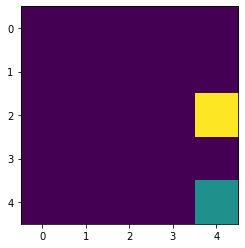

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89374597 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

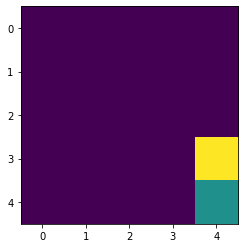

Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

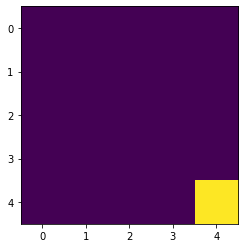

Episode: 88
Epsilon: 8.464149782874061e-05
Total Rewards: 8
Round 89
Action: Discrete(4)
Q_table: [[[ 4.97827655 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

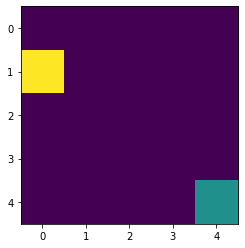

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.72844224 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

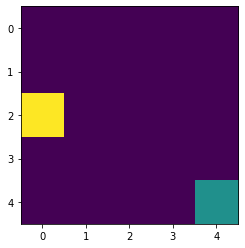

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.38665577 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

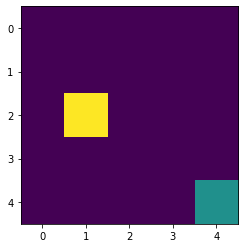

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.93596066  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

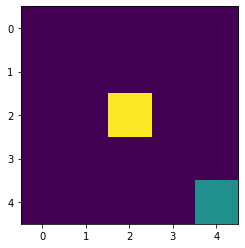

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.3685324  -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

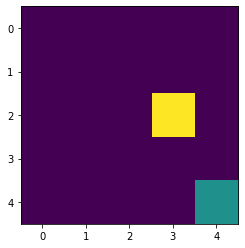

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68580572 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

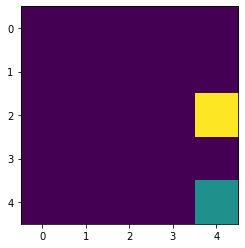

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89430175 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

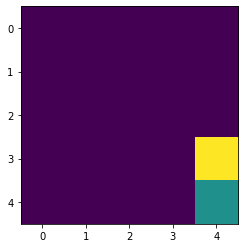

Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

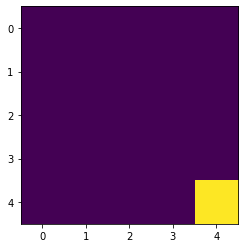

Episode: 89
Epsilon: 7.617734804586655e-05
Total Rewards: 8
Round 90
Action: Discrete(4)
Q_table: [[[ 5.00600869 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

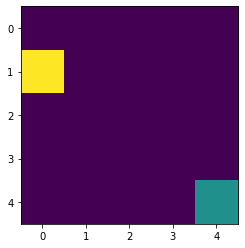

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.75039703 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

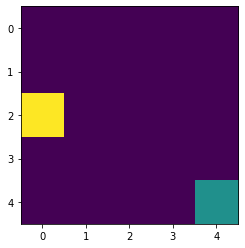

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.40222665 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

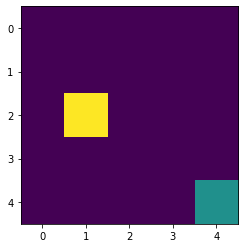

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.94553251  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

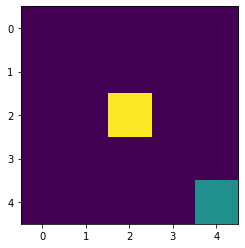

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37340167 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

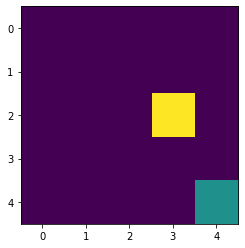

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68771231 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

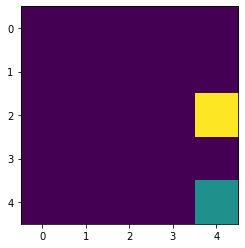

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89480892 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

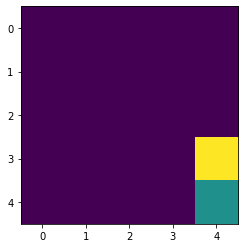

Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

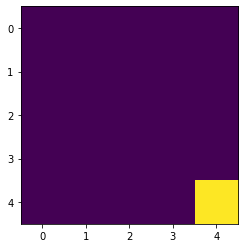

Episode: 90
Epsilon: 6.85596132412799e-05
Total Rewards: 8
Round 91
Action: Discrete(4)
Q_table: [[[ 5.03294356 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.       

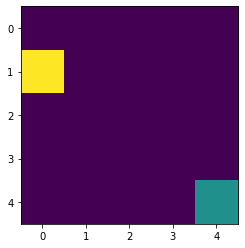

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.77155773 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

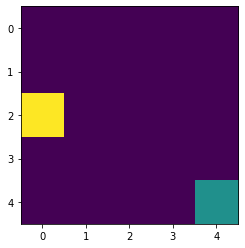

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.41710192 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

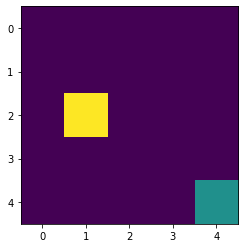

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.95458541  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

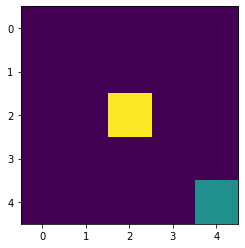

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.37795561 -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

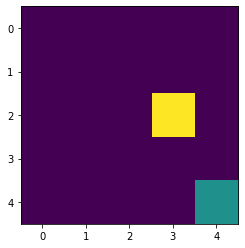

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.68947388 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

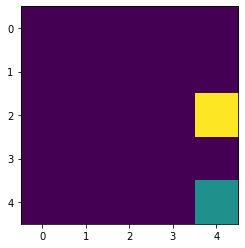

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89527164 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

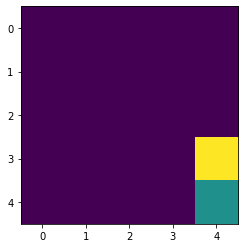

Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

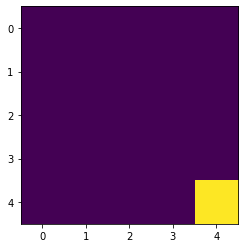

Episode: 91
Epsilon: 6.170365191715192e-05
Total Rewards: 8
Round 92
Action: Discrete(4)
Q_table: [[[ 5.0590894  -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

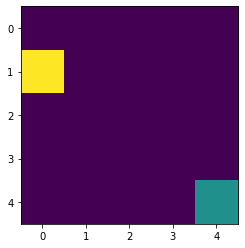

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.79194113 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

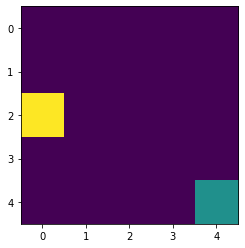

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.43130441 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

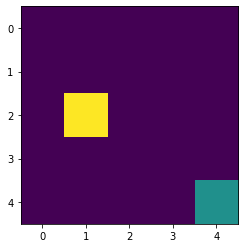

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.96314287  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

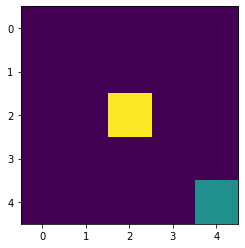

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.3822127  -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

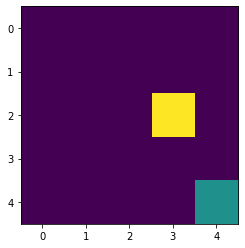

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69110094 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

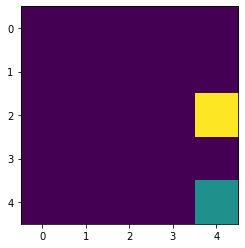

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89569372 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

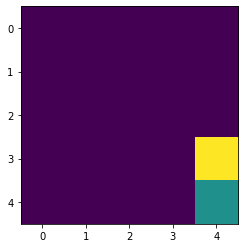

Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

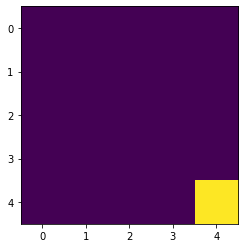

Episode: 92
Epsilon: 5.5533286725436733e-05
Total Rewards: 8
Round 93
Action: Discrete(4)
Q_table: [[[ 5.08445516 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

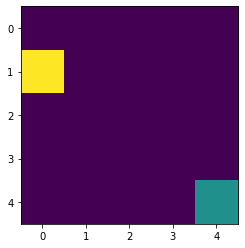

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.81156441 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

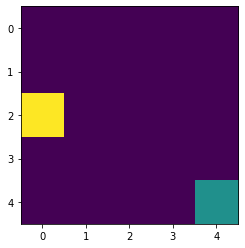

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.44485683 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

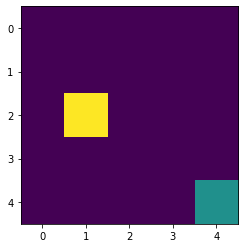

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.97122773  0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

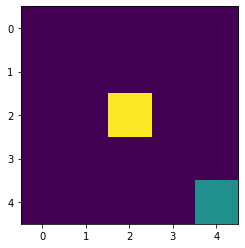

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38619052 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

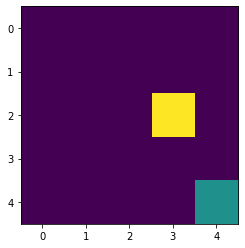

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69260328 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

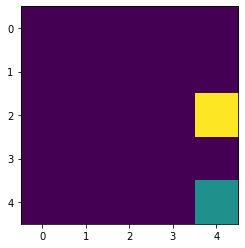

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89607867 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

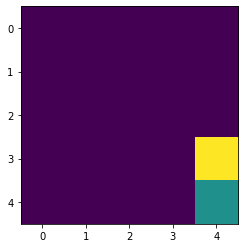

Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

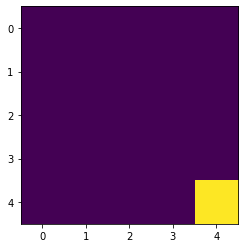

Episode: 93
Epsilon: 4.997995805289306e-05
Total Rewards: 8
Round 94
Action: Discrete(4)
Q_table: [[[ 5.10905044 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

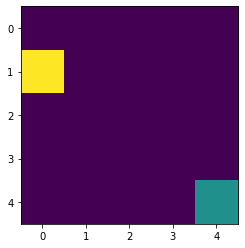

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.83044508 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

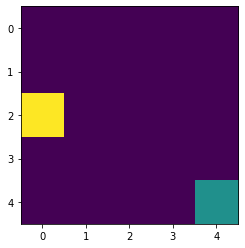

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.45778164 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

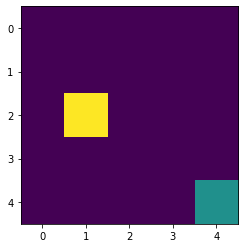

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.9788621   0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

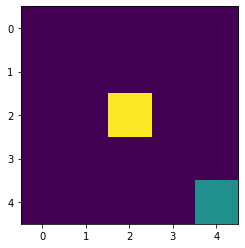

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.38990576 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

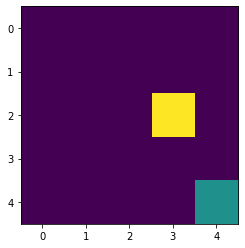

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.69399003 -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

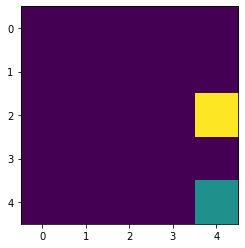

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89642969 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

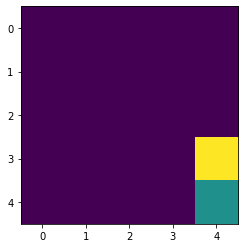

Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

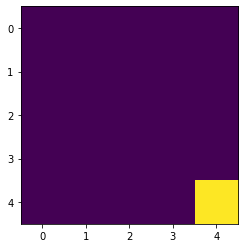

Episode: 94
Epsilon: 4.4981962247603756e-05
Total Rewards: 8
Round 95
Action: Discrete(4)
Q_table: [[[ 5.13288545 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

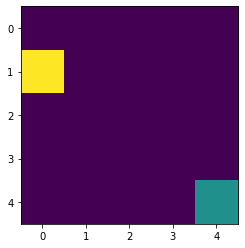

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.84860092 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

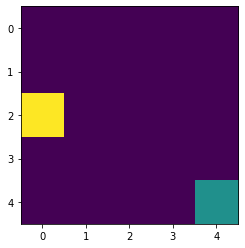

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.47010107 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

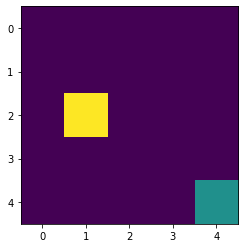

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.98606741  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

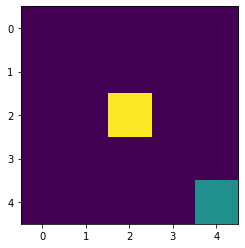

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39337429 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

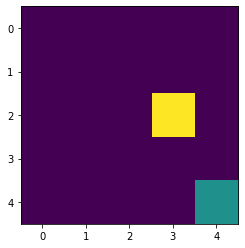

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.6952697  -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

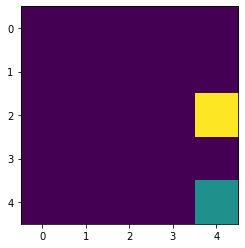

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89674973 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

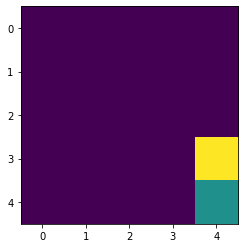

Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

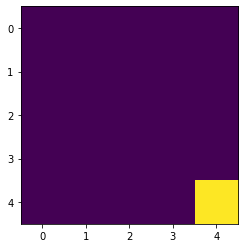

Episode: 95
Epsilon: 4.048376602284338e-05
Total Rewards: 8
Round 96
Action: Discrete(4)
Q_table: [[[ 5.15597099 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

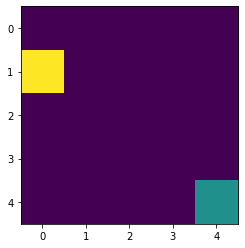

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.86604993 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

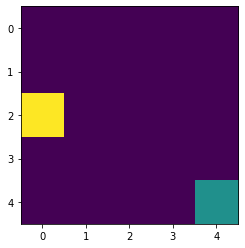

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.48183703 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

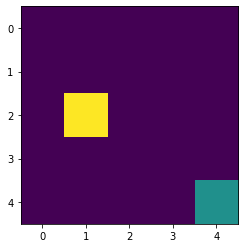

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99286435  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

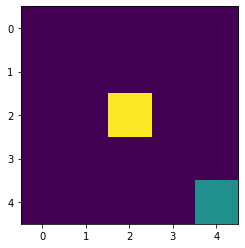

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39661113 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

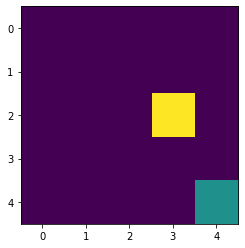

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69645021 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

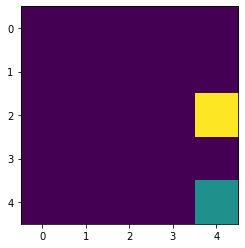

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89704145 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

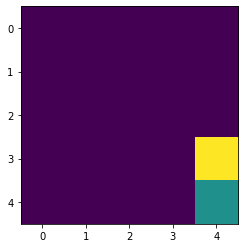

Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

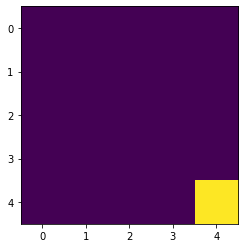

Episode: 96
Epsilon: 3.6435389420559045e-05
Total Rewards: 8
Round 97
Action: Discrete(4)
Q_table: [[[ 5.17831838 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

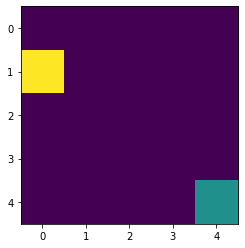

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.88281027 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

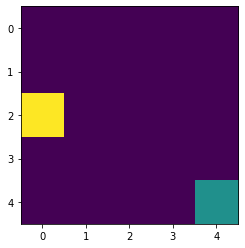

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.49301111 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

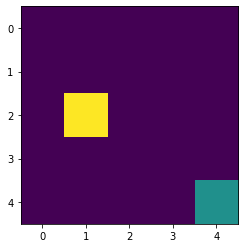

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     3.99927292  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

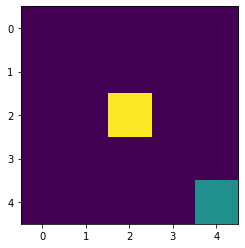

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.39963054 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

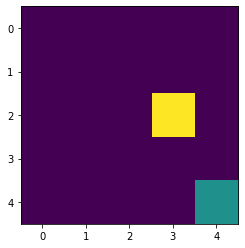

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69753892 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

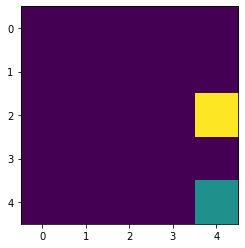

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89730734 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

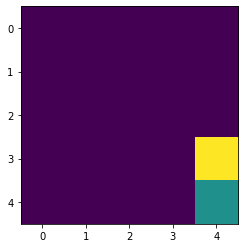

Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

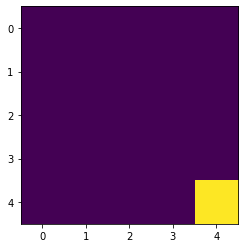

Episode: 97
Epsilon: 3.279185047850314e-05
Total Rewards: 8
Round 98
Action: Discrete(4)
Q_table: [[[ 5.19993947 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.      

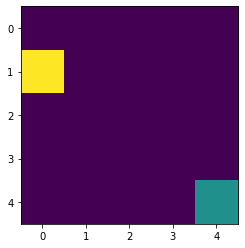

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.89890024 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

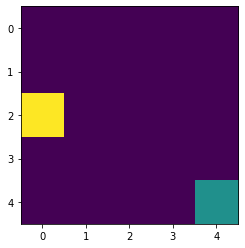

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.50364457 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

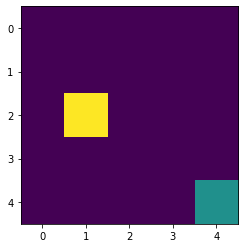

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.00531238  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

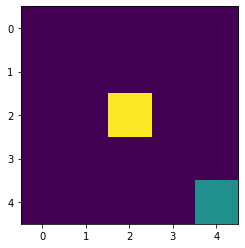

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40244599 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

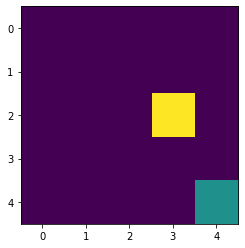

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69854269 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

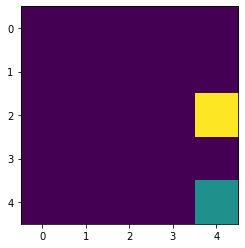

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89754963 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

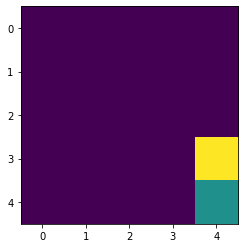

Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

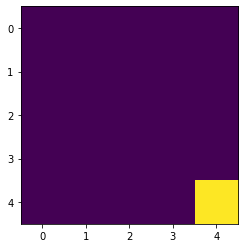

Episode: 98
Epsilon: 2.9512665430652825e-05
Total Rewards: 8
Round 99
Action: Discrete(4)
Q_table: [[[ 5.22084654 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.     

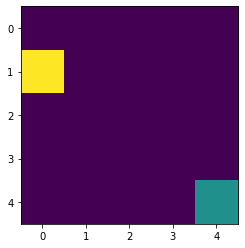

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.91433823 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

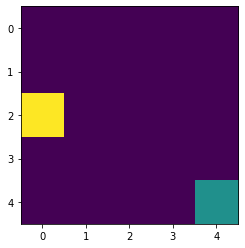

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.51375822 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

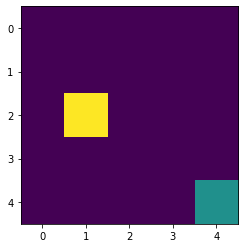

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.52337252 -0.1       ]
  [ 0.1        -0.23851     4.01100128  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

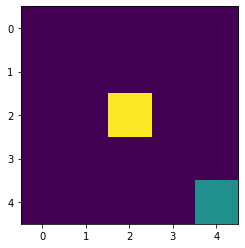

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.52337252 -0.1       ]
  [ 0.1        -0.23851     4.01635747  0.00874144]
  [ 0.          0.          3.40507023 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

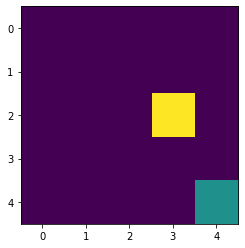

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.52337252 -0.1       ]
  [ 0.1        -0.23851     4.01635747  0.00874144]
  [ 0.          0.          3.40751532 -0.091     ]
  [ 0.1         0.          2.69946788 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

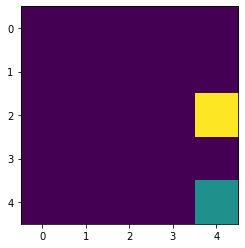

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.52337252 -0.1       ]
  [ 0.1        -0.23851     4.01635747  0.00874144]
  [ 0.          0.          3.40751532 -0.091     ]
  [ 0.1         0.          2.70032043 -0.04045072]
  [ 1.89777039 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

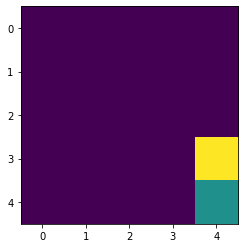

Action: Discrete(4)
Q_table: [[[ 5.24105233 -0.07368355  0.64976071 -0.14784104]
  [ 0.70078423 -0.1         0.19       -0.08209   ]
  [ 0.1         0.          0.1        -0.091     ]
  [ 0.1         0.          0.          0.        ]
  [ 0.          0.          0.          0.        ]]

 [[ 4.92914264 -0.27425622  0.22249    -0.06622731]
  [ 0.1        -0.11742083  0.62470279 -0.09019   ]
  [ 0.         -0.181       0.4339     -0.143659  ]
  [ 0.          0.          0.19       -0.22312   ]
  [ 0.1         0.         -0.1        -0.091     ]]

 [[ 0.1        -0.155971    4.52337252 -0.1       ]
  [ 0.1        -0.23851     4.01635747  0.00874144]
  [ 0.          0.          3.40751532 -0.091     ]
  [ 0.1         0.          2.70032043 -0.04045072]
  [ 1.89797151 -0.1        -0.19       -0.137098  ]]

 [[ 0.          0.          0.1        -0.19      ]
  [ 0.         -0.091       0.1        -0.1       ]
  [ 0.          0.          0.         -0.091     ]
  [ 0.          0.          0

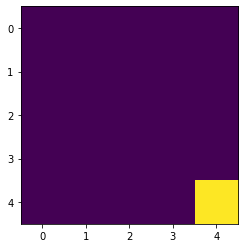

Episode: 99
Epsilon: 2.6561398887587544e-05
Total Rewards: 8


In [14]:
env = GridEnvironment() # note: we do not normalize
agent = QLearningAgent(env)
episodes = 100 # number of games we want the agent to play
delta_epsilon = agent.epsilon/episodes
decay_rate = 0.9

total_rewards = []
epsilons = [agent.epsilon]

# Training Process (Task 3) (20 points)
for i in range(episodes):
    obs = env.reset()
    done = False
    curr_state = obs.copy()
    rewards = 0

    print("Round", i)
    while not done:
        action = agent.step(curr_state)
        obs, reward, done, info = env.step(action)
        next_state = obs.copy()
        agent.update(curr_state, action, reward, next_state)
        curr_state = next_state.copy()
        rewards += reward
        
        print("State", curr_state)
        env.render()
        plt.show()
        
    #Exponential Decay Epsilon
    
    #As delta_epsilon is too low for exponential decay, so using a higher decay rate instead
    new_epsilon = agent.epsilon * decay_rate  #agent.epsilon * delta_epsilon
    agent.set_epsilon(new_epsilon)
    epsilons.append(new_epsilon)
    
    total_rewards.append(rewards)
    if i%1 ==0 :
      print("Episode:",i)
      print("Epsilon:",new_epsilon)
      print("Total Rewards:",rewards)


#### Visualize $\epsilon$
Plot our value of $\epsilon$ over each episode

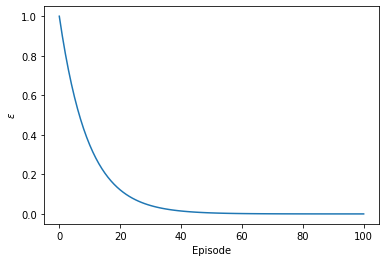

In [10]:
plt.xlabel('Episode')
plt.ylabel('$\epsilon$')
plt.plot(epsilons)

#### Visualize Rewards
Plot total_rewards per episode.  We apply a rolling mean of window $10$ to visualize easier.

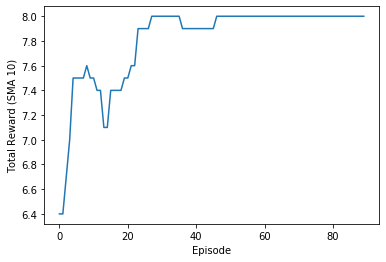

In [11]:
window = 10
plt.xlabel('Episode')
plt.ylabel('Total Reward (SMA 10)')
plt.plot([np.mean(total_rewards[tr:tr+window]) for tr in range(window, len(total_rewards))])

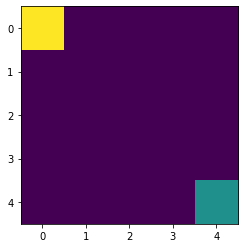

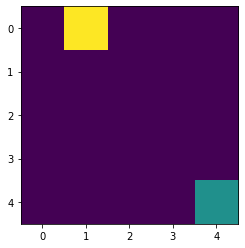

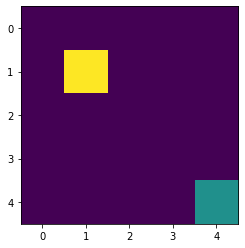

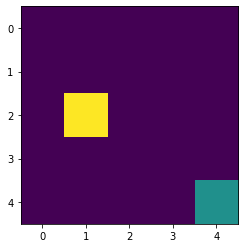

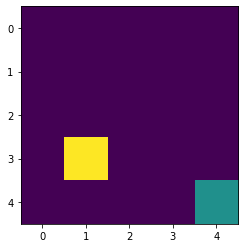

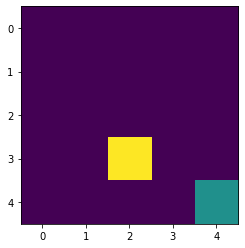

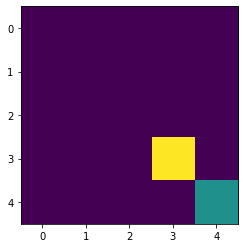

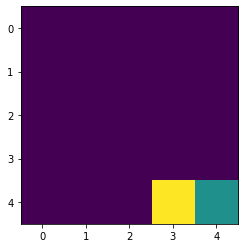

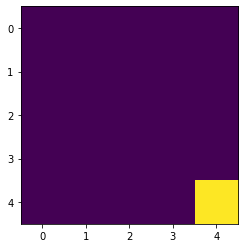

In [12]:
env = GridEnvironment()

obs = env.reset()
done = False
agent.epsilon = 0
env.render()
plt.ion()
plt.show()

while not done:
    action = agent.step(obs)
    obs, reward, done, info = env.step(action)
    env.render()
    plt.show()
    plt.pause(0.05)